In [1]:
!pip install prophet

   ---------------------------------------- 0.0/13.3 MB ? eta -:--:--
    --------------------------------------- 0.3/13.3 MB ? eta -:--:--
   -------- ------------------------------- 2.9/13.3 MB 12.0 MB/s eta 0:00:01
   ---------------------------------------  13.1/13.3 MB 28.4 MB/s eta 0:00:01
   ---------------------------------------  13.1/13.3 MB 28.4 MB/s eta 0:00:01
   ---------------------------------------  13.1/13.3 MB 28.4 MB/s eta 0:00:01
   ---------------------------------------- 13.3/13.3 MB 12.1 MB/s eta 0:00:00
   ---------------------------------------- 0.0/1.2 MB ? eta -:--:--
   ----------------------------------- ---- 1.0/1.2 MB 52.4 MB/s eta 0:00:01
   ---------------------------------------- 1.2/1.2 MB 3.4 MB/s eta 0:00:00


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, root_mean_squared_error
import time
from prophet.diagnostics import cross_validation, performance_metrics
from itertools import product

In [2]:
df = pd.read_csv('BER Eq sales data full-date.csv')

## EDA

In [3]:
df

,InvoiceDate,InventoryWarehouseId,ProductNumber,ProductName,Sum of InvoicedQuantity,PrimaryVendorAccountNumber
0,01/01/2020,RKSQR,BURBER002,NaN,1,NaN
1,01/01/2020,JDSQR,COKBER001,NaN,1,NaN
2,01/01/2020,KMSQR,COKBER001,NaN,1,NaN
3,01/01/2020,MDSQR,COKBER001,NaN,1,NaN
4,01/01/2020,DMSQR,FRYBER002,NaN,2,NaN
...,...,...,...,...,...,...
7560,31/12/2024,DMSQR,GRLBER009,NaN,1,NaN
7561,31/12/2024,MDSQR,GRLBER020,NaN,1,NaN
7562,31/12/2024,QSSQR,OVEBER002,NaN,1,NaN
7563,31/12/2024,RDSQR,OVEBER011,NaN,1,NaN


In [4]:
df['ProductNumber'].nunique()

61

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7565 entries, 0 to 7564
Data columns (total 6 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   InvoiceDate                 7565 non-null   object
 1   InventoryWarehouseId        7565 non-null   object
 2   ProductNumber               7565 non-null   object
 3   ProductName                 2219 non-null   object
 4   Sum of InvoicedQuantity     7565 non-null   int64 
 5   PrimaryVendorAccountNumber  2219 non-null   object
dtypes: int64(1), object(5)
memory usage: 354.7+ KB


## Data pre-processing

In [6]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'], dayfirst=True)

In [7]:
df = df.drop(columns= ['PrimaryVendorAccountNumber', 'ProductName'], axis= True)

In [8]:
df.head()

,InvoiceDate,InventoryWarehouseId,ProductNumber,Sum of InvoicedQuantity
0,2020-01-01,RKSQR,BURBER002,1
1,2020-01-01,JDSQR,COKBER001,1
2,2020-01-01,KMSQR,COKBER001,1
3,2020-01-01,MDSQR,COKBER001,1
4,2020-01-01,DMSQR,FRYBER002,2


In [9]:
df['InventoryWarehouseId_dup'] = df['InventoryWarehouseId']
df['ProductNumber_dup'] = df['ProductNumber']

In [10]:
df

,InvoiceDate,InventoryWarehouseId,ProductNumber,Sum of InvoicedQuantity,InventoryWarehouseId_dup,ProductNumber_dup
0,2020-01-01,RKSQR,BURBER002,1,RKSQR,BURBER002
1,2020-01-01,JDSQR,COKBER001,1,JDSQR,COKBER001
2,2020-01-01,KMSQR,COKBER001,1,KMSQR,COKBER001
3,2020-01-01,MDSQR,COKBER001,1,MDSQR,COKBER001
4,2020-01-01,DMSQR,FRYBER002,2,DMSQR,FRYBER002
...,...,...,...,...,...,...
7560,2024-12-31,DMSQR,GRLBER009,1,DMSQR,GRLBER009
7561,2024-12-31,MDSQR,GRLBER020,1,MDSQR,GRLBER020
7562,2024-12-31,QSSQR,OVEBER002,1,QSSQR,OVEBER002
7563,2024-12-31,RDSQR,OVEBER011,1,RDSQR,OVEBER011


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7565 entries, 0 to 7564
Data columns (total 6 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   InvoiceDate               7565 non-null   datetime64[ns]
 1   InventoryWarehouseId      7565 non-null   object        
 2   ProductNumber             7565 non-null   object        
 3   Sum of InvoicedQuantity   7565 non-null   int64         
 4   InventoryWarehouseId_dup  7565 non-null   object        
 5   ProductNumber_dup         7565 non-null   object        
dtypes: datetime64[ns](1), int64(1), object(4)
memory usage: 354.7+ KB


In [12]:
df.describe()

,InvoiceDate,Sum of InvoicedQuantity
count,7565,7565.000000
mean,2022-04-22 06:40:29.821546496,1.099802
min,2020-01-01 00:00:00,-10.000000
25%,2021-03-16 00:00:00,1.000000
50%,2022-04-05 00:00:00,1.000000
75%,2023-04-27 00:00:00,1.000000
max,2024-12-31 00:00:00,33.000000
std,NaN,1.138229


In [13]:
raw_data_group = df.groupby(['ProductNumber', 'InvoiceDate'], as_index=False)['Sum of InvoicedQuantity'].sum()
raw_data_group

,ProductNumber,InvoiceDate,Sum of InvoicedQuantity
0,BOLBER001,2020-01-07,2
1,BOLBER001,2020-01-30,3
2,BOLBER001,2020-02-10,1
3,BOLBER001,2020-02-22,-1
4,BOLBER001,2020-03-02,10
...,...,...,...
6375,WARBER024,2023-02-25,1
6376,WARBER024,2023-02-28,1
6377,WARBER024,2023-03-06,1
6378,WARBER024,2024-02-07,1


Raw data historical demand for Product: BOLBER001


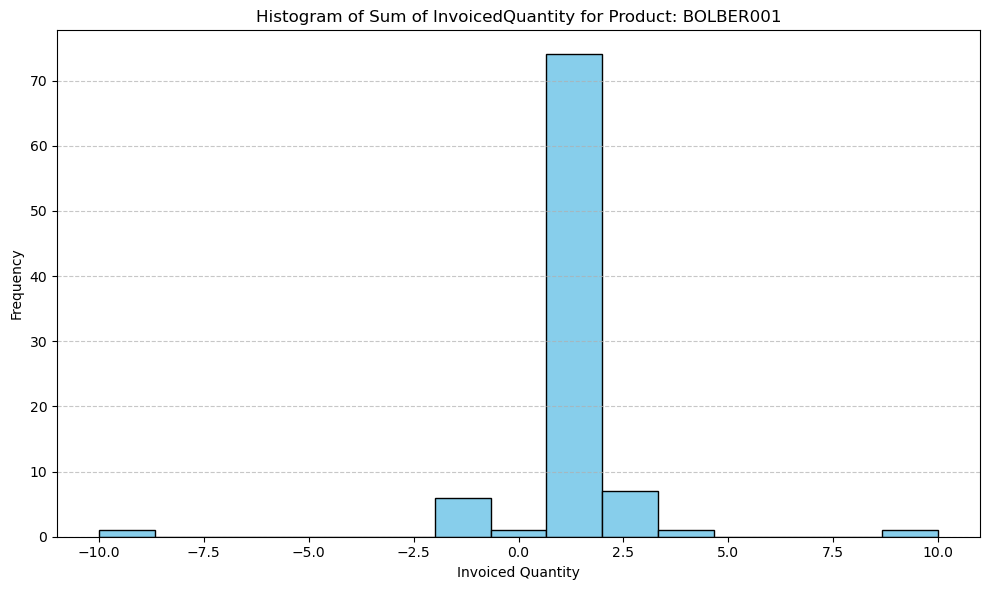

Raw data historical demand for Product: BOLBER002


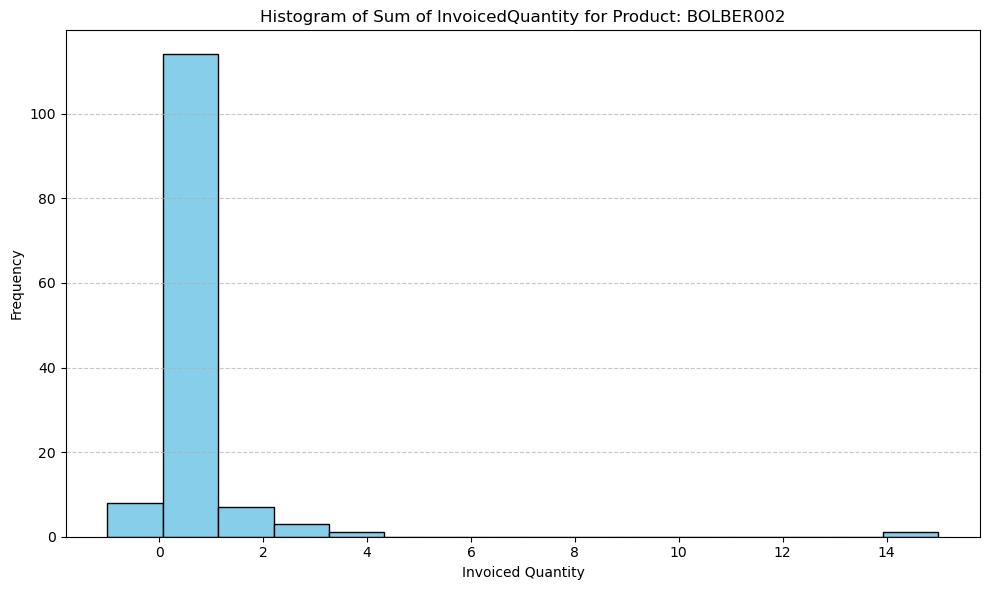

Raw data historical demand for Product: BOLBER003


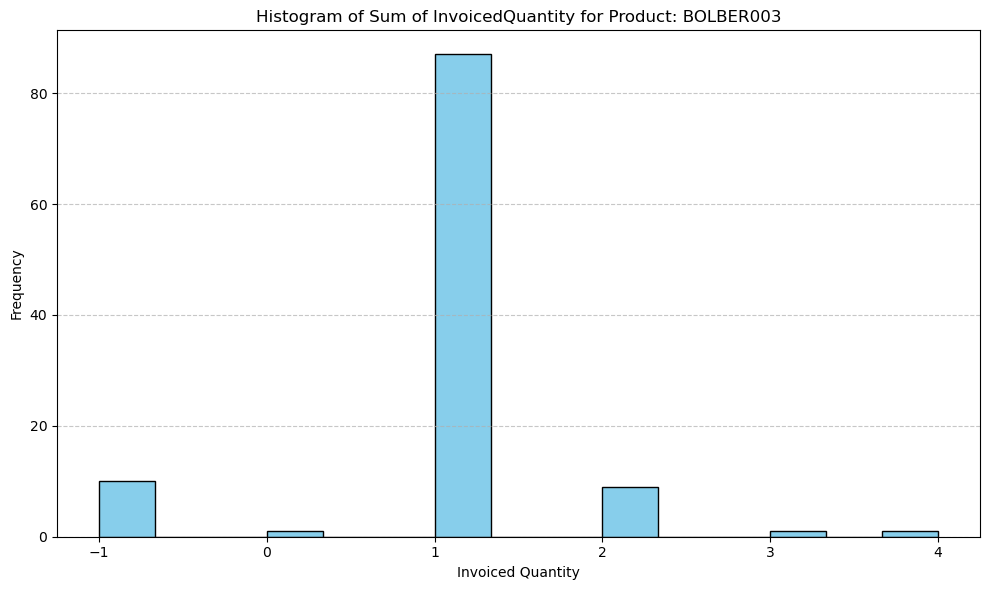

Raw data historical demand for Product: BOLBER005


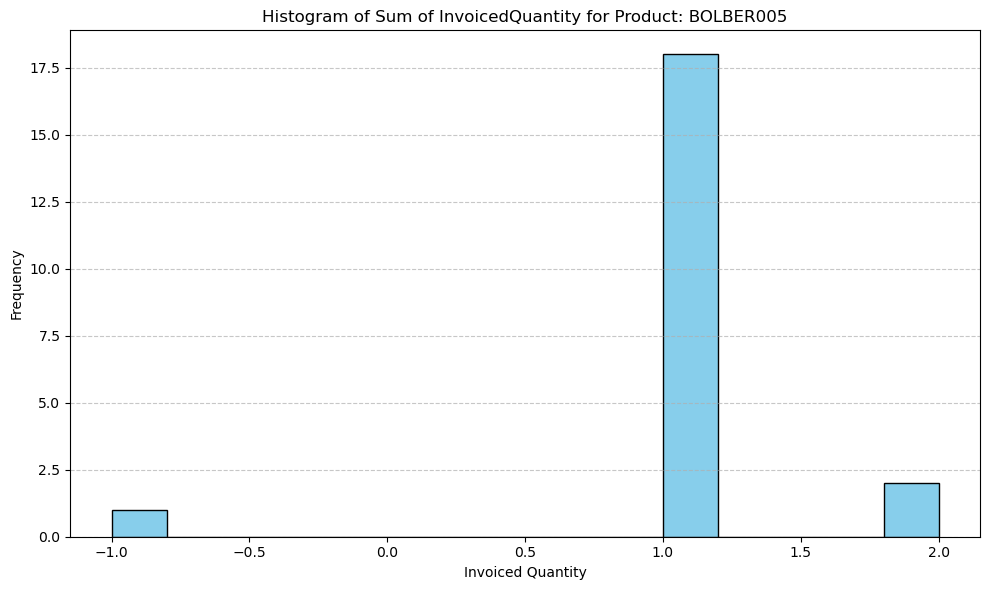

Raw data historical demand for Product: BURBER001


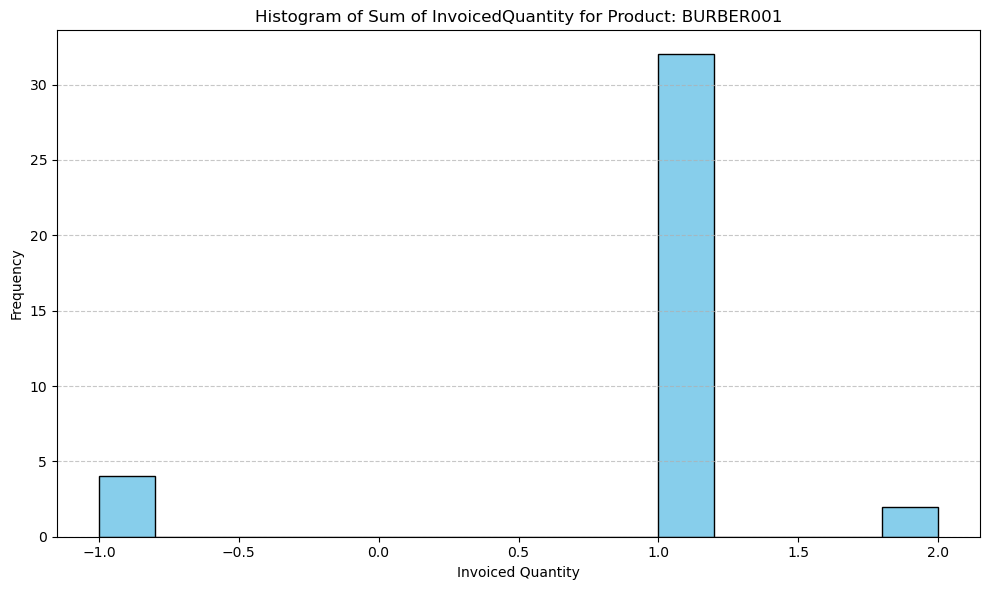

Raw data historical demand for Product: BURBER002


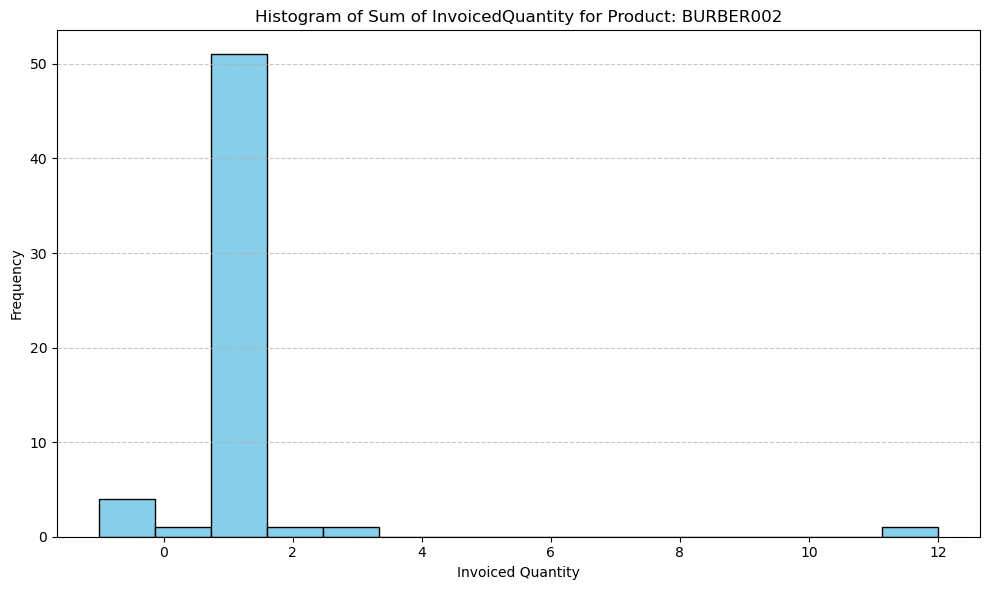

Raw data historical demand for Product: BURBER003


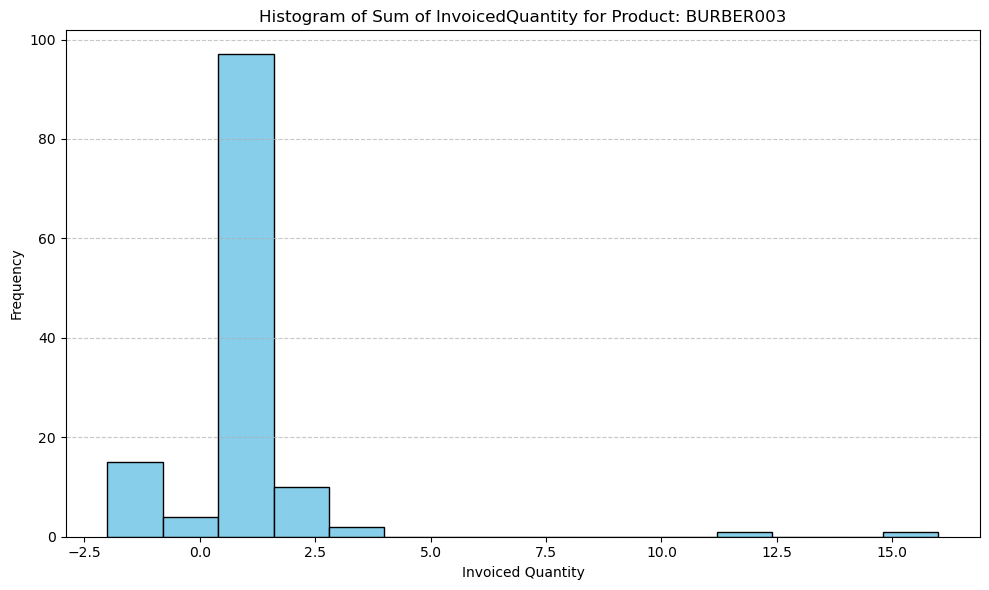

Raw data historical demand for Product: BURBER004


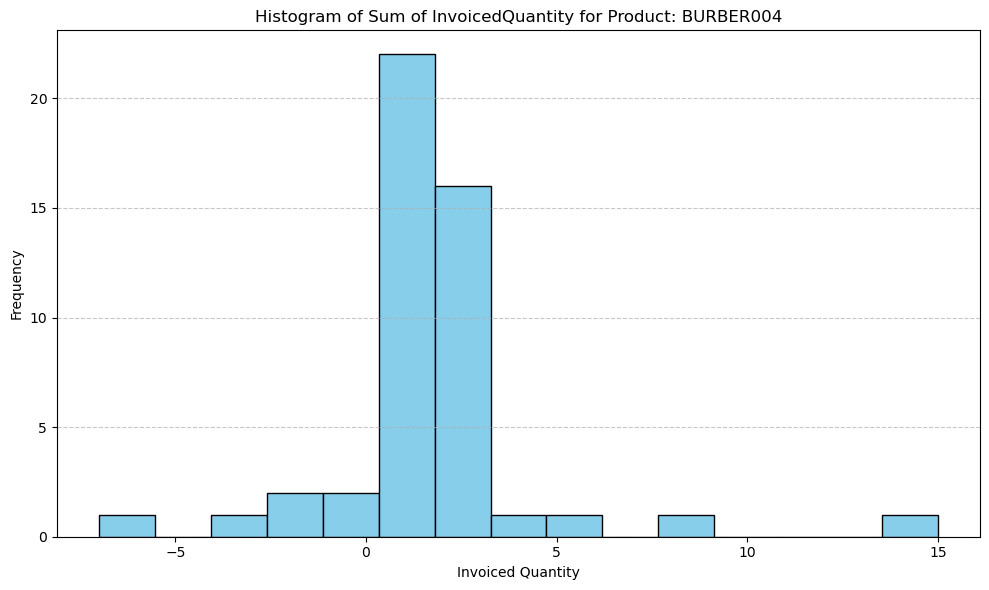

Raw data historical demand for Product: BURBER007


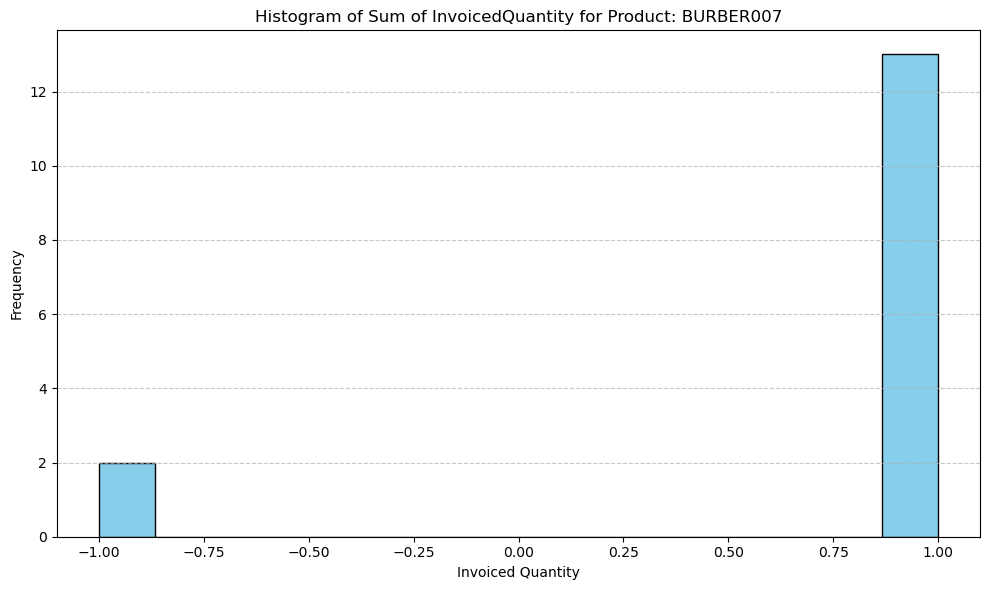

Raw data historical demand for Product: COFBER001


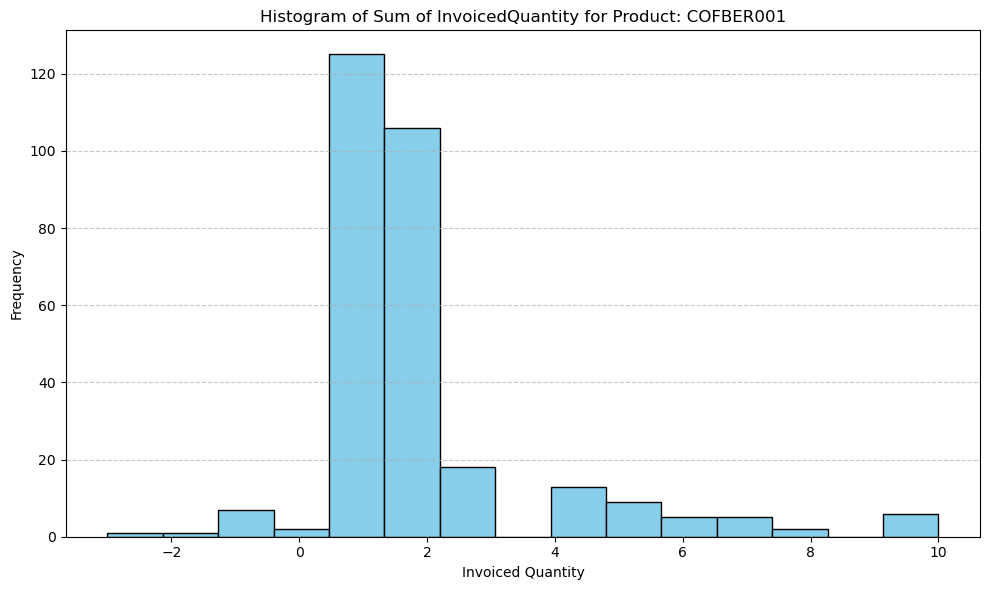

Raw data historical demand for Product: COKBER001


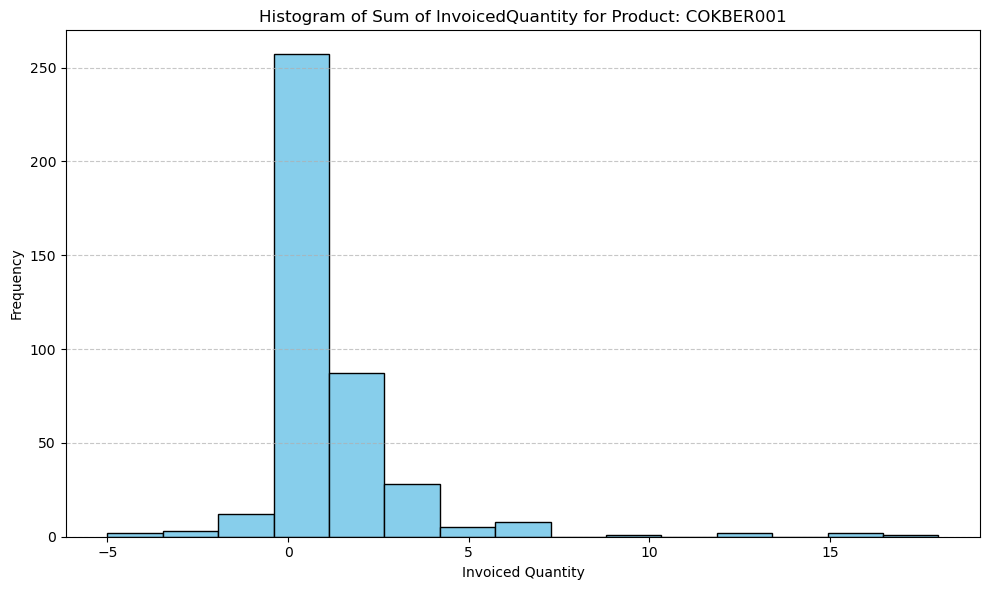

Raw data historical demand for Product: FRYBER002


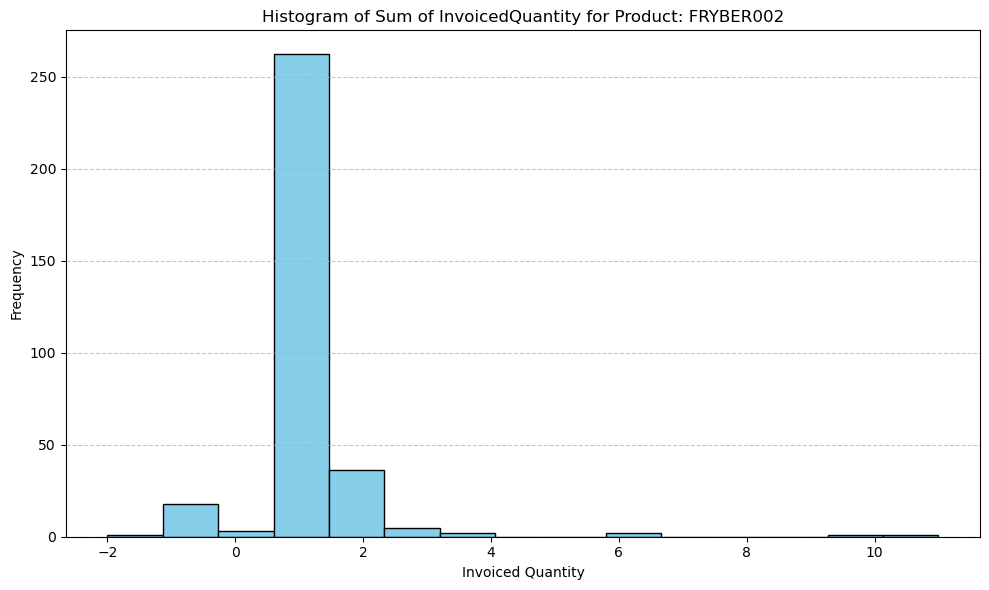

Raw data historical demand for Product: FRYBER003


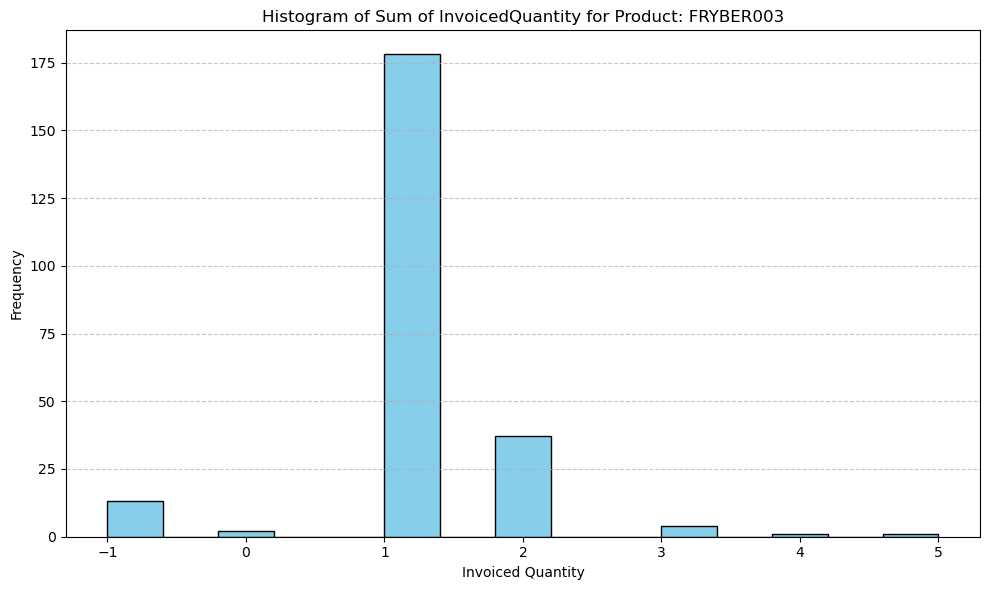

Raw data historical demand for Product: FRYBER005


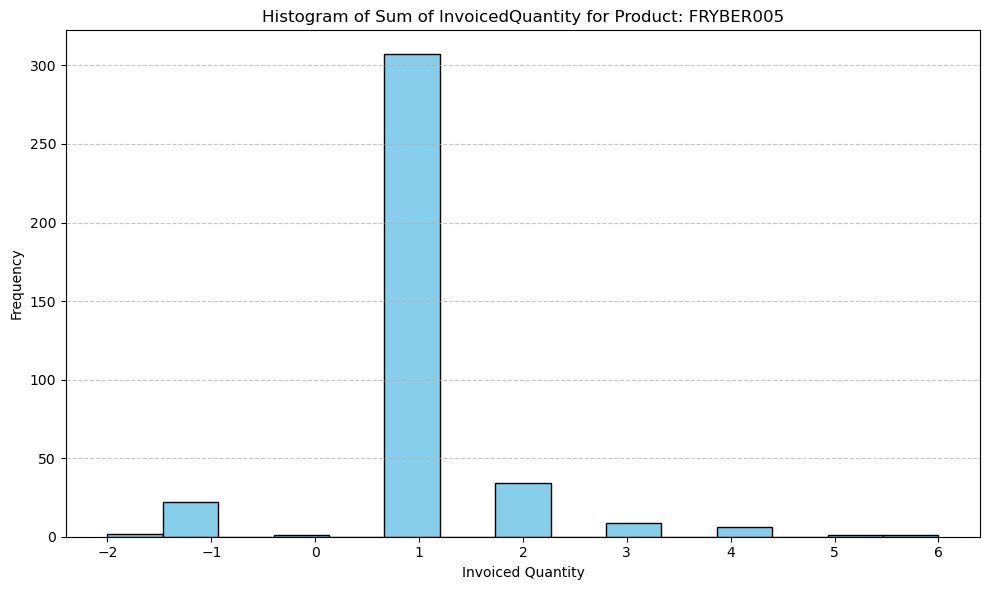

Raw data historical demand for Product: GRLBER003


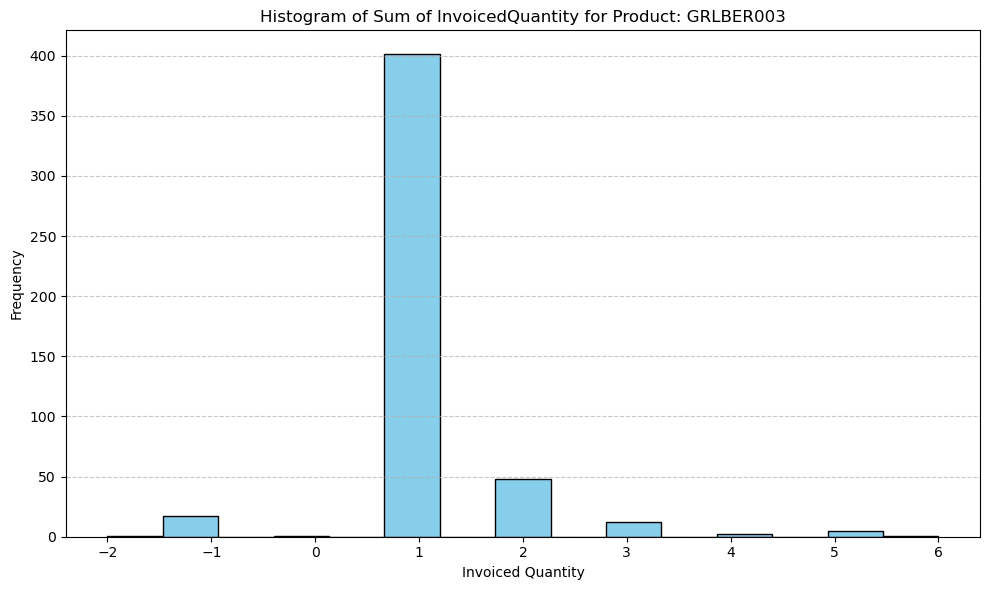

Raw data historical demand for Product: GRLBER004


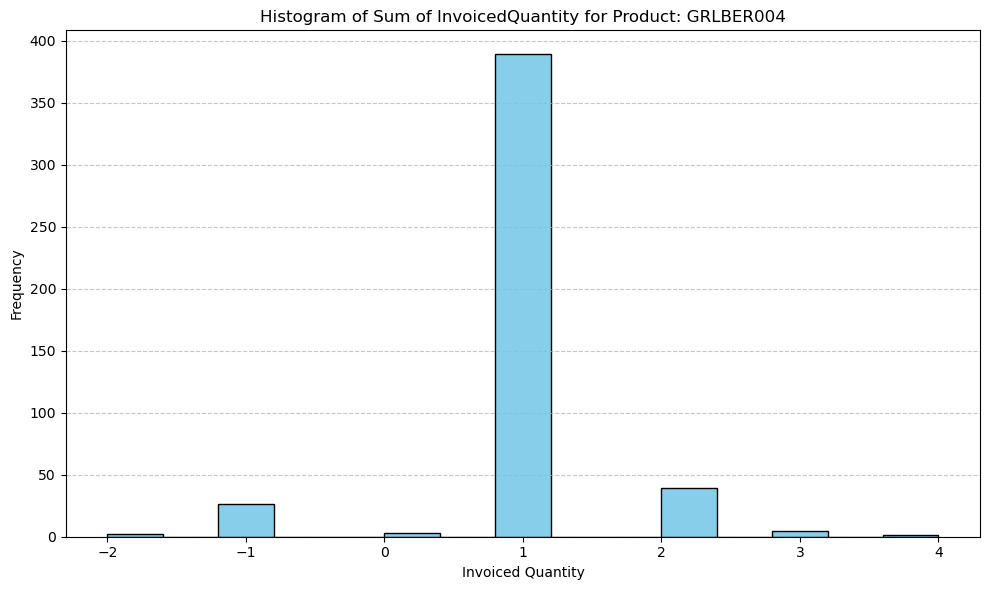

Raw data historical demand for Product: GRLBER009


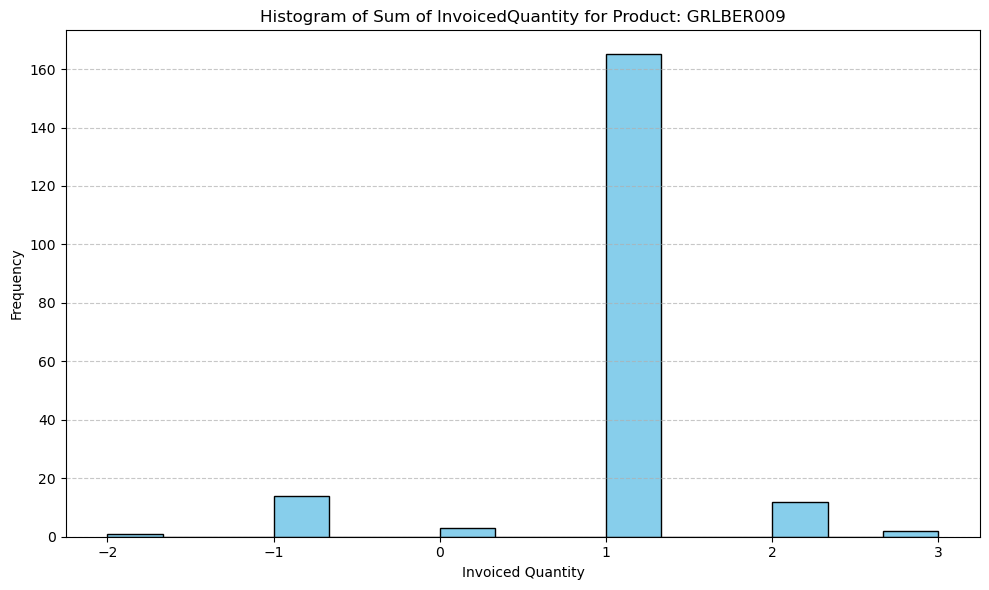

Raw data historical demand for Product: GRLBER010


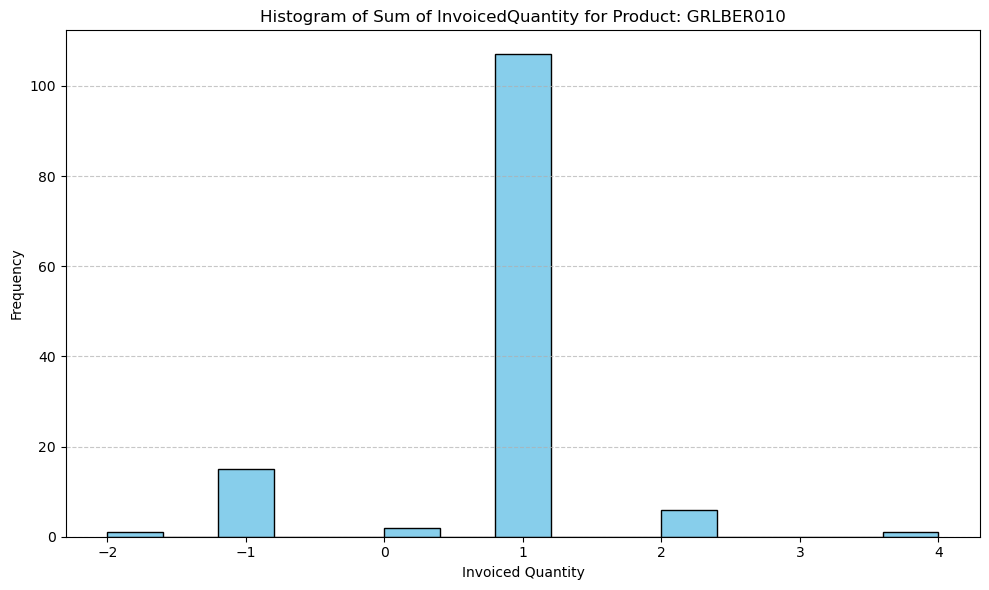

Raw data historical demand for Product: GRLBER011


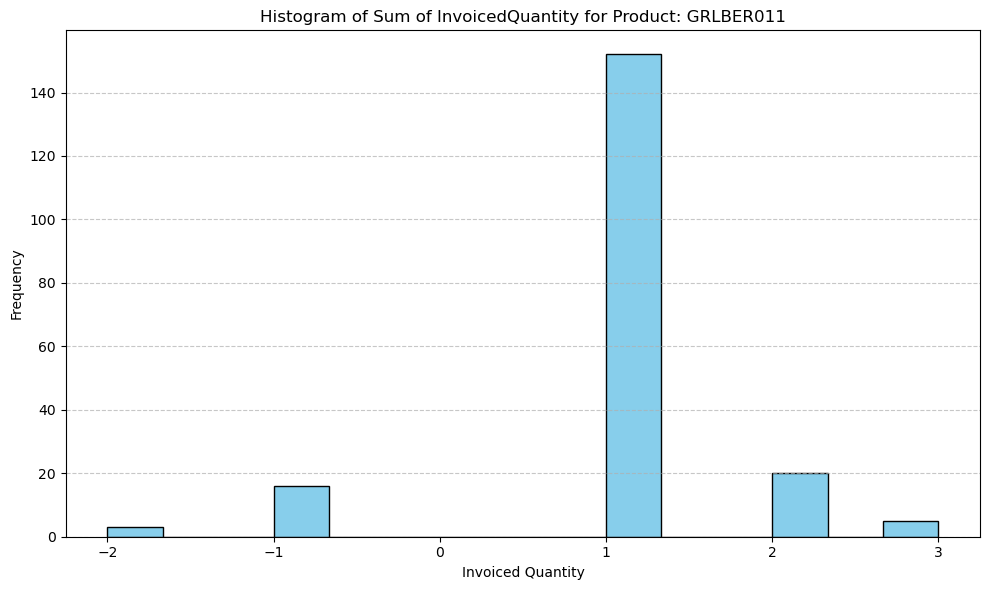

Raw data historical demand for Product: GRLBER012


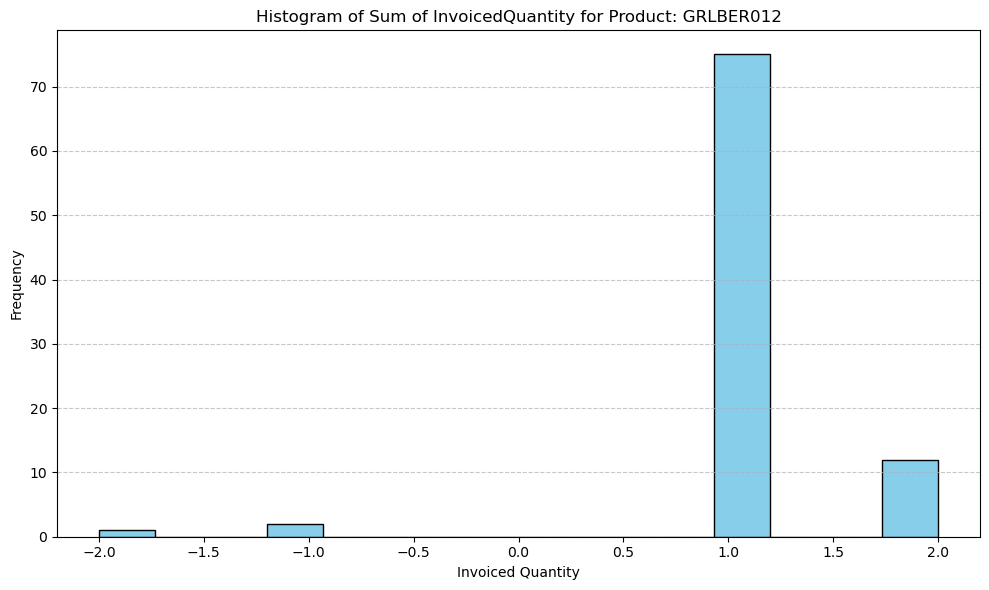

Raw data historical demand for Product: GRLBER015


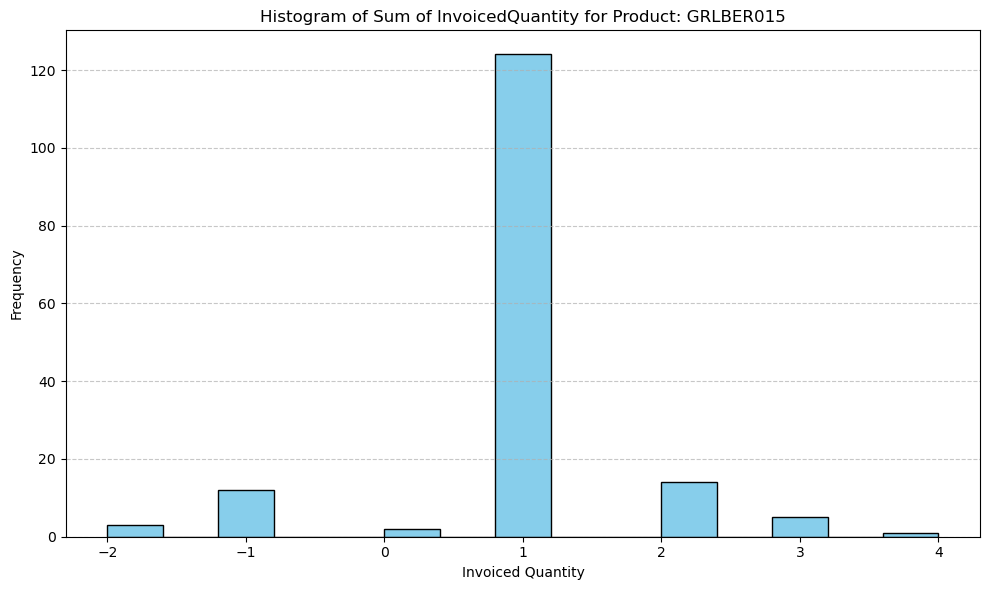

Raw data historical demand for Product: GRLBER019


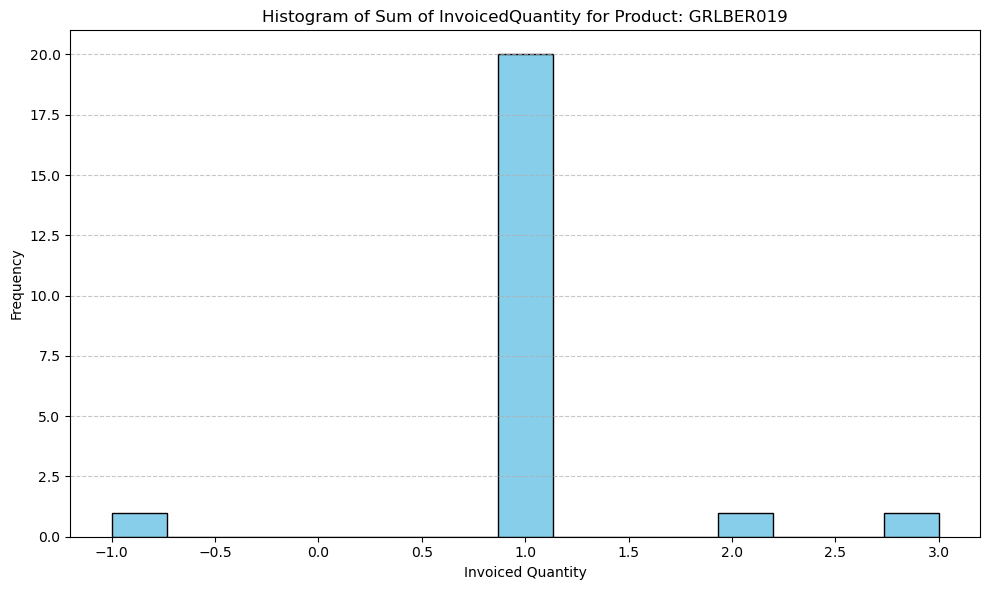

Raw data historical demand for Product: GRLBER020


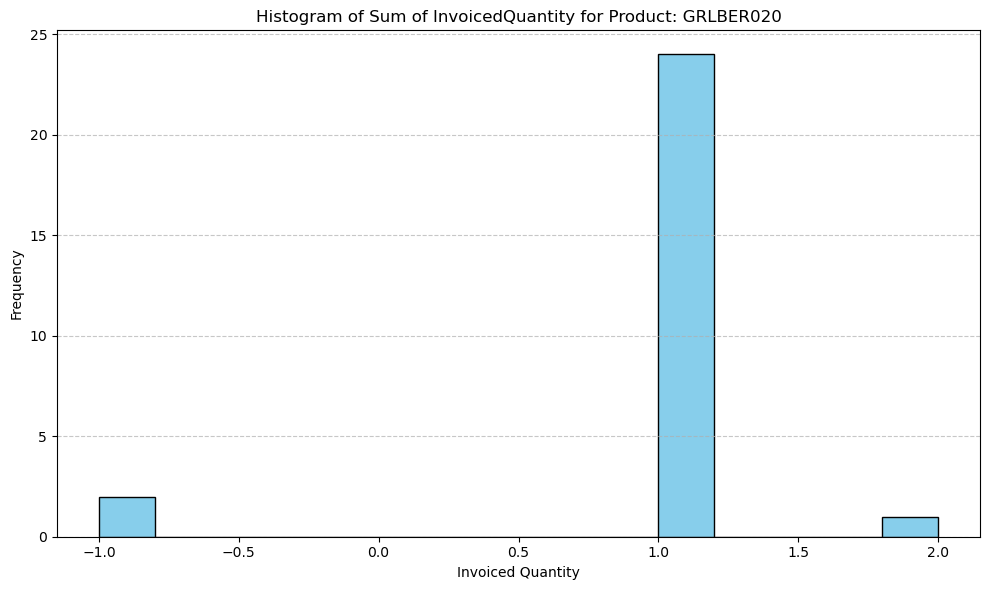

Raw data historical demand for Product: HEABER001


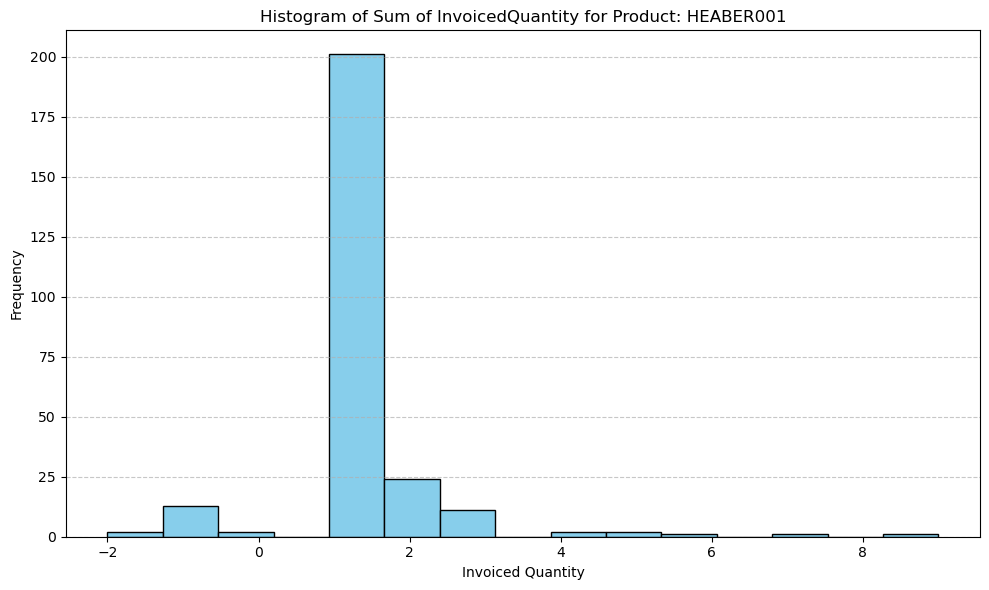

Raw data historical demand for Product: HOTBER001


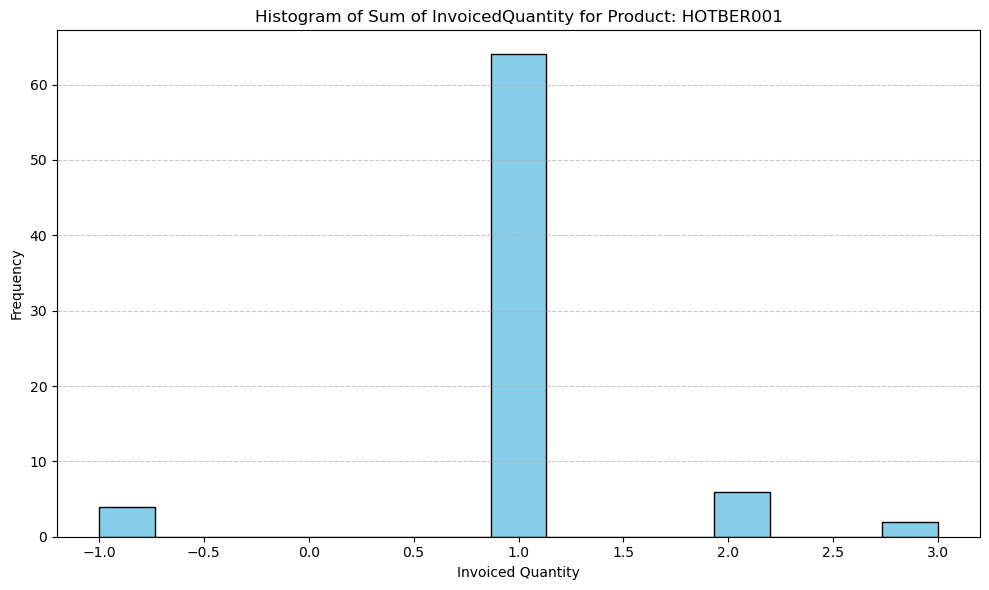

Raw data historical demand for Product: HOTBER002


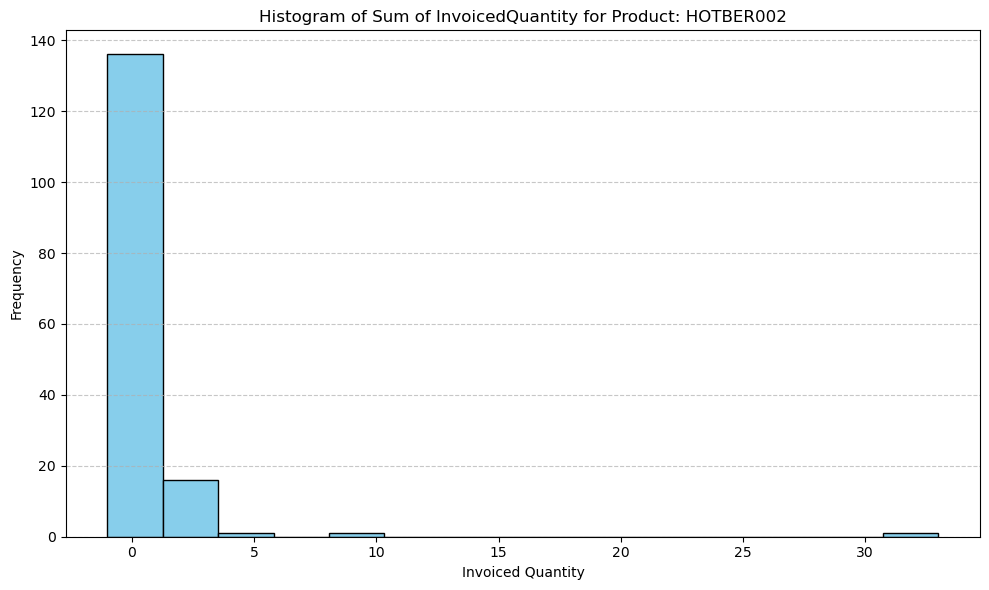

Raw data historical demand for Product: HOTBER003


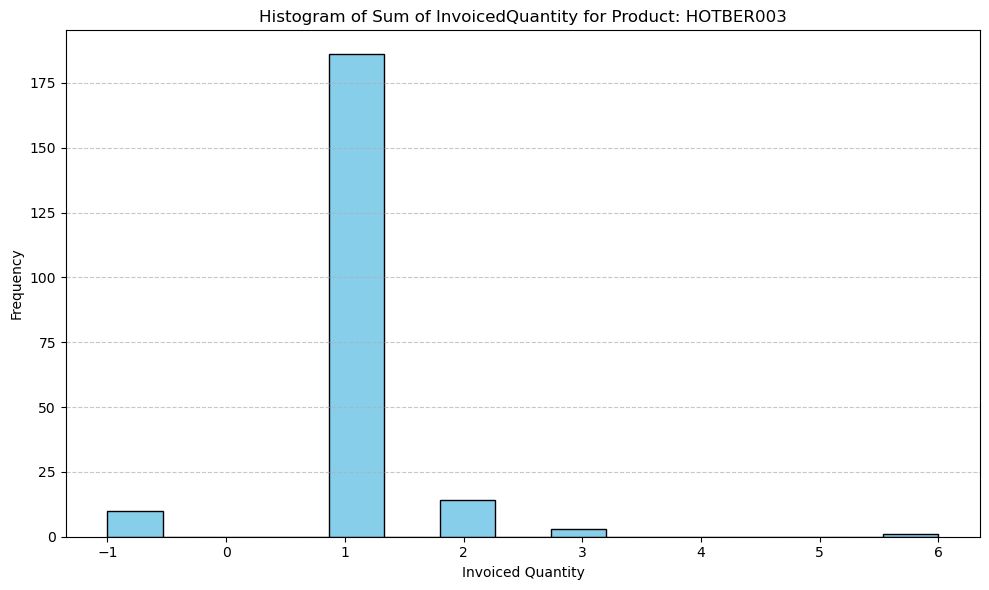

Raw data historical demand for Product: ICMBER002


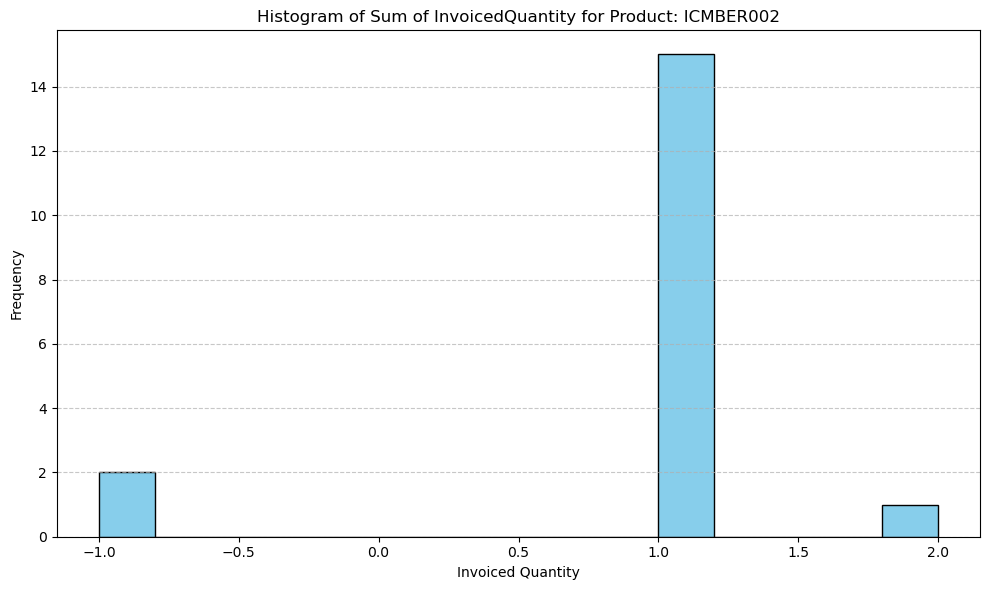

Raw data historical demand for Product: ICMBER003


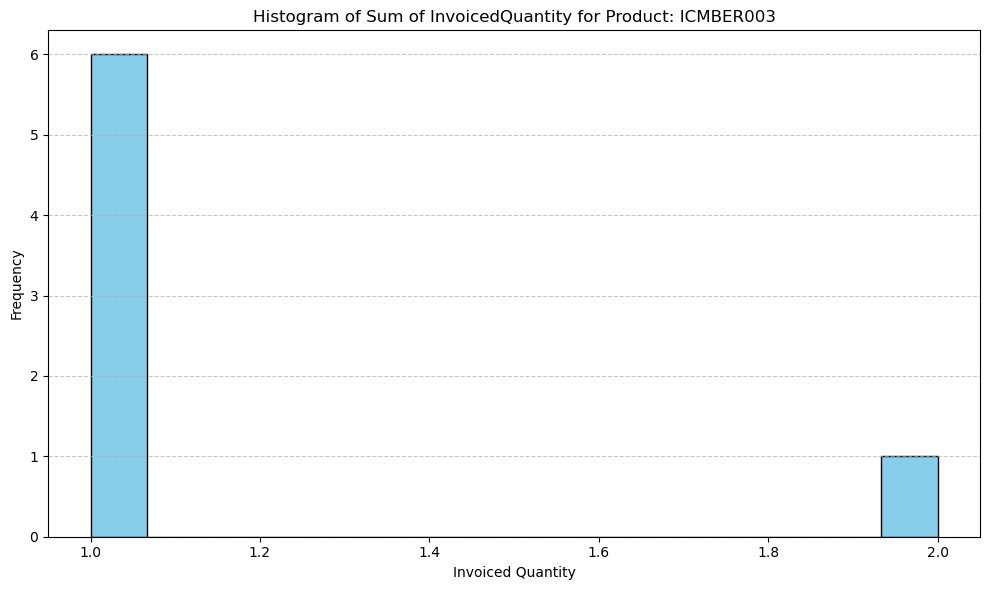

Raw data historical demand for Product: MIXBER001


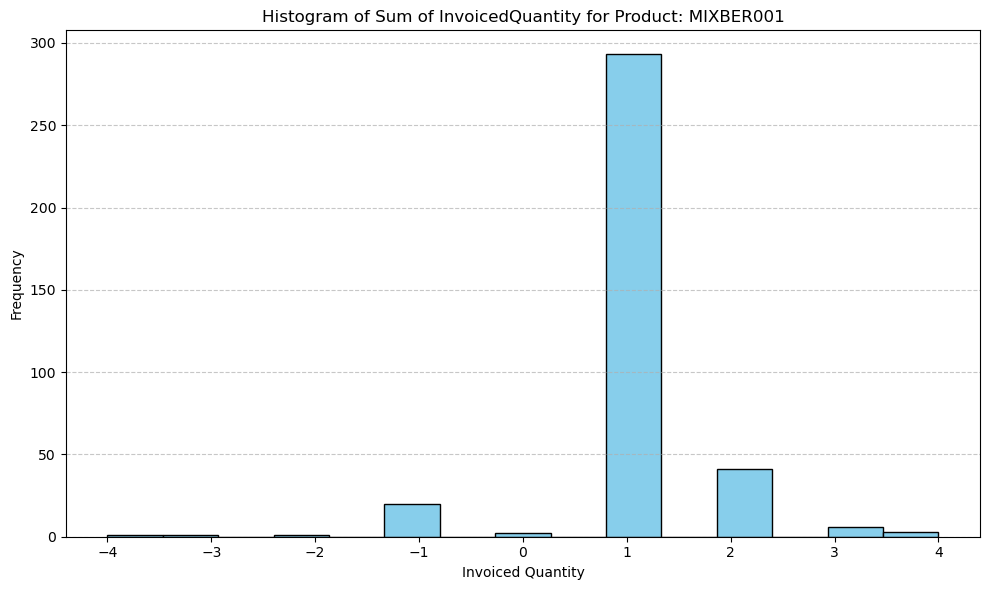

Raw data historical demand for Product: MIXBER003


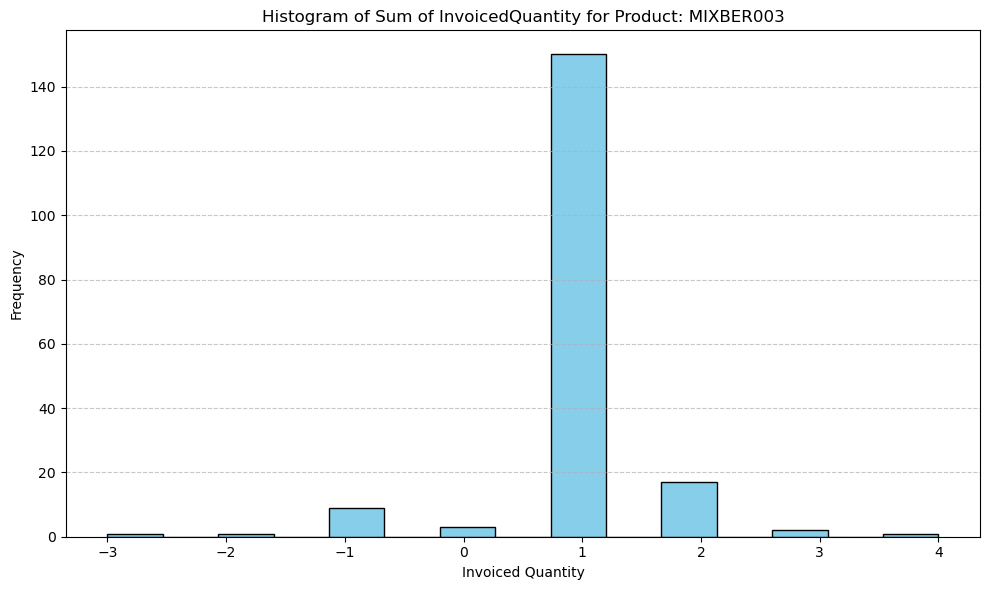

Raw data historical demand for Product: OVEBER002


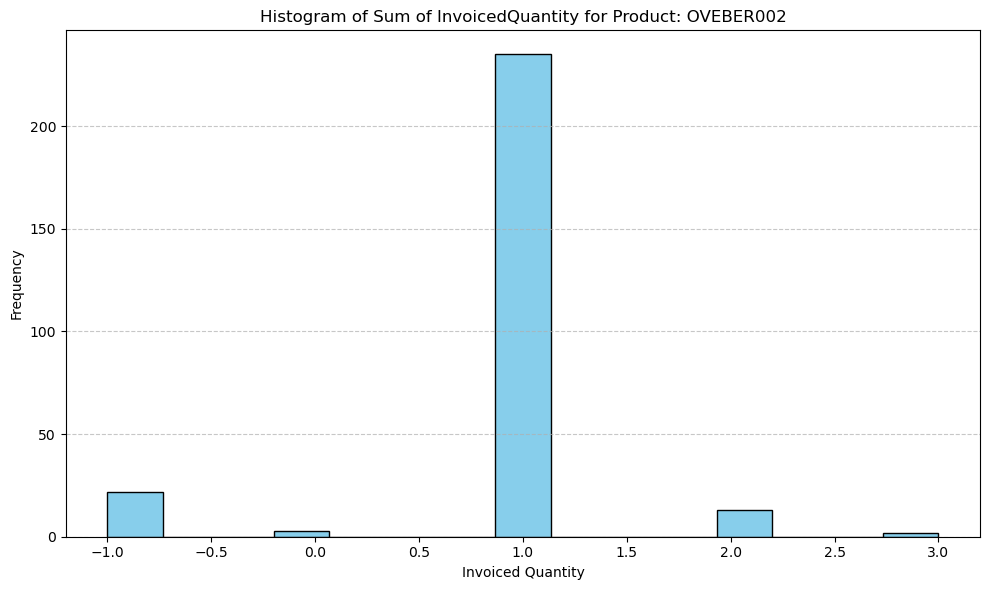

Raw data historical demand for Product: OVEBER005


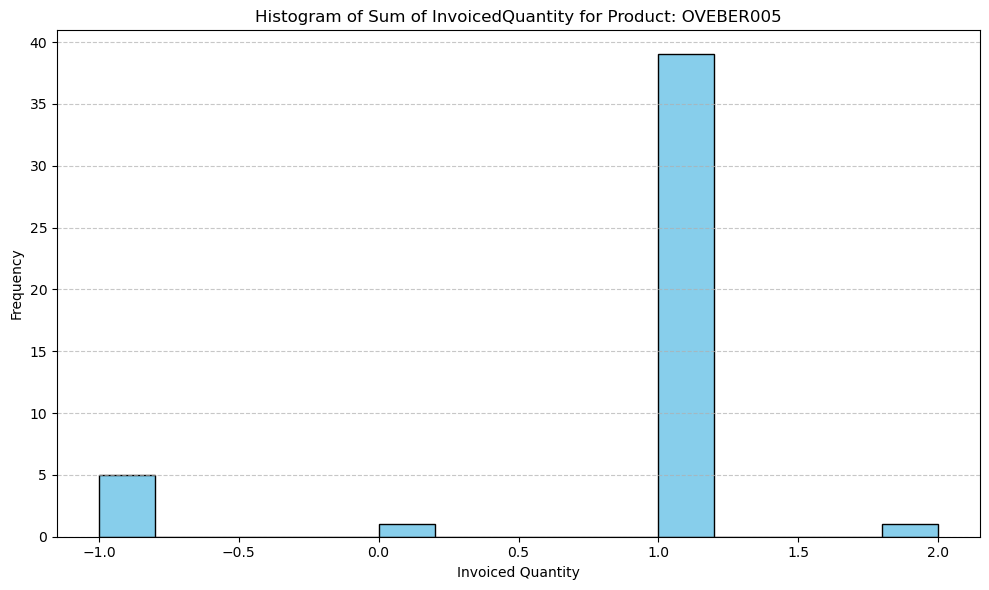

Raw data historical demand for Product: OVEBER006


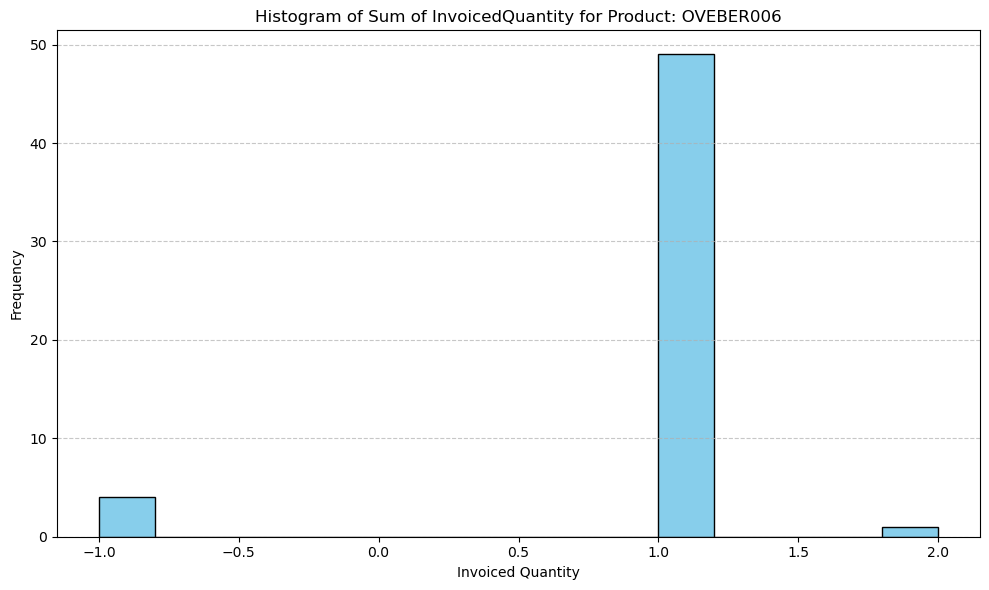

Raw data historical demand for Product: OVEBER011


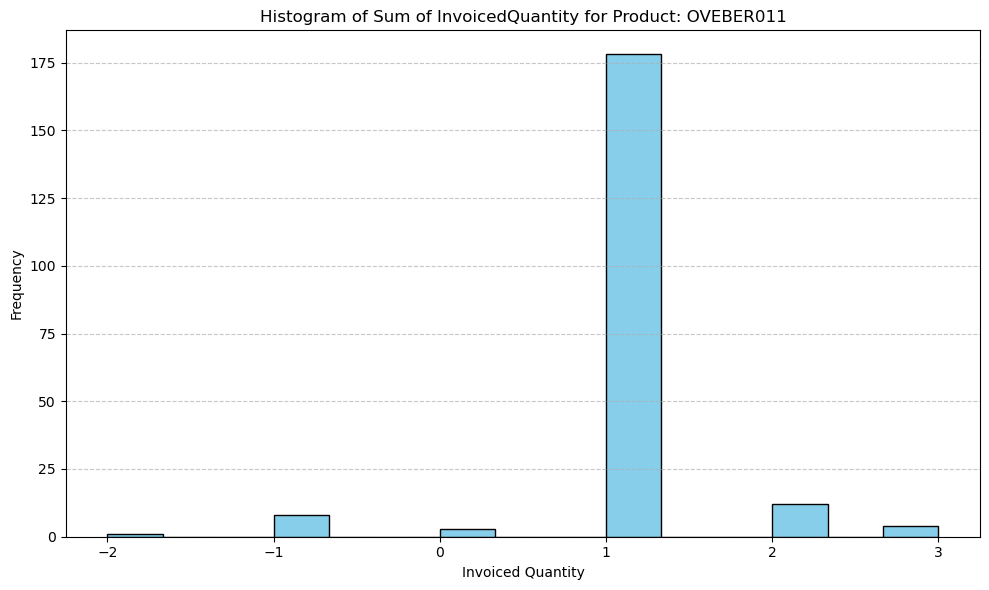

Raw data historical demand for Product: OVEBER012


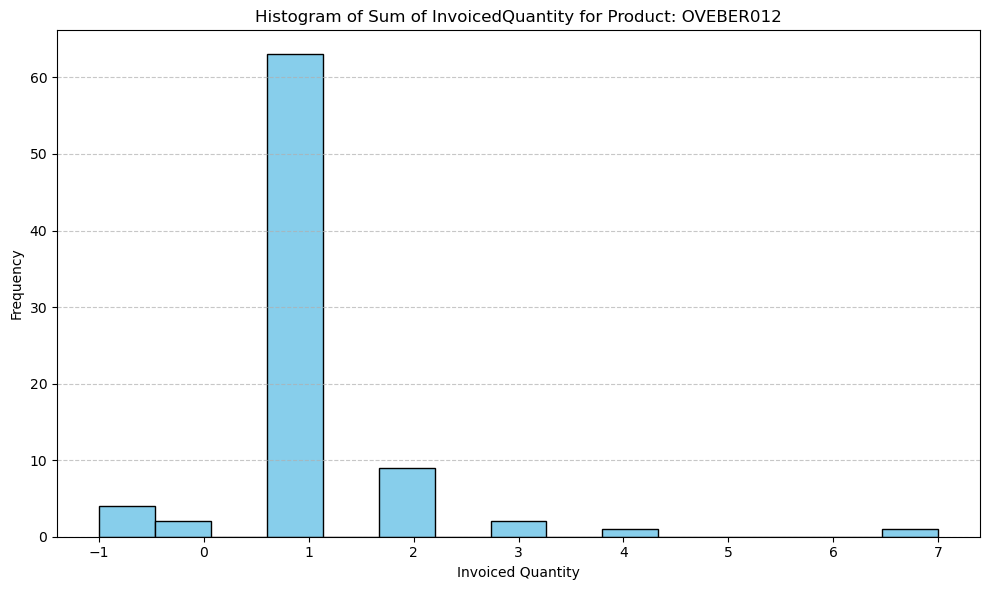

Raw data historical demand for Product: OVEBER013


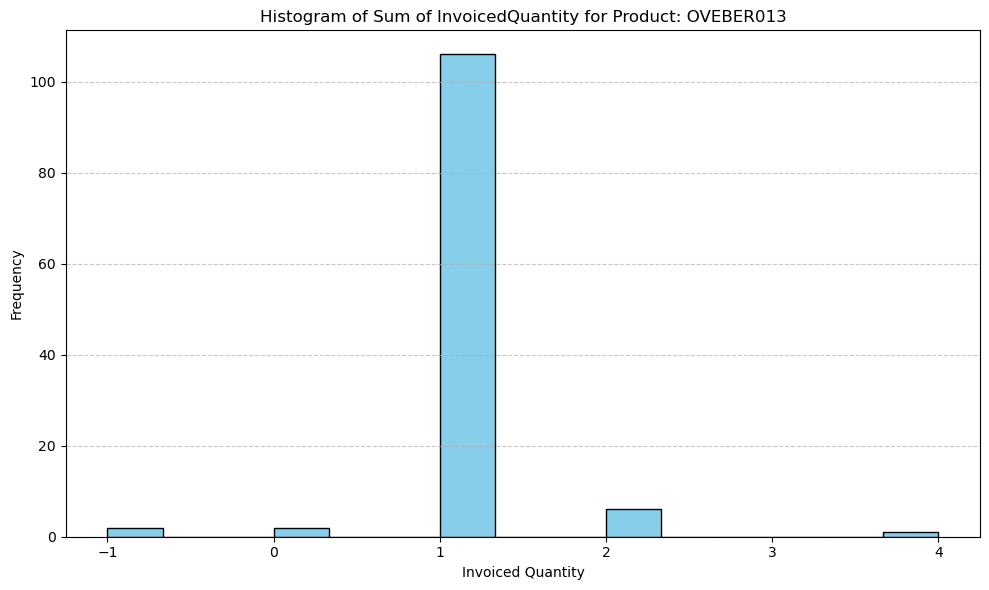

Raw data historical demand for Product: OVEBER014


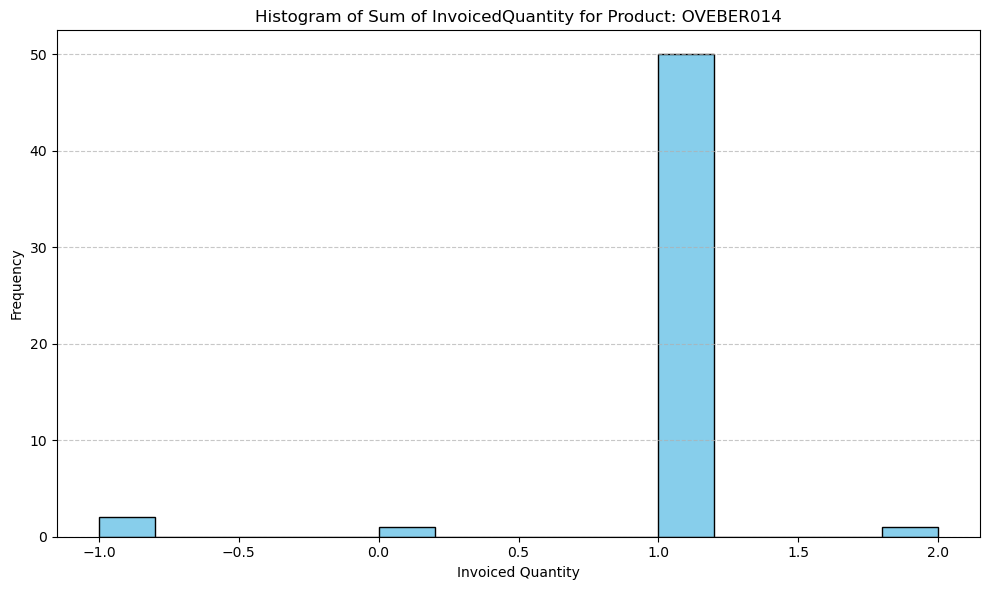

Raw data historical demand for Product: OVEBER015


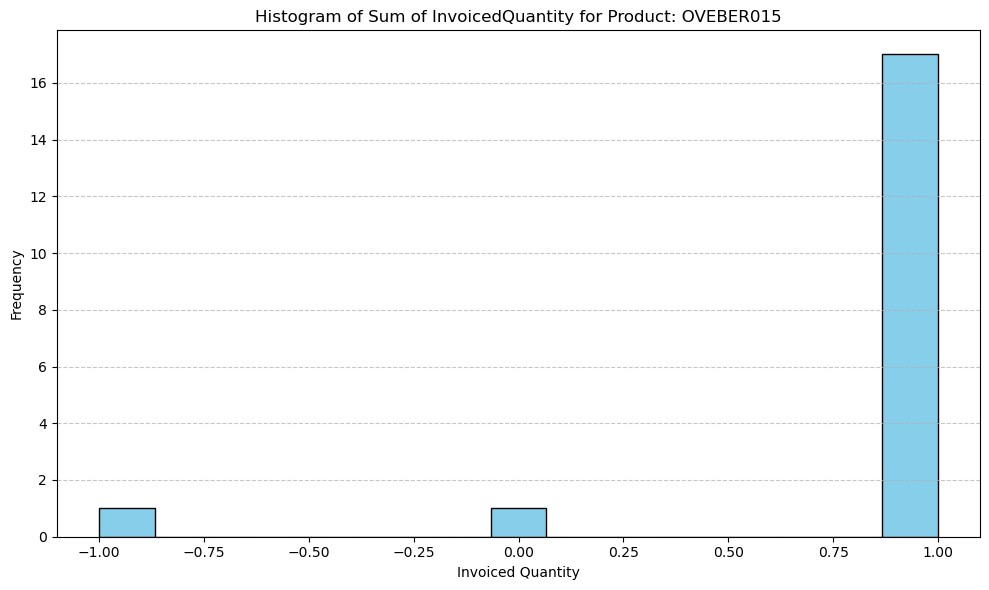

Raw data historical demand for Product: OVEBER016


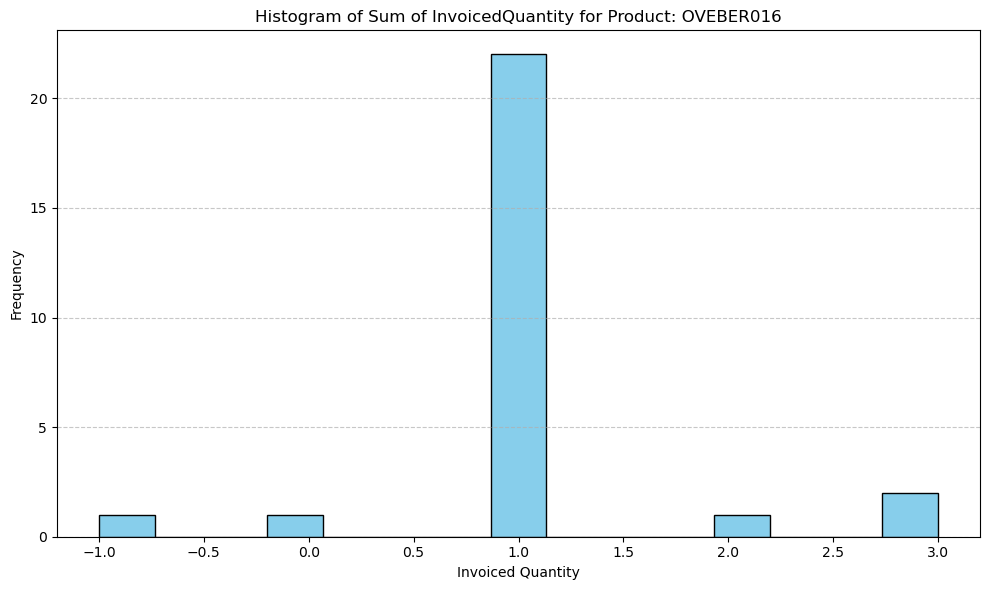

Raw data historical demand for Product: OVEBER017


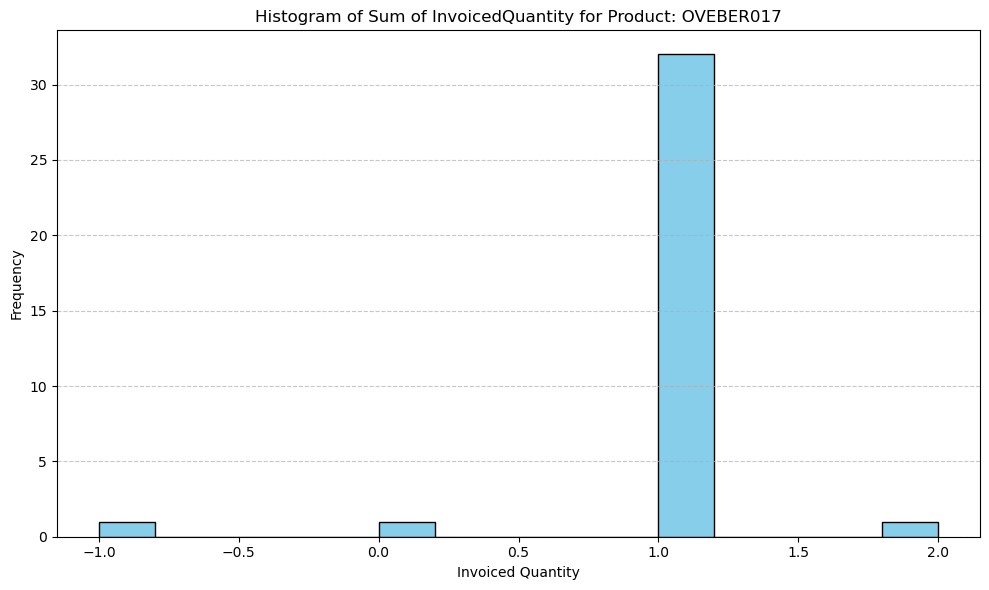

Raw data historical demand for Product: POPBER001


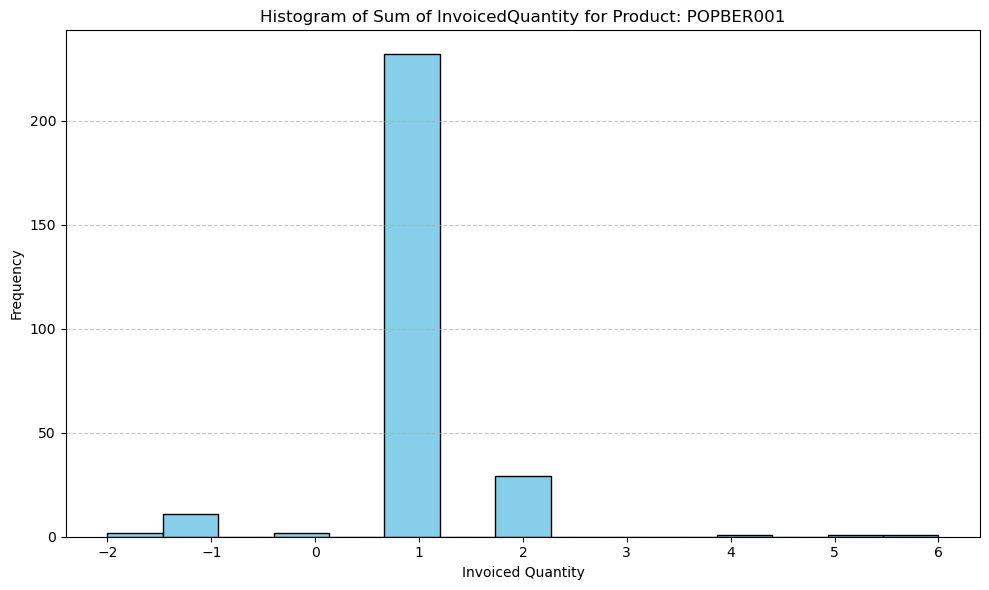

Raw data historical demand for Product: SOPBER001


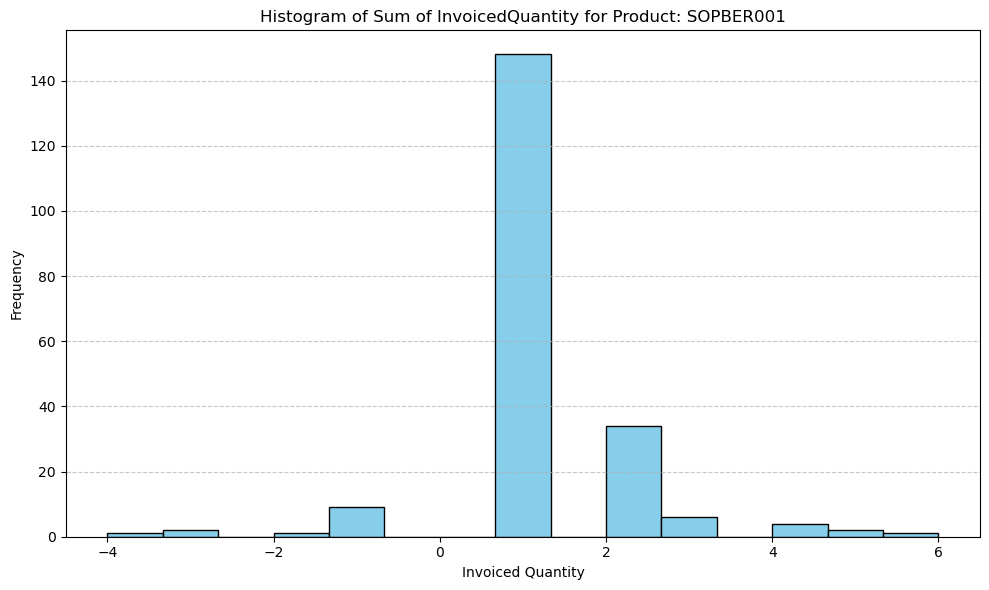

Raw data historical demand for Product: TROBER001


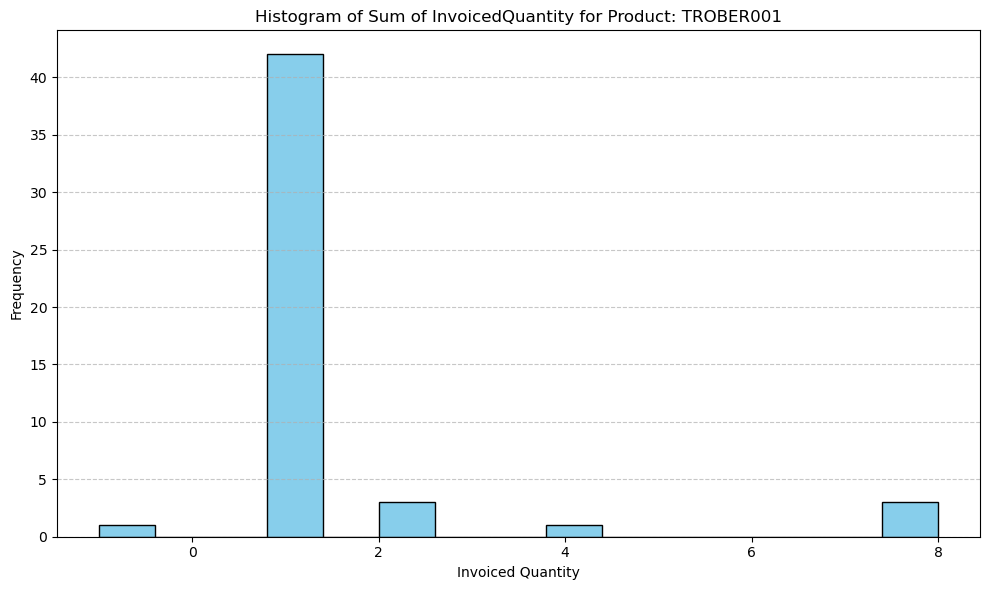

Raw data historical demand for Product: TROBER003


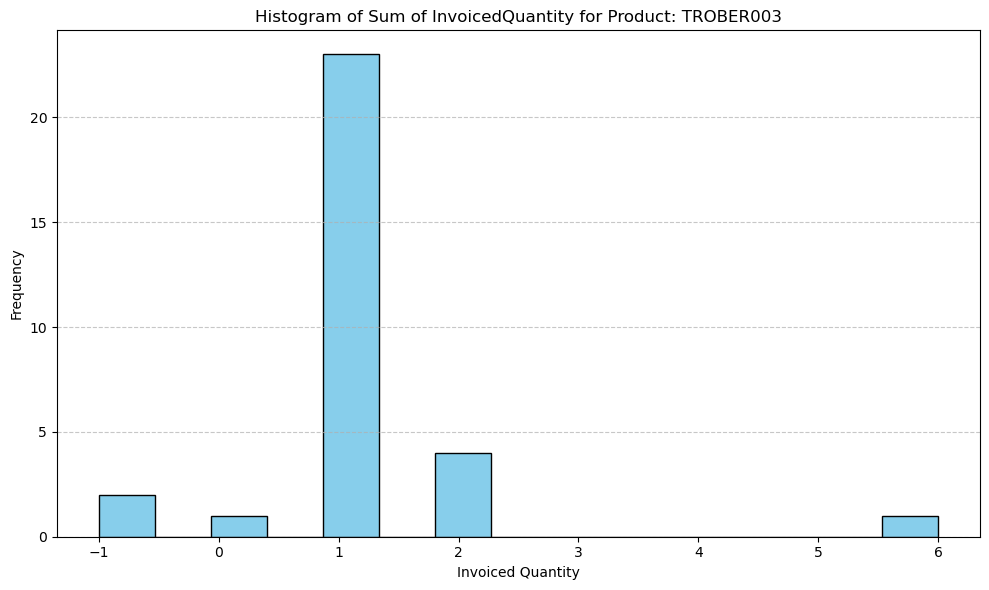

Raw data historical demand for Product: WARBER001


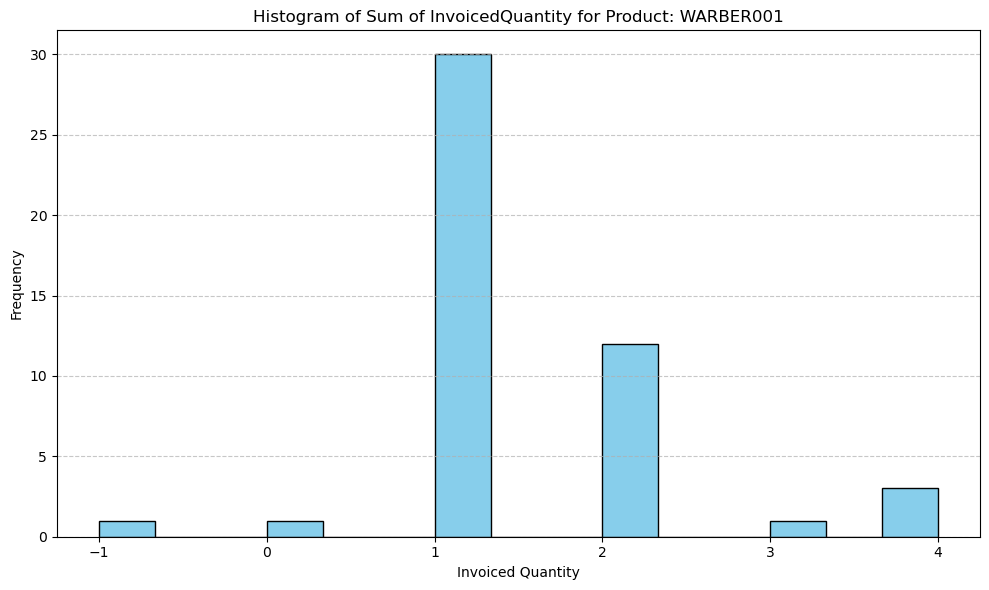

Raw data historical demand for Product: WARBER002


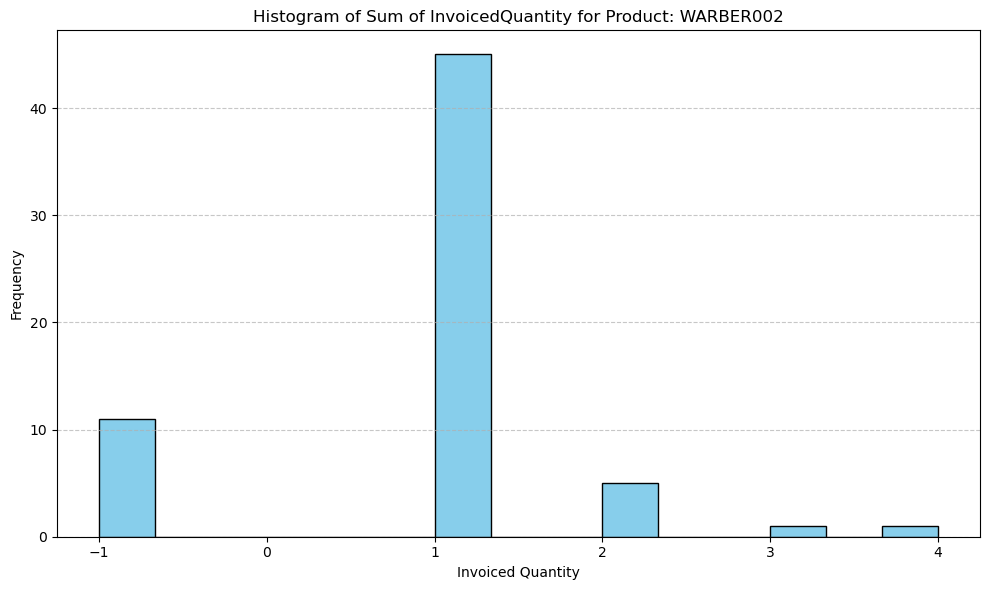

Raw data historical demand for Product: WARBER003


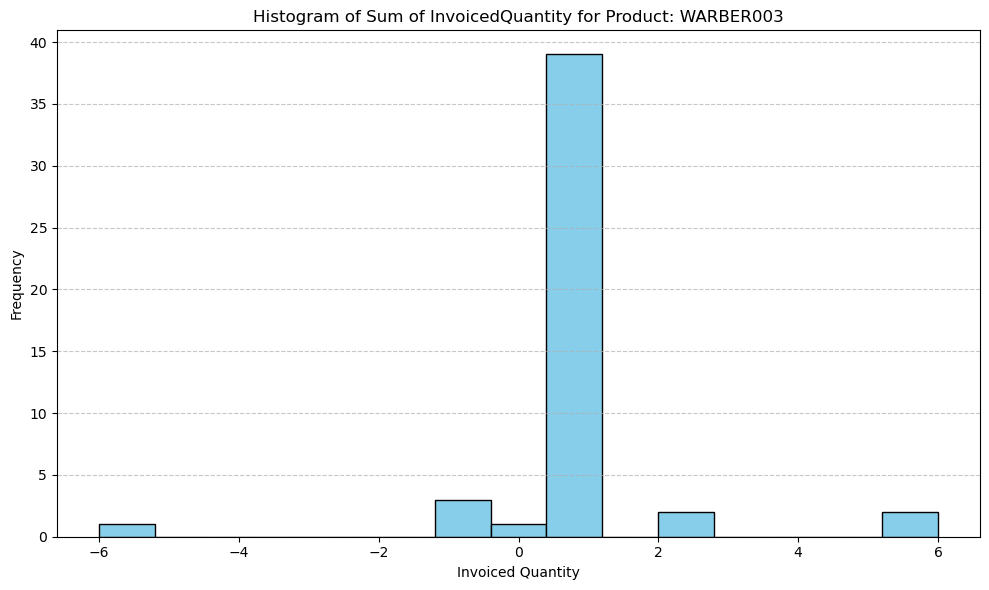

Raw data historical demand for Product: WARBER004


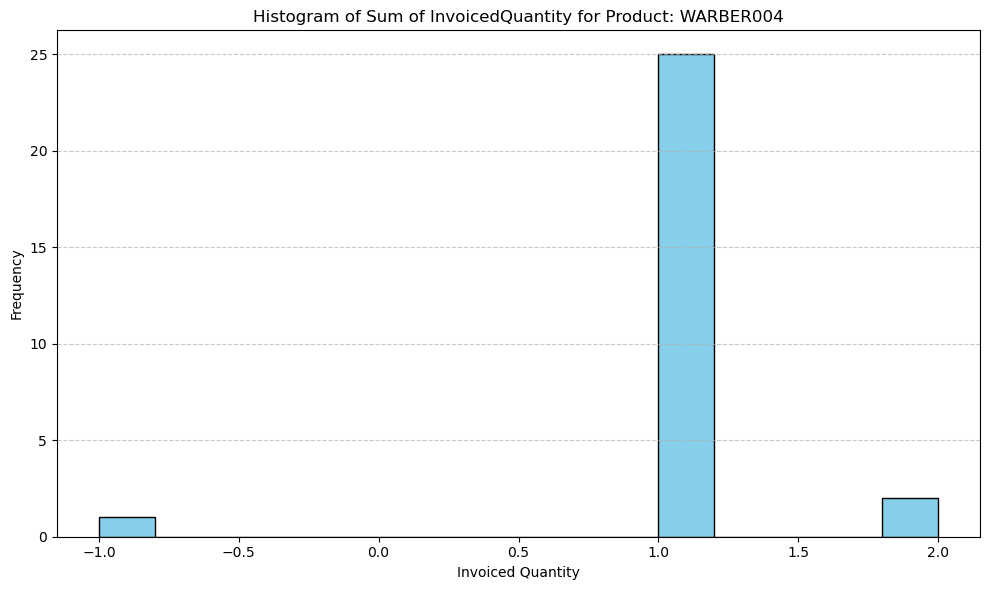

Raw data historical demand for Product: WARBER005


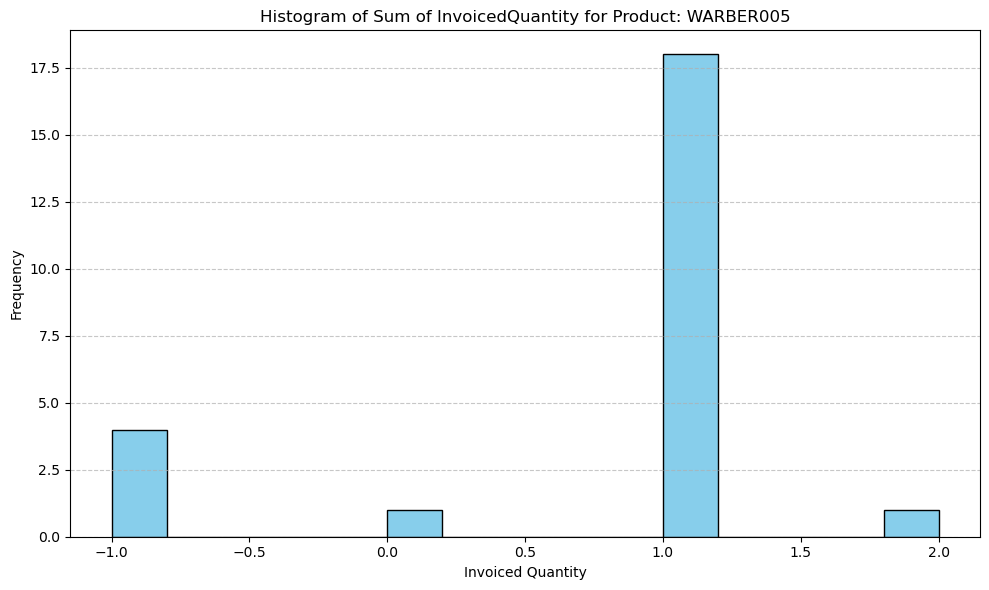

Raw data historical demand for Product: WARBER006


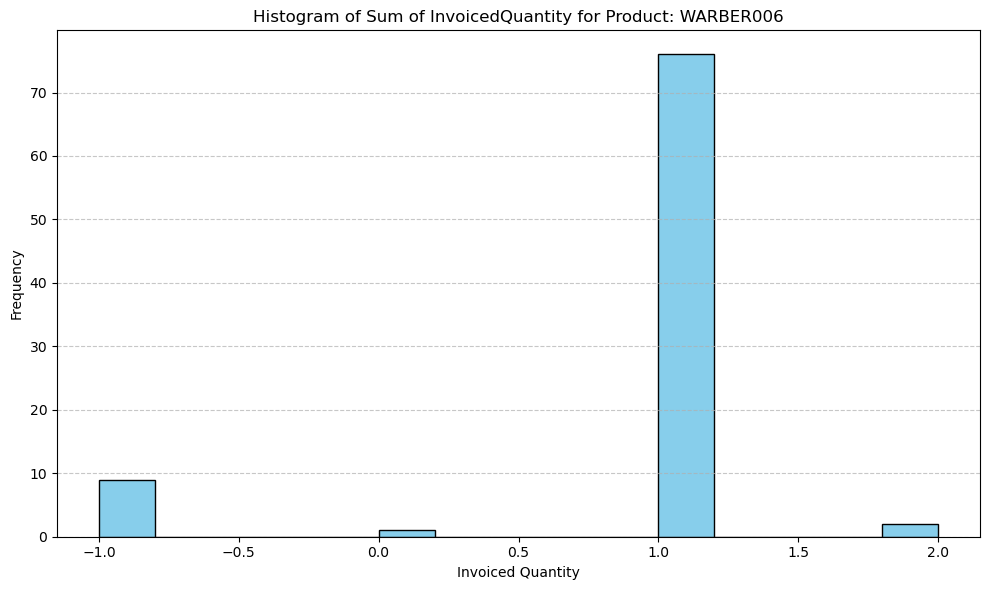

Raw data historical demand for Product: WARBER009


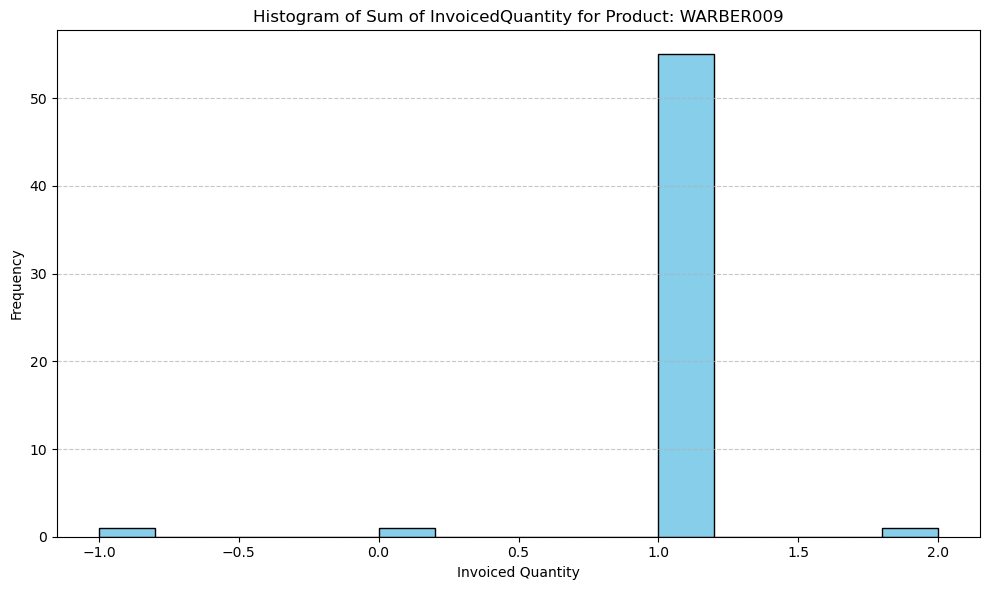

Raw data historical demand for Product: WARBER010


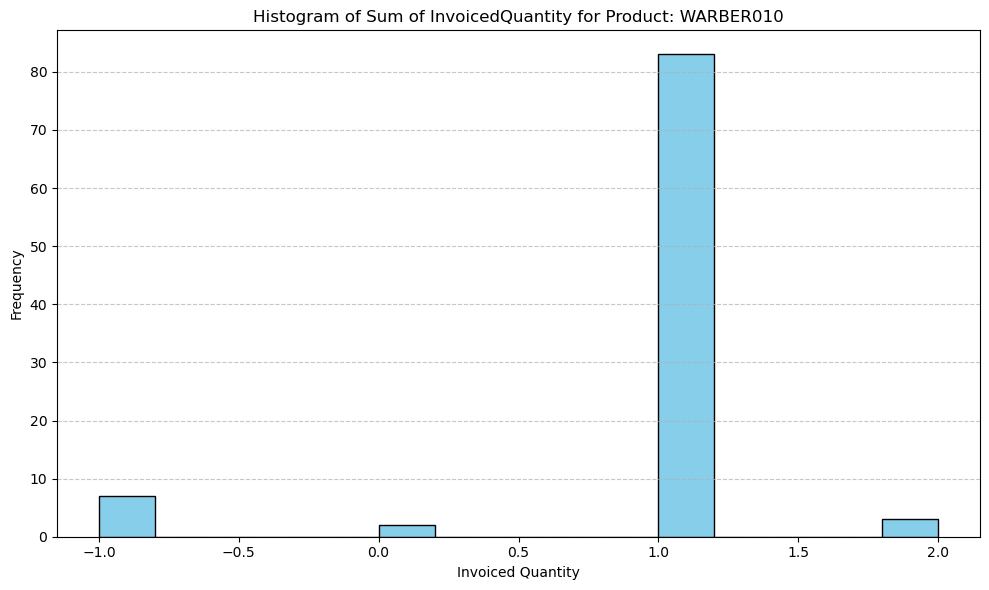

Raw data historical demand for Product: WARBER011


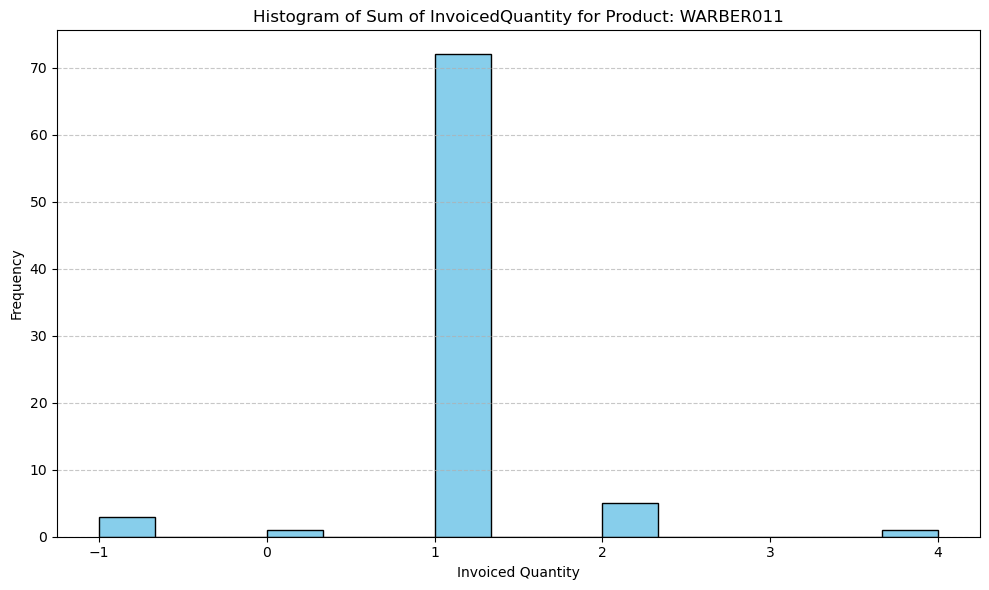

Raw data historical demand for Product: WARBER012


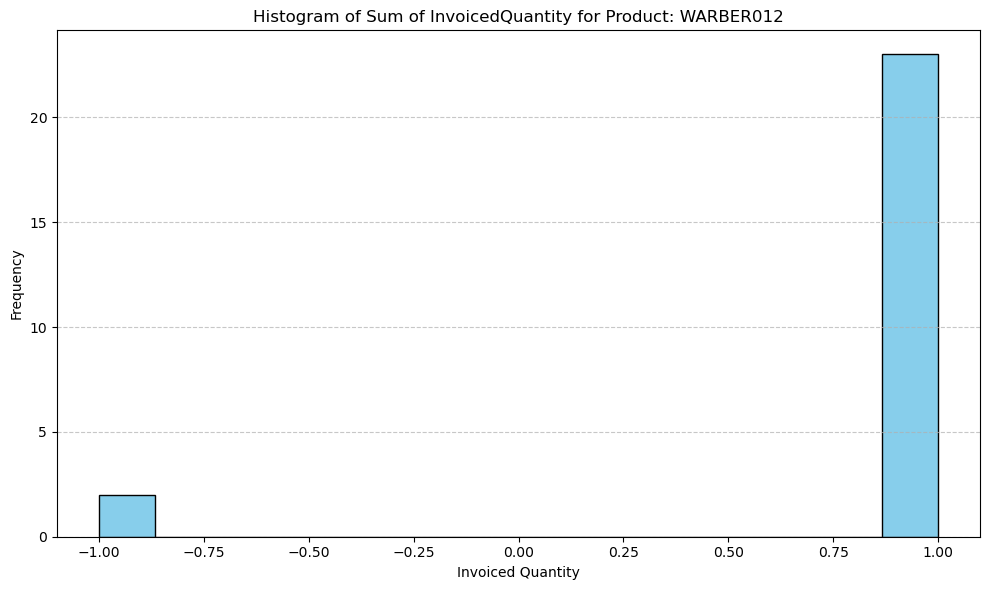

Raw data historical demand for Product: WARBER013


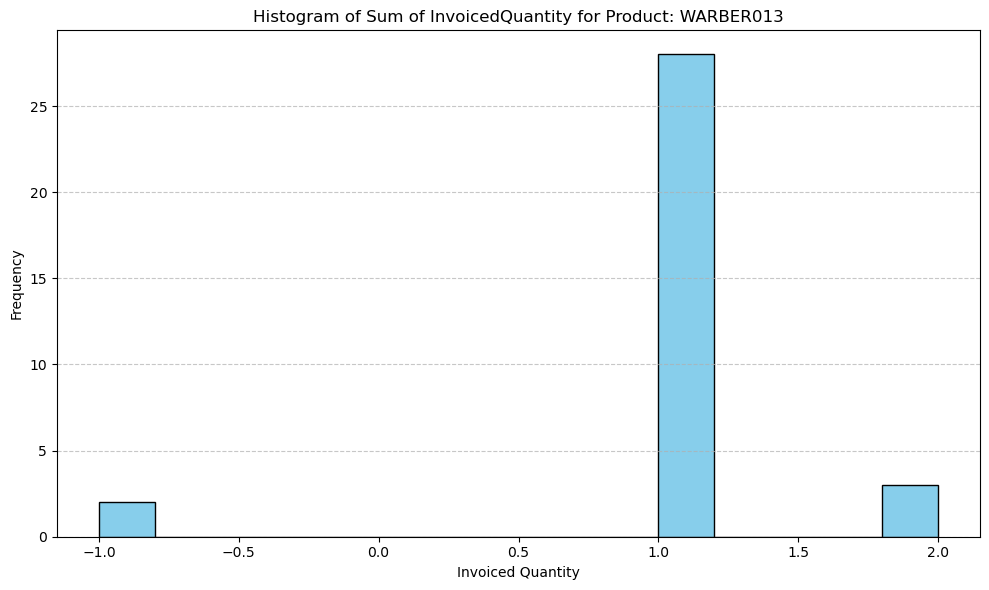

Raw data historical demand for Product: WARBER015


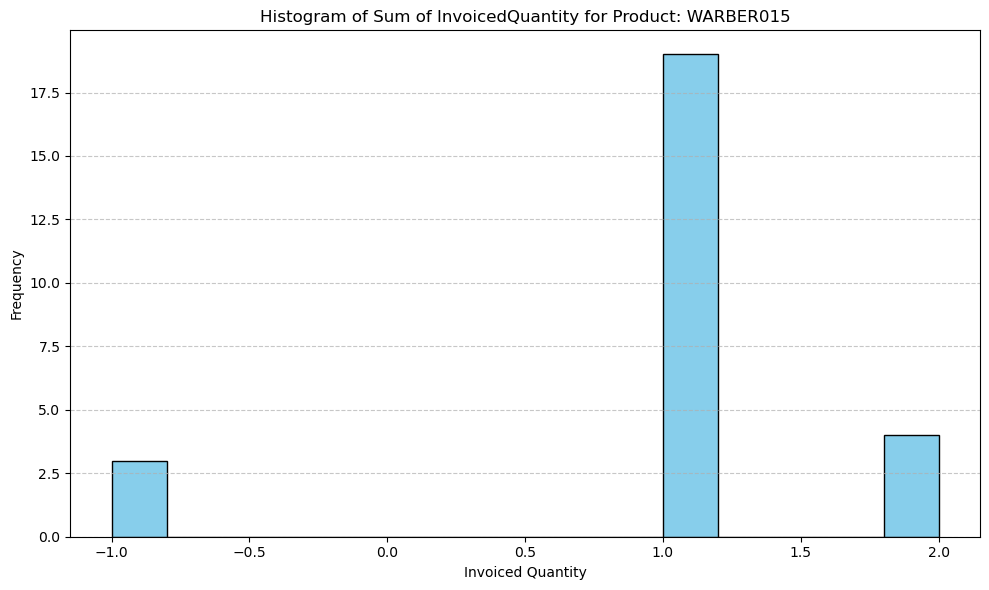

Raw data historical demand for Product: WARBER016


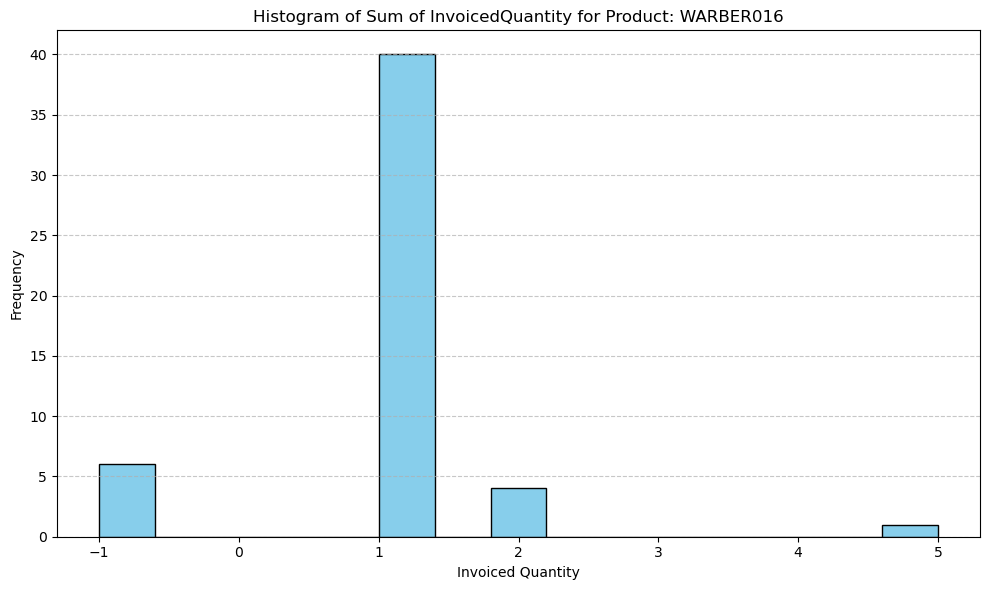

Raw data historical demand for Product: WARBER022


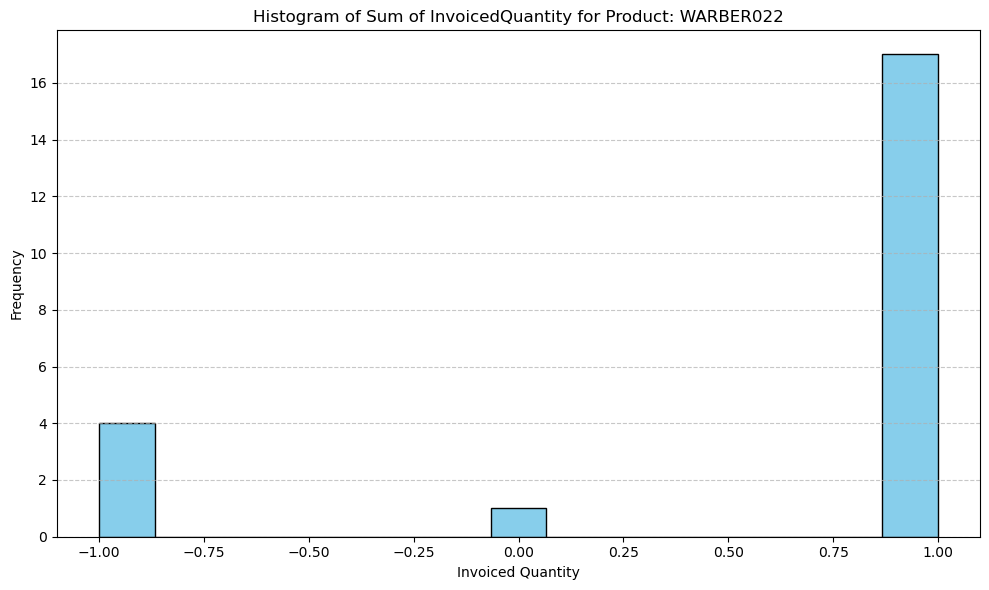

Raw data historical demand for Product: WARBER023


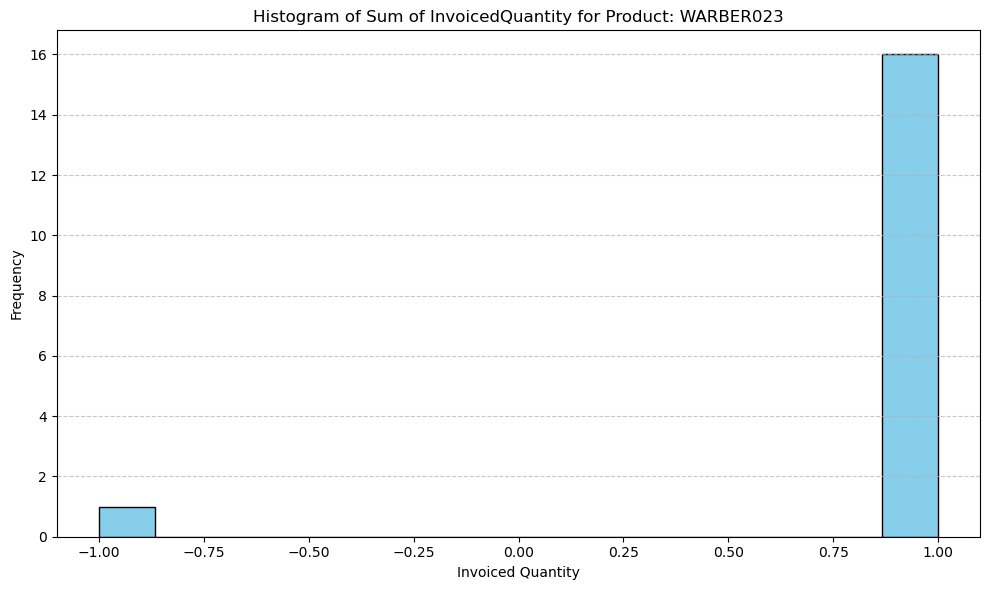

Raw data historical demand for Product: WARBER024


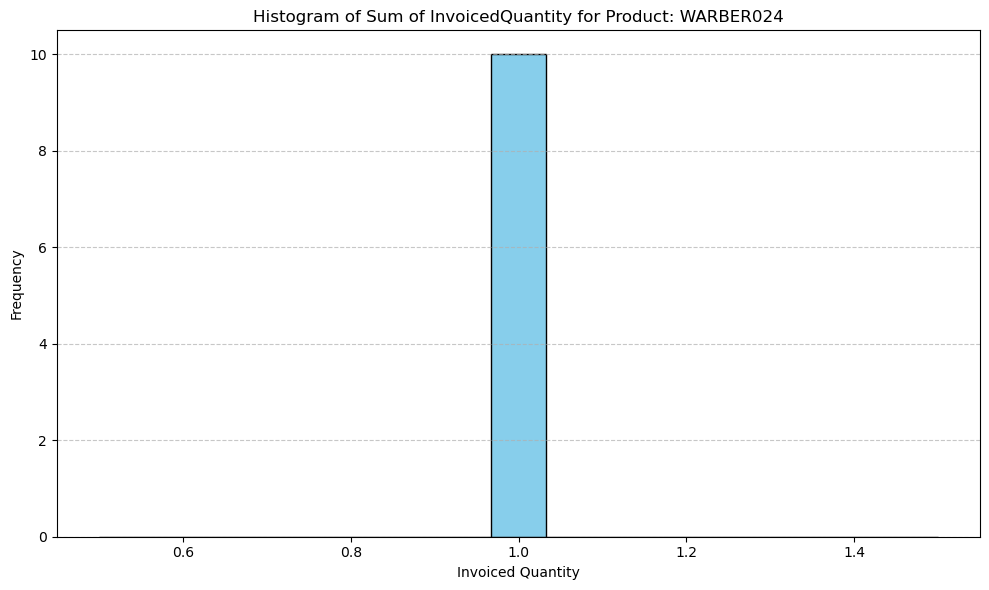

In [14]:
def raw_data_plot(ProductNumber, df):
    # Filter data for the specific product
    product_data = df[df['ProductNumber'] == ProductNumber]
    y = product_data['Sum of InvoicedQuantity']

    # Plot histogram
    plt.figure(figsize=(10, 6))
    plt.hist(y, bins=15, color='skyblue', edgecolor='black')  # Use column 'Sum of InvoicedQuantity'
        
    # Customize plot
    plt.title(f"Histogram of Sum of InvoicedQuantity for Product: {ProductNumber}")
    plt.xlabel("Invoiced Quantity")
    plt.ylabel("Frequency")
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()  # Adjust layout for better visibility

    # Show the plot
    plt.show()
    
    return product_data

# Get unique ProductNumbers
item_comb = raw_data_group[['ProductNumber']].drop_duplicates()

# Plot histogram for each product
for _, row in item_comb.iterrows():
    ProductNumber = row['ProductNumber']
    print(f"Raw data historical demand for Product: {ProductNumber}")
    raw_historical = raw_data_plot(ProductNumber, df)


## Remove Outliers ##

In [15]:
# Function to remove outliers per group (store-item combination)
def remove_outliers_grouped(df, group_cols, value_col):
    def remove_outliers(df_group):
        # Calculate IQR for the group
        Q1 = df_group[value_col].quantile(0.25)
        Q3 = df_group[value_col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
            
        # Filter out rows with higher than IQR outliers
        return df_group[((df_group[value_col] <= upper_bound) & (df_group[value_col] >= lower_bound)) |
            ((df_group[value_col] >= 1) & (df_group[value_col] <= 5)) |
            ((df_group[value_col] >= -5) & (df_group[value_col] <= -1))]
        # Filter out rows with higher than and lower than outliers in addition normal sales values between 1 and 5.

    # Apply outlier removal for each group
    df_cleaned = df.groupby(group_cols, group_keys=False).apply(remove_outliers, include_groups=False)
    return df_cleaned

# Remove outliers on a per-store, per-item basis
data_cleaned = remove_outliers_grouped(df, group_cols=['InventoryWarehouseId_dup', 'ProductNumber_dup'], value_col='Sum of InvoicedQuantity').reset_index()
data_cleaned

,index,InvoiceDate,InventoryWarehouseId,ProductNumber,Sum of InvoicedQuantity
0,200,2020-01-30,DMSQR,BOLBER001,1
1,201,2020-01-30,DMSQR,BOLBER001,2
2,454,2020-03-08,DMSQR,BOLBER001,1
3,704,2020-06-21,DMSQR,BOLBER001,1
4,1158,2020-09-26,DMSQR,BOLBER001,1
...,...,...,...,...,...
7451,4342,2022-08-11,TKSQR,WARBER023,1
7452,4659,2022-10-06,TKSQR,WARBER023,1
7453,5922,2023-07-08,TKSQR,WARBER023,1
7454,6737,2024-02-07,TKSQR,WARBER024,1


In [16]:
data_cleaned.to_csv('data_cleaned.csv', index=False)

In [17]:
# Aggregate daily sales into monthly buckets
data_cleaned['month'] = data_cleaned['InvoiceDate'].dt.to_period('M').dt.to_timestamp() + pd.offsets.MonthEnd(0) 
monthly_data = data_cleaned.groupby(['ProductNumber', 'month'], as_index=False)['Sum of InvoicedQuantity'].sum()
monthly_data

,ProductNumber,month,Sum of InvoicedQuantity
0,BOLBER001,2020-01-31,5
1,BOLBER001,2020-02-29,0
2,BOLBER001,2020-03-31,4
3,BOLBER001,2020-06-30,10
4,BOLBER001,2020-07-31,2
...,...,...,...
1959,WARBER024,2023-01-31,1
1960,WARBER024,2023-02-28,2
1961,WARBER024,2023-03-31,1
1962,WARBER024,2024-02-29,1


In [18]:
monthly_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1964 entries, 0 to 1963
Data columns (total 3 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   ProductNumber            1964 non-null   object        
 1   month                    1964 non-null   datetime64[ns]
 2   Sum of InvoicedQuantity  1964 non-null   int64         
dtypes: datetime64[ns](1), int64(1), object(1)
memory usage: 46.2+ KB


In [19]:
monthly_data.to_csv('monthly_data.csv', index=False)

## Generate a complete date range for time series analysis

In [22]:
# Fill missing months in historical demand data up to a specified end date with 0 sales.
def fill_missing_months(data):

    # Ensure 'month' is in datetime format
    data['month'] = pd.to_datetime(data['month'])
    
    # Find the start date (earliest month in the data)
    start_date = data['month'].min()
    end_date = data['month'].max()
    
    # Generate a complete range of months
    all_months = pd.date_range(start=start_date, end=end_date, freq='ME')
    
    # Get all unique store-item combinations
    Unique_item = data[['ProductNumber']].drop_duplicates()
    
    # Create a cartesian product of all store-item combinations with the complete month range
    full_index = pd.MultiIndex.from_product(
        [Unique_item['ProductNumber'], 
         all_months],
        names=['ProductNumber', 'month']
    )
    
    # Create a full DataFrame from the cartesian product
    full_data = pd.DataFrame(index=full_index).reset_index()
    
    # Merge the original data with the full DataFrame
    data_filled = pd.merge(full_data, data, on=['ProductNumber', 'month'], how='left')
    
    # Fill missing sales with 0
    data_filled['Sum of InvoicedQuantity'] = data_filled['Sum of InvoicedQuantity'].fillna(0)
    
    return data_filled

# Fill missing months from the minimum date up to maximum date
data_filled = fill_missing_months(monthly_data)

# Remove any potential duplicates introduced during merging
data_filled = data_filled.drop_duplicates(subset=['ProductNumber', 'month'])
data_filled

,ProductNumber,month,Sum of InvoicedQuantity
0,BOLBER001,2020-01-31,5.0
1,BOLBER001,2020-02-29,0.0
2,BOLBER001,2020-03-31,4.0
3,BOLBER001,2020-04-30,0.0
4,BOLBER001,2020-05-31,0.0
...,...,...,...
3655,WARBER024,2024-08-31,0.0
3656,WARBER024,2024-09-30,0.0
3657,WARBER024,2024-10-31,1.0
3658,WARBER024,2024-11-30,0.0


In [23]:
data_filled.to_csv('data_filled.csv', index=False)

## Explore the monthly sales historical data as pivot table

In [24]:
Pivot_table = pd.pivot_table(monthly_data, values='Sum of InvoicedQuantity', index='ProductNumber',
                       columns=['month'], aggfunc="sum", fill_value=0)
Pivot_table

month,2020-01-31,2020-02-29,2020-03-31,2020-04-30,2020-05-31,2020-06-30,2020-07-31,2020-08-31,2020-09-30,2020-10-31,...,2024-03-31,2024-04-30,2024-05-31,2024-06-30,2024-07-31,2024-08-31,2024-09-30,2024-10-31,2024-11-30,2024-12-31
ProductNumber,,,,,,,,,,,,,,,,,,,,,
BOLBER001,5,0,4,0,0,10,2,2,6,4,...,0,0,0,0,0,0,0,0,0,0
BOLBER002,5,11,7,2,5,10,2,3,3,0,...,1,0,0,0,0,0,0,0,0,0
BOLBER003,1,0,4,-1,1,2,0,6,1,2,...,0,4,0,0,0,1,1,1,0,0
BOLBER005,0,2,1,0,0,1,0,2,0,0,...,0,0,0,0,0,0,0,1,1,0
BURBER001,0,0,2,0,1,4,0,2,0,1,...,1,0,0,0,0,1,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WARBER015,2,0,2,0,0,0,0,0,0,0,...,1,0,0,0,0,1,2,0,0,0
WARBER016,2,2,0,0,0,0,1,0,0,2,...,0,1,0,0,0,0,0,0,0,0
WARBER022,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [25]:
Pivot_table.to_csv('Pivot_table-monthly_data.csv', index=True) 

Historical demand for Item: BOLBER001


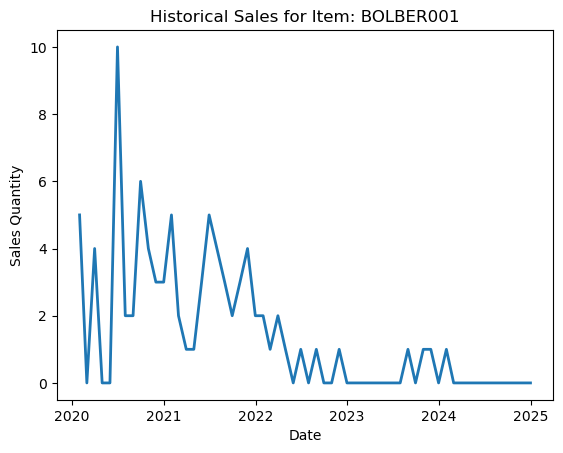

Historical demand for Item: BOLBER002


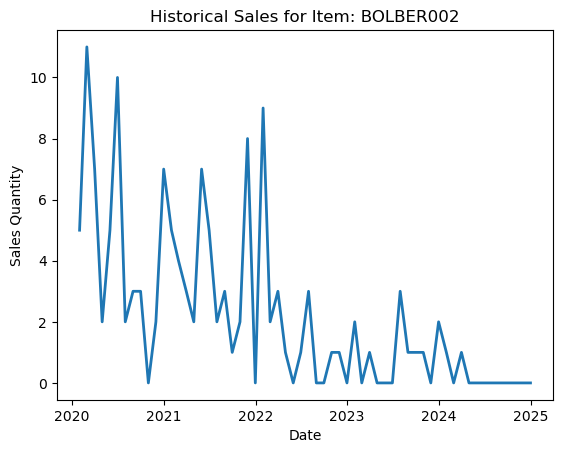

Historical demand for Item: BOLBER003


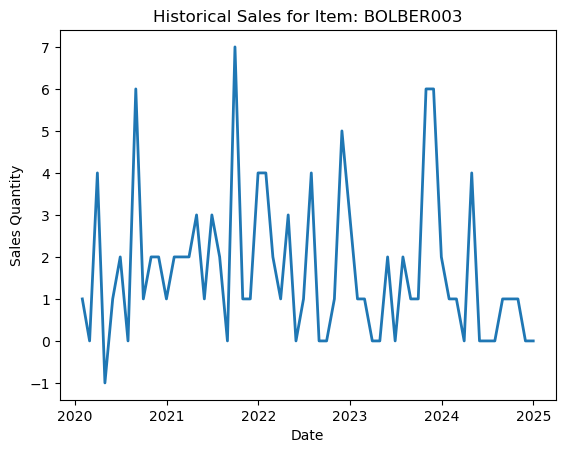

Historical demand for Item: BOLBER005


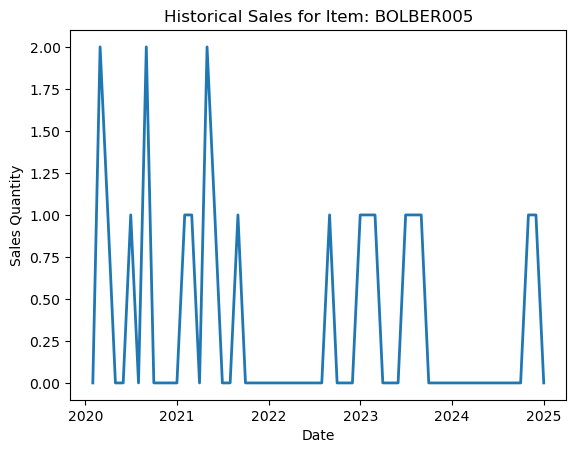

Historical demand for Item: BURBER001


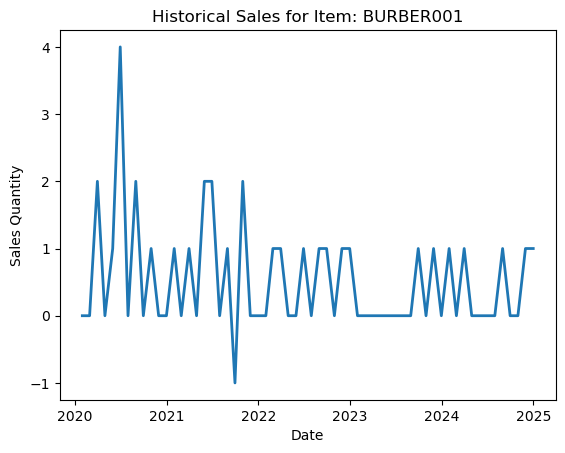

Historical demand for Item: BURBER002


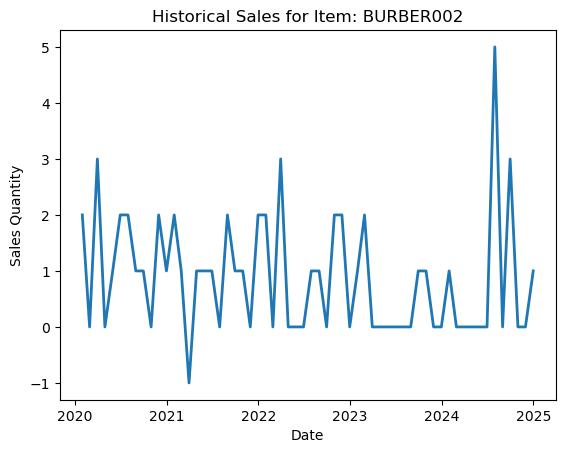

Historical demand for Item: BURBER003


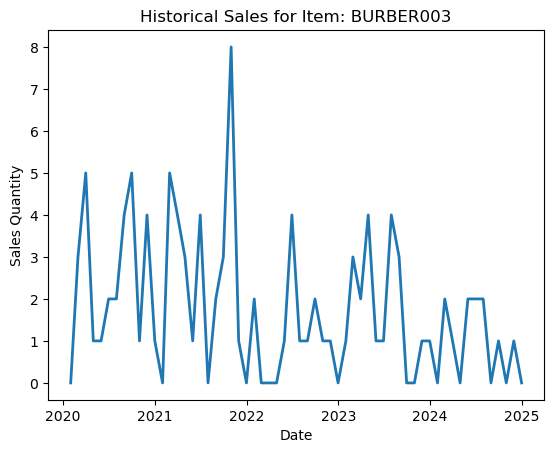

Historical demand for Item: BURBER004


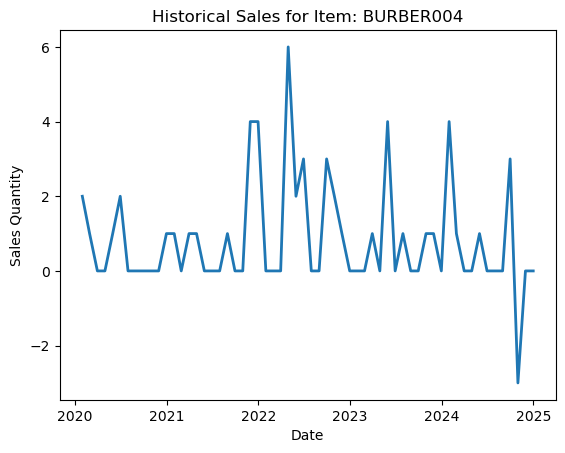

Historical demand for Item: BURBER007


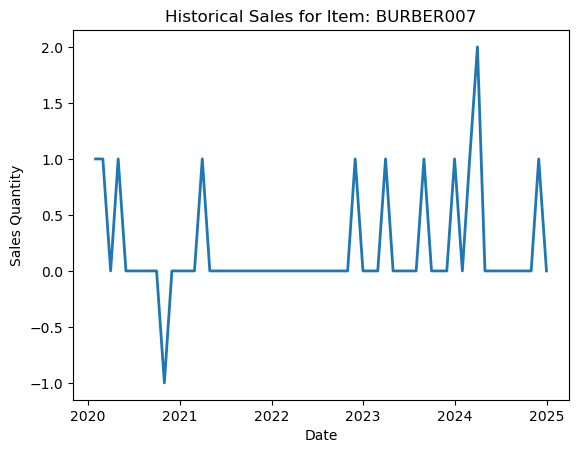

Historical demand for Item: COFBER001


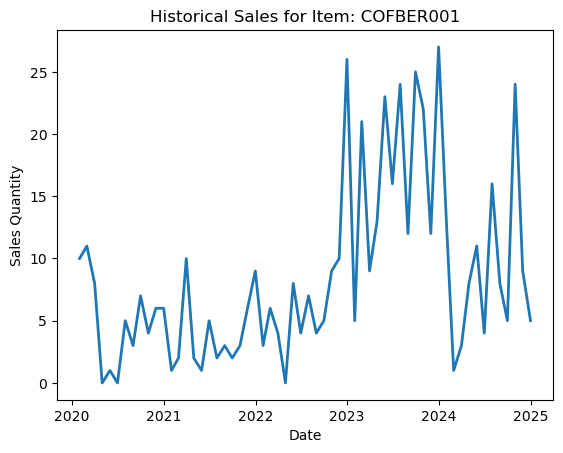

Historical demand for Item: COKBER001


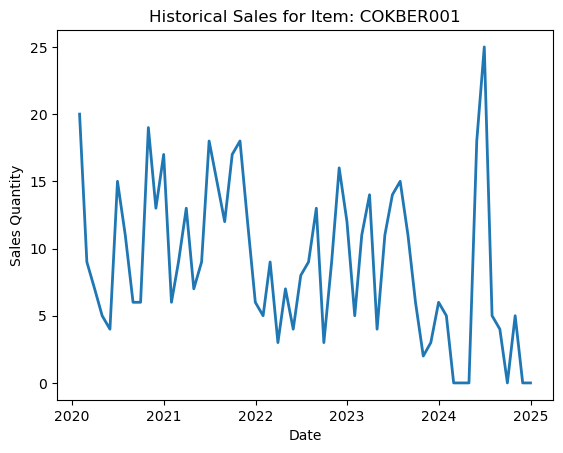

Historical demand for Item: FRYBER002


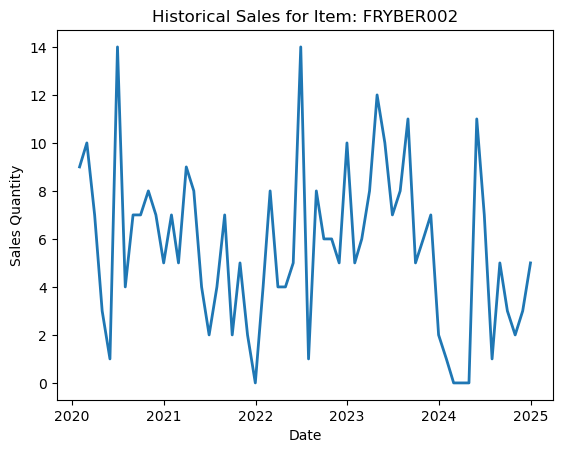

Historical demand for Item: FRYBER003


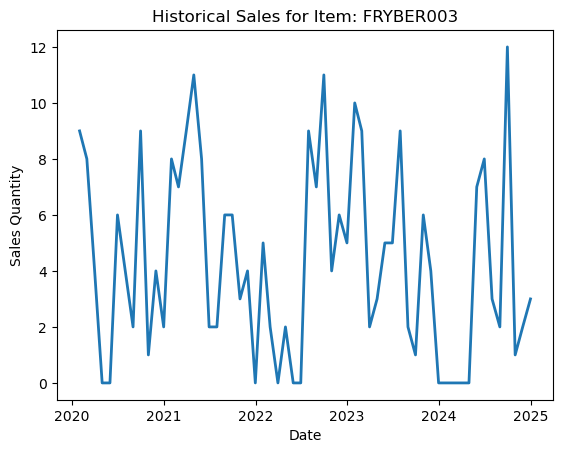

Historical demand for Item: FRYBER005


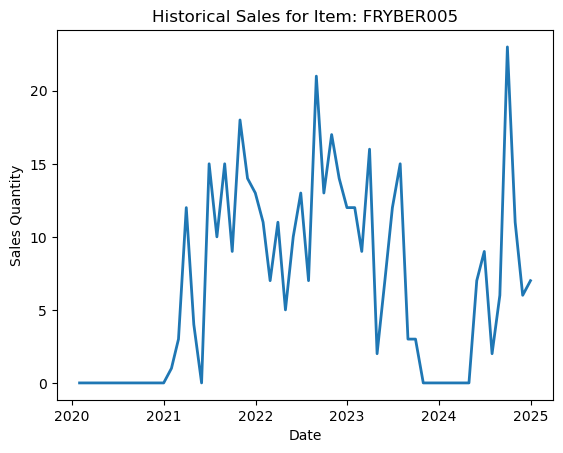

Historical demand for Item: GRLBER003


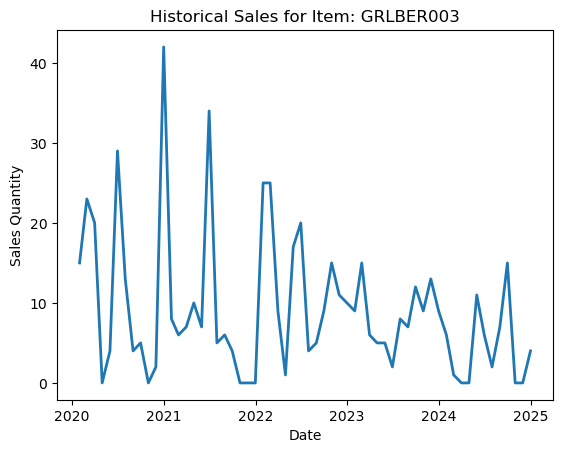

Historical demand for Item: GRLBER004


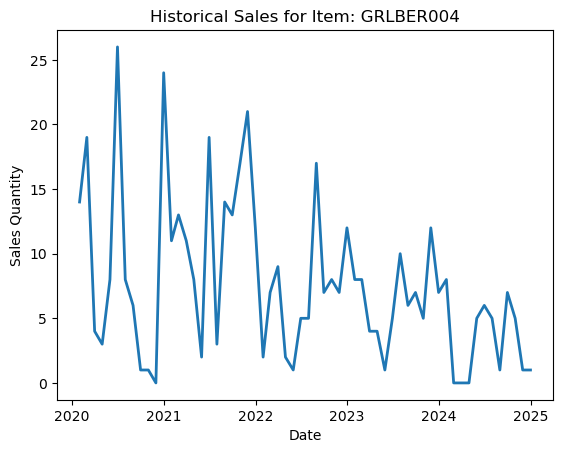

Historical demand for Item: GRLBER009


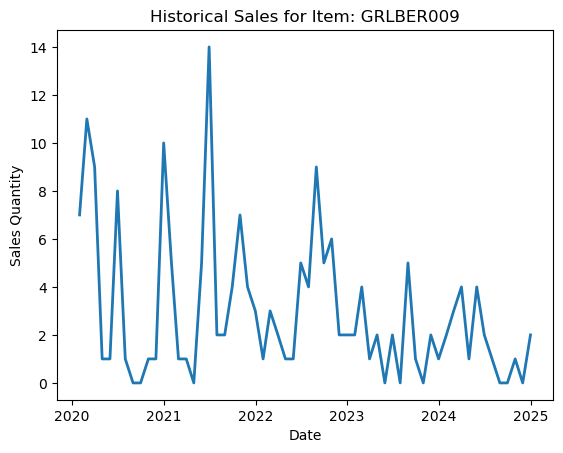

Historical demand for Item: GRLBER010


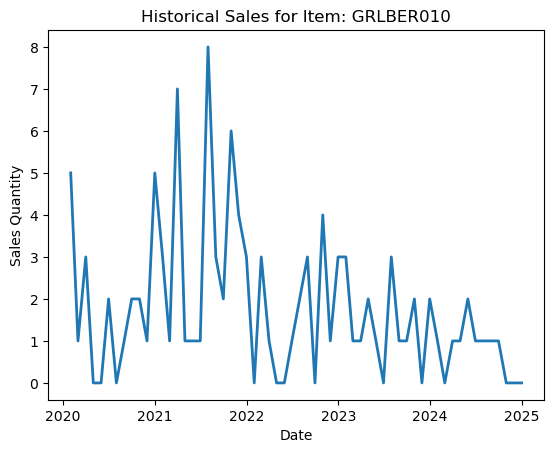

Historical demand for Item: GRLBER011


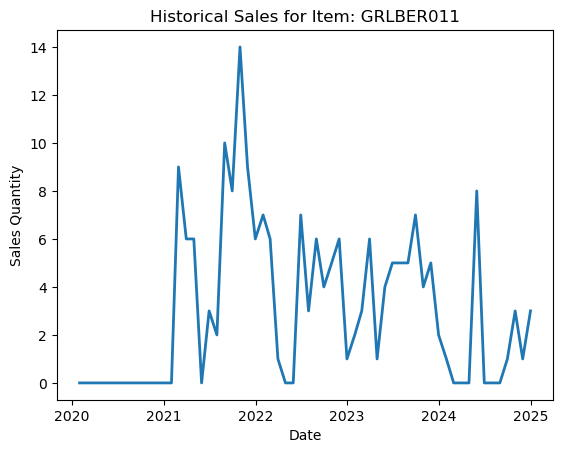

Historical demand for Item: GRLBER012


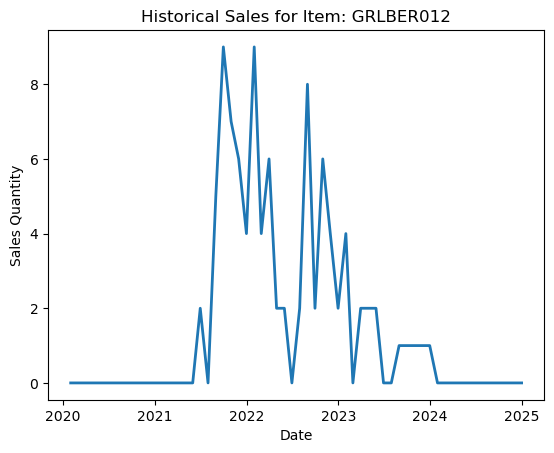

Historical demand for Item: GRLBER015


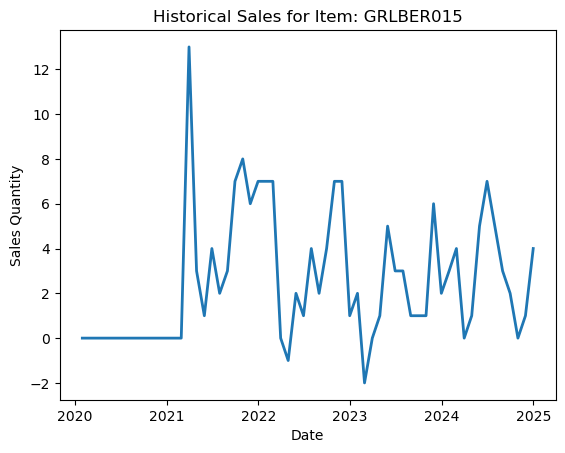

Historical demand for Item: GRLBER019


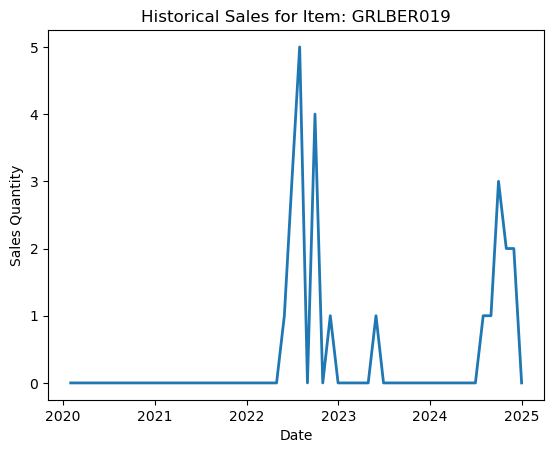

Historical demand for Item: GRLBER020


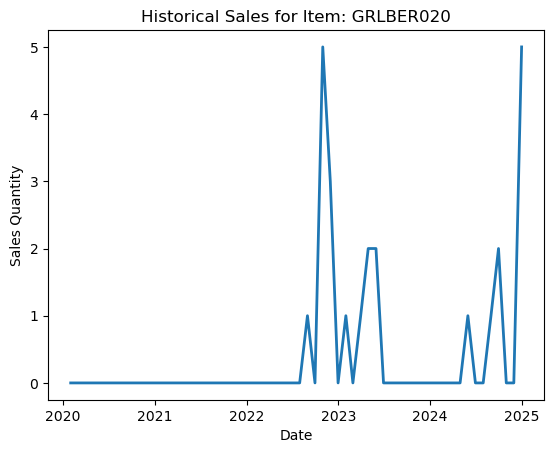

Historical demand for Item: HEABER001


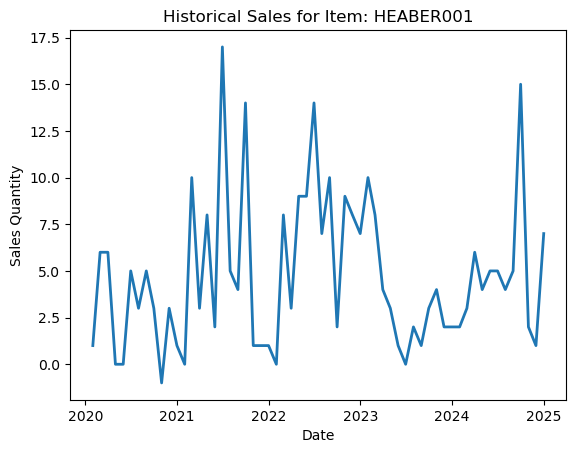

Historical demand for Item: HOTBER001


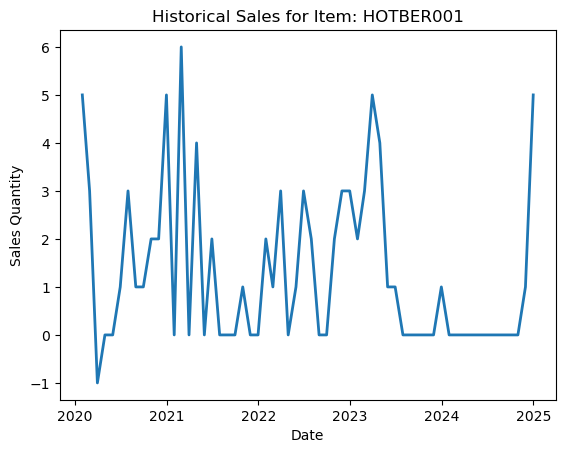

Historical demand for Item: HOTBER002


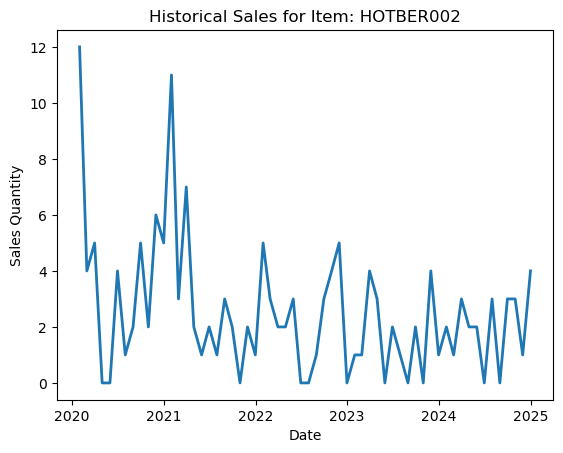

Historical demand for Item: HOTBER003


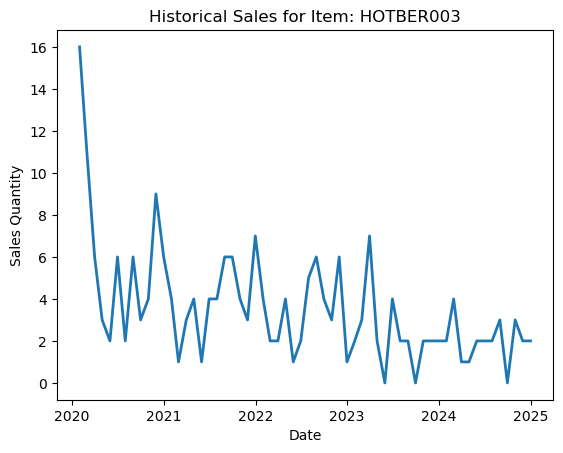

Historical demand for Item: ICMBER002


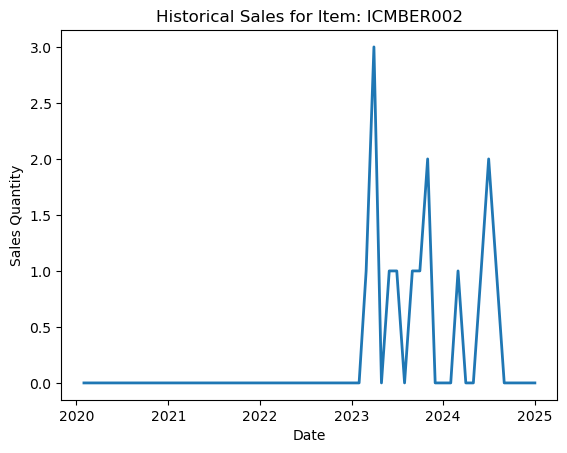

Historical demand for Item: ICMBER003


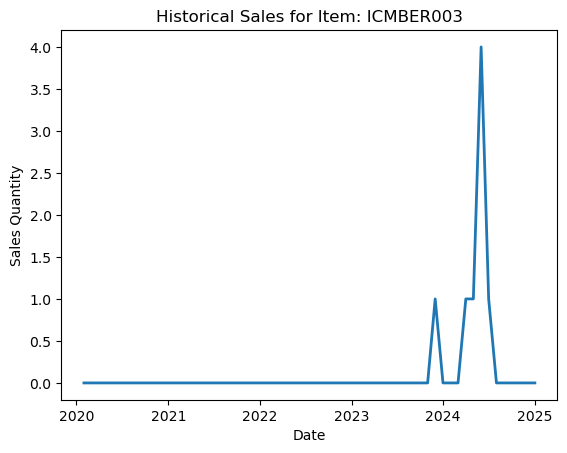

Historical demand for Item: MIXBER001


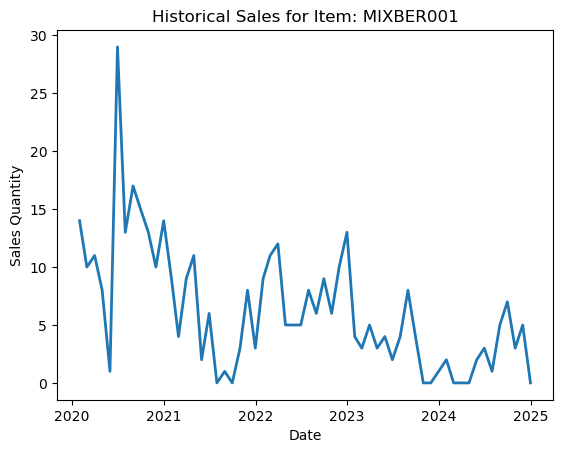

Historical demand for Item: MIXBER003


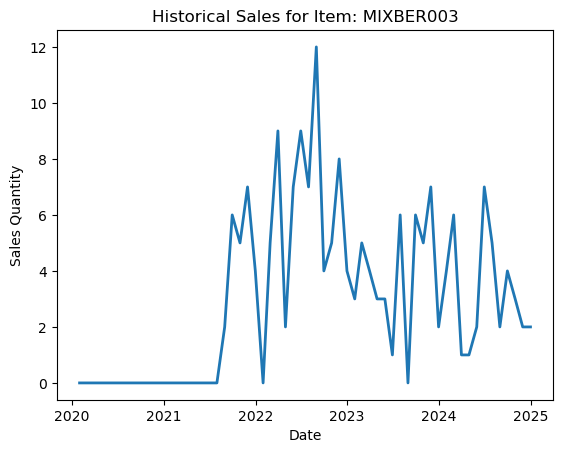

Historical demand for Item: OVEBER002


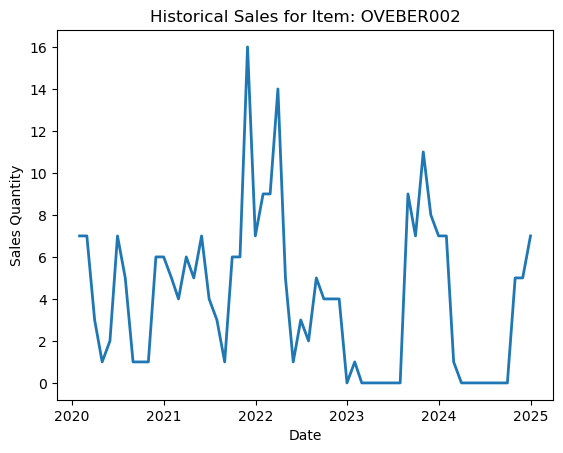

Historical demand for Item: OVEBER005


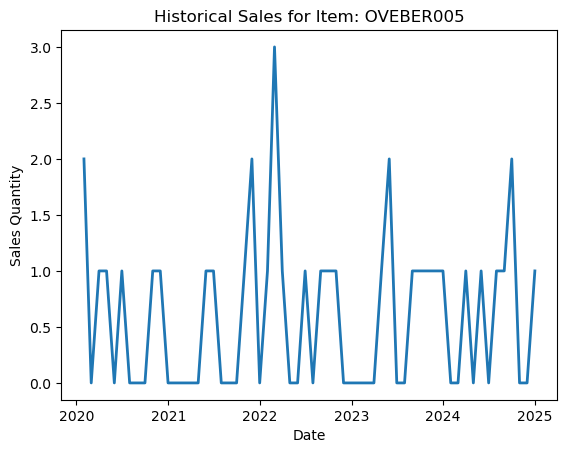

Historical demand for Item: OVEBER006


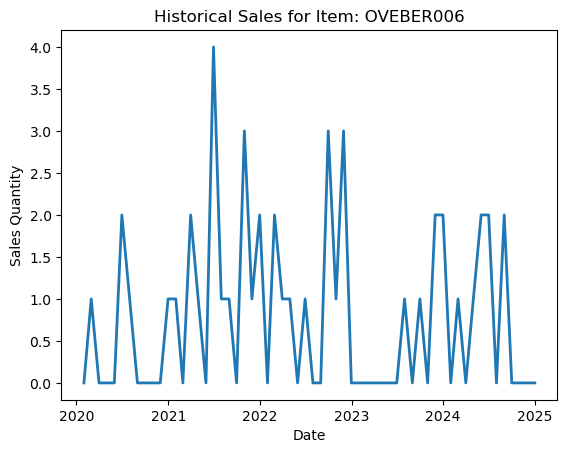

Historical demand for Item: OVEBER011


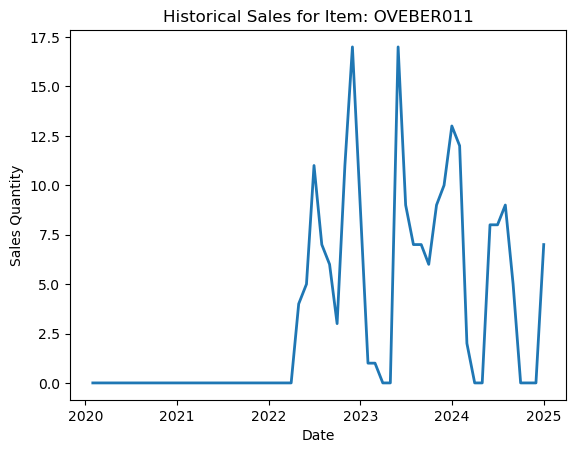

Historical demand for Item: OVEBER012


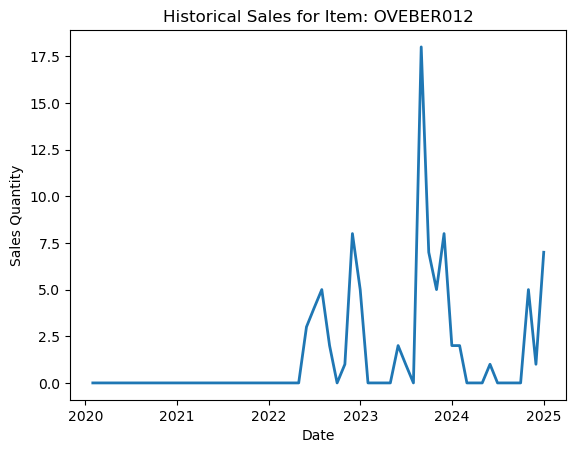

Historical demand for Item: OVEBER013


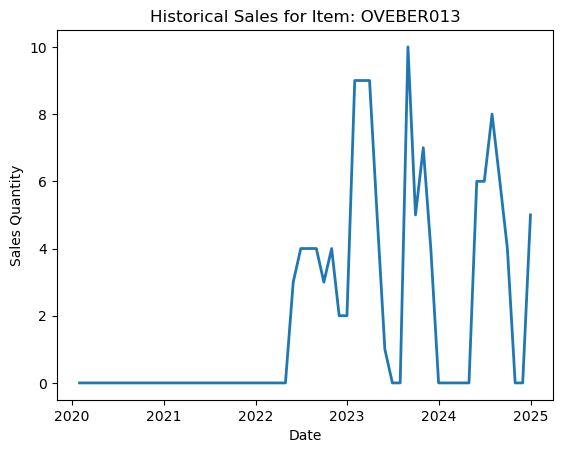

Historical demand for Item: OVEBER014


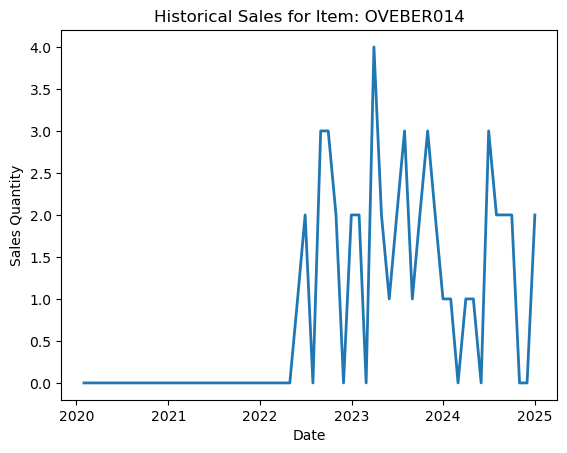

Historical demand for Item: OVEBER015


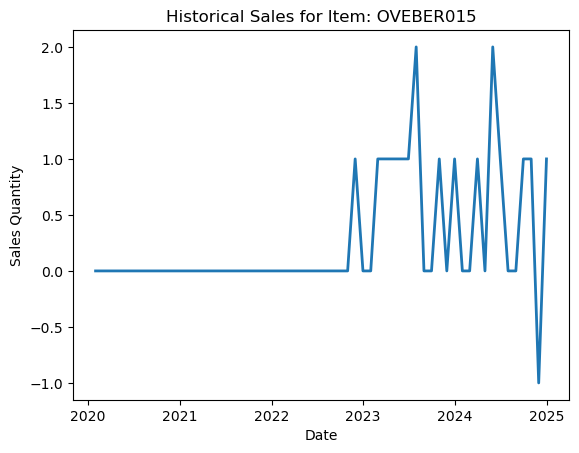

Historical demand for Item: OVEBER016


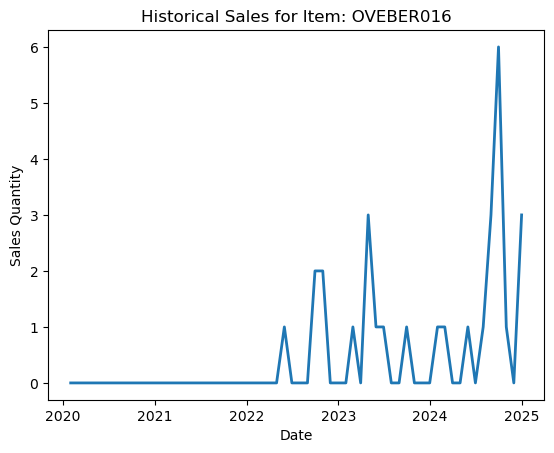

Historical demand for Item: OVEBER017


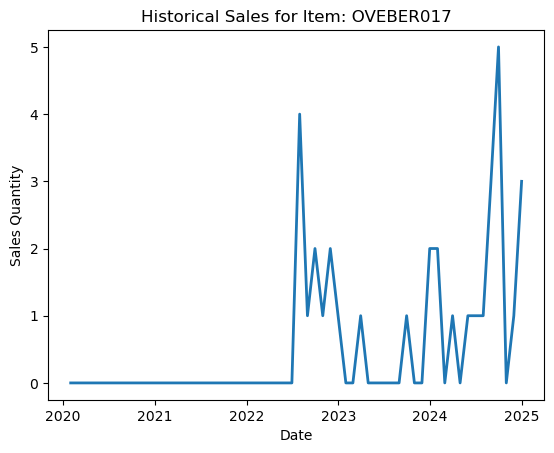

Historical demand for Item: POPBER001


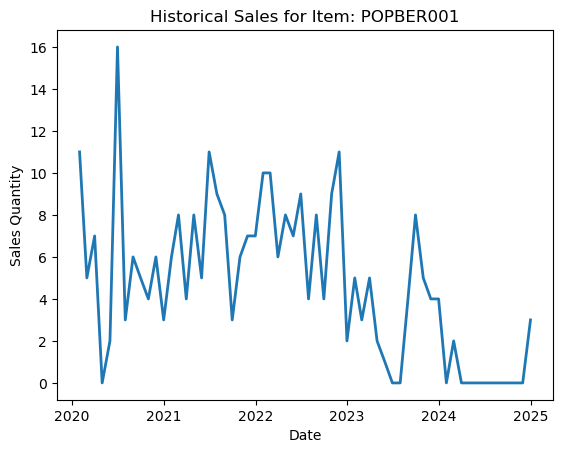

Historical demand for Item: SOPBER001


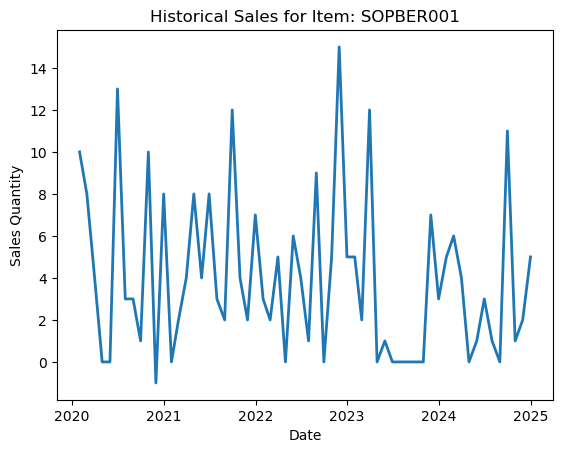

Historical demand for Item: TROBER001


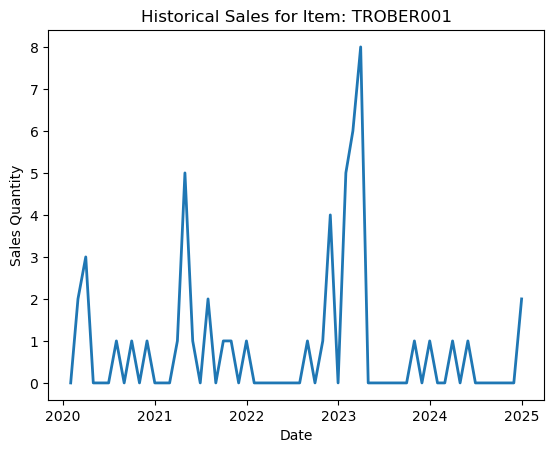

Historical demand for Item: TROBER003


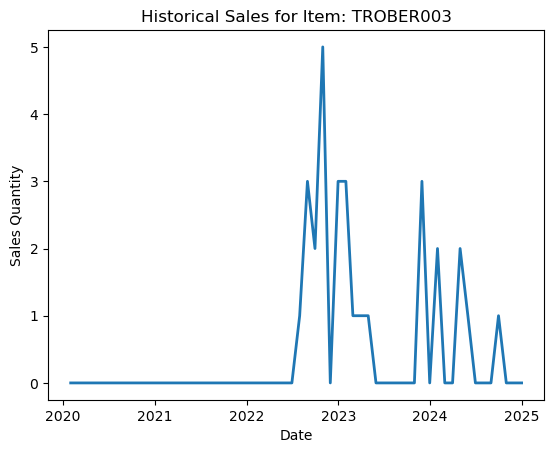

Historical demand for Item: WARBER001


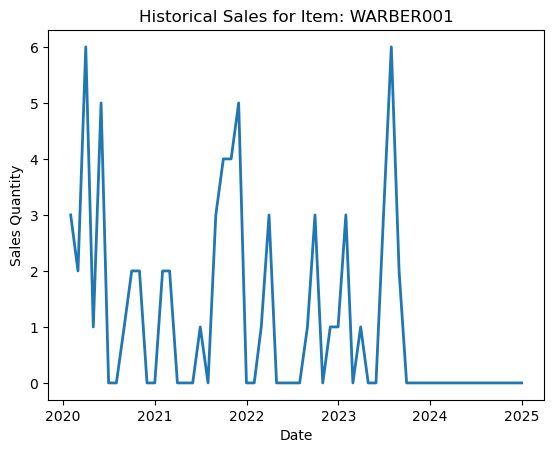

Historical demand for Item: WARBER002


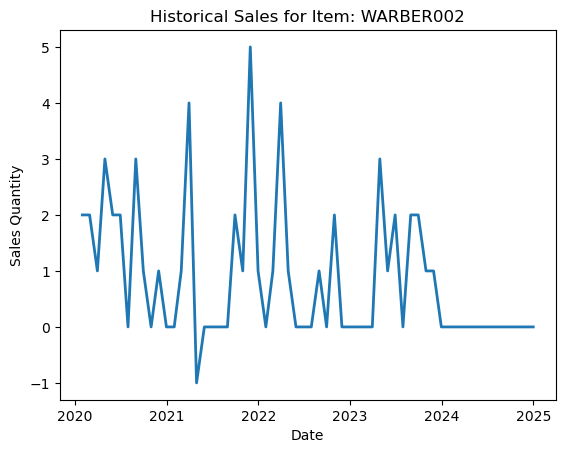

Historical demand for Item: WARBER003


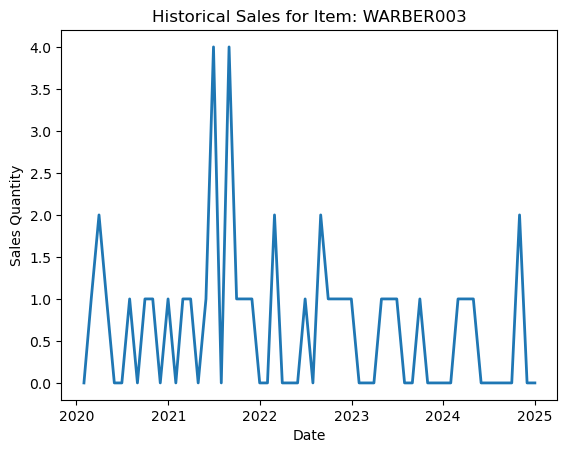

Historical demand for Item: WARBER004


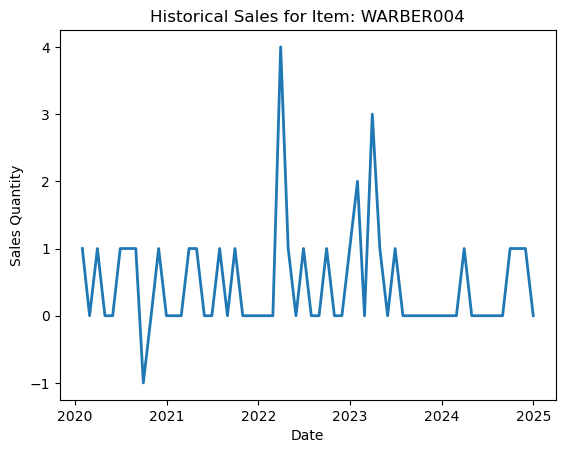

Historical demand for Item: WARBER005


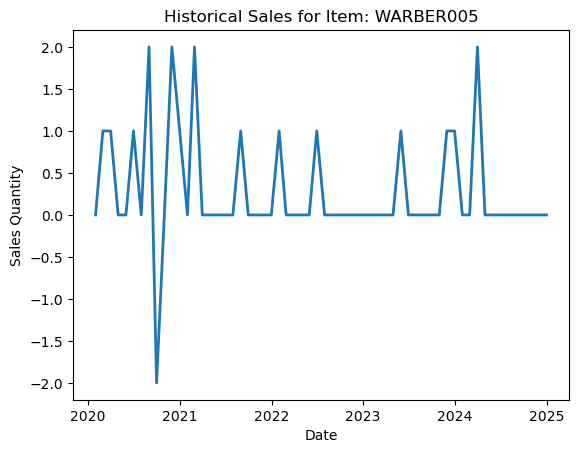

Historical demand for Item: WARBER006


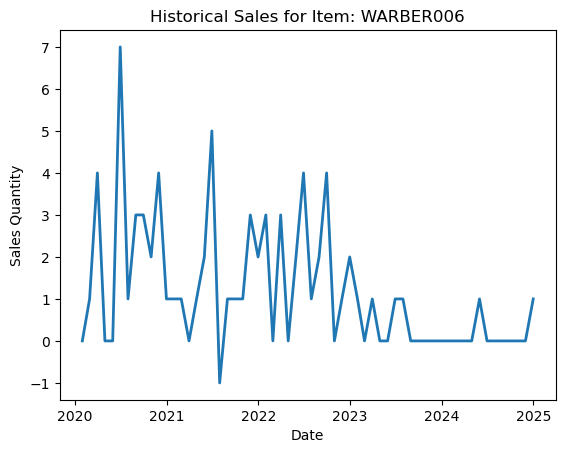

Historical demand for Item: WARBER009


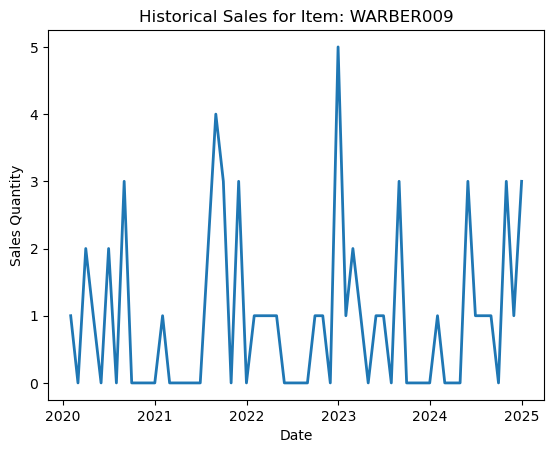

Historical demand for Item: WARBER010


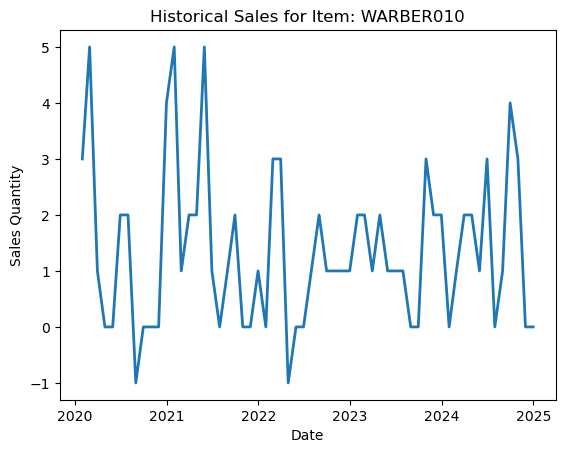

Historical demand for Item: WARBER011


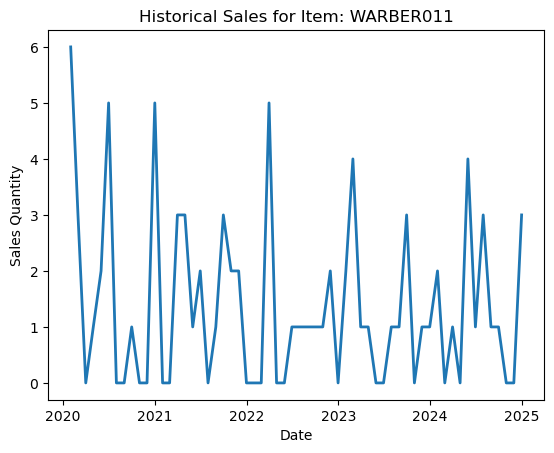

Historical demand for Item: WARBER012


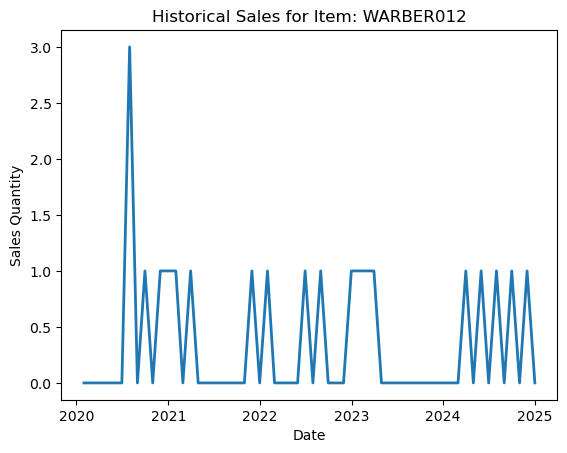

Historical demand for Item: WARBER013


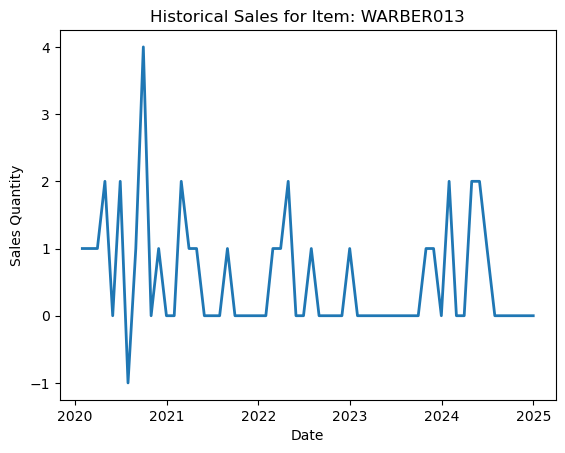

Historical demand for Item: WARBER015


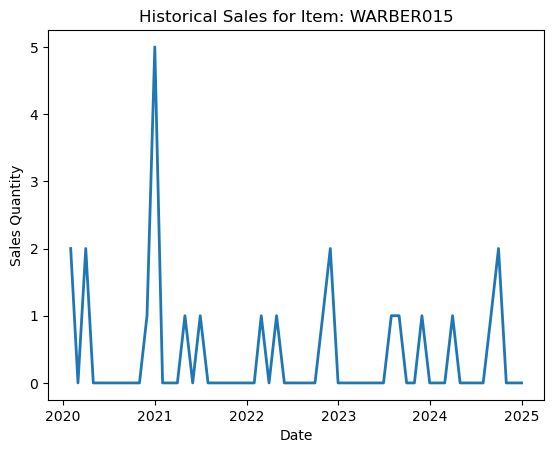

Historical demand for Item: WARBER016


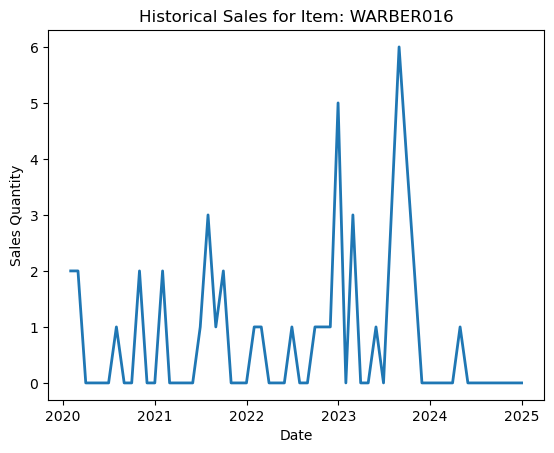

Historical demand for Item: WARBER022


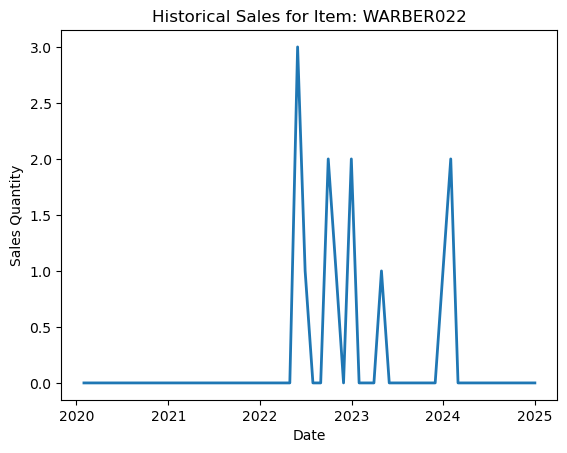

Historical demand for Item: WARBER023


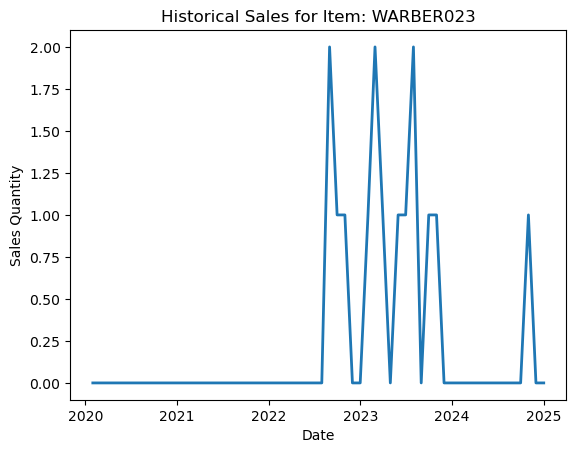

Historical demand for Item: WARBER024


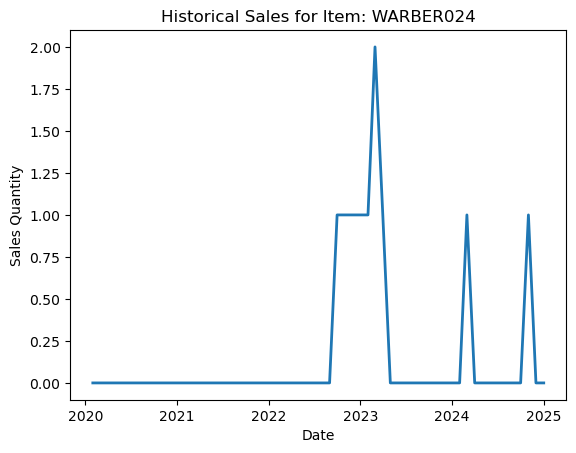

In [26]:
def EDA(ProductNumber, data_filled):
    # Filter data for the specific store and item
    filtered_data = data_filled[(data_filled['ProductNumber'] == ProductNumber)]
    x = filtered_data['month']
    y = filtered_data['Sum of InvoicedQuantity']
    
    # plot
    fig, ax = plt.subplots()
    ax.plot(x, y, linewidth=2.0)

    #plot = (filtered_data)
    plt.title(f"Historical Sales for Item: {ProductNumber}")
    plt.xlabel("Date")
    plt.ylabel("Sales Quantity")
    plt.show()
    
    return filtered_data

item_combinations = data_filled[['ProductNumber']].drop_duplicates()

for _, row in item_combinations.iterrows():
    ProductNumber = row['ProductNumber']
    print(f"Historical demand for Item: {ProductNumber}")
    Historical = EDA(ProductNumber, data_filled)
    

## Function to forecast sales using Facebook Prophet

23:27:49 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: BOLBER001


23:27:49 - cmdstanpy - INFO - Chain [1] done processing


MAE: 0.5, MSE: 2.1666666666666665, RMSE: 1.4719601443879744
Execution time: 0.40 seconds


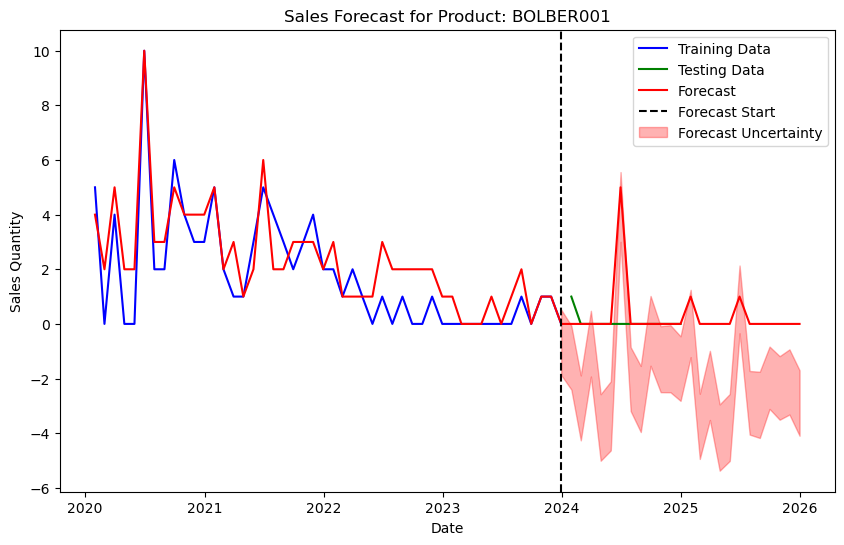

23:27:50 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: BOLBER002


23:27:50 - cmdstanpy - INFO - Chain [1] done processing


MAE: 0.8333333333333334, MSE: 2.3333333333333335, RMSE: 1.5275252316519468
Execution time: 0.32 seconds


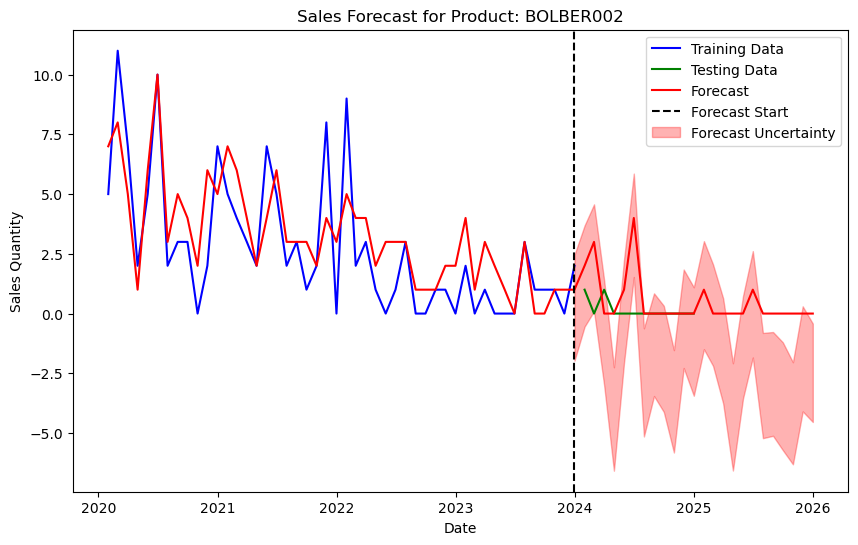

23:27:50 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: BOLBER003


23:27:50 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.8333333333333333, MSE: 5.166666666666667, RMSE: 2.273030282830976
Execution time: 0.33 seconds


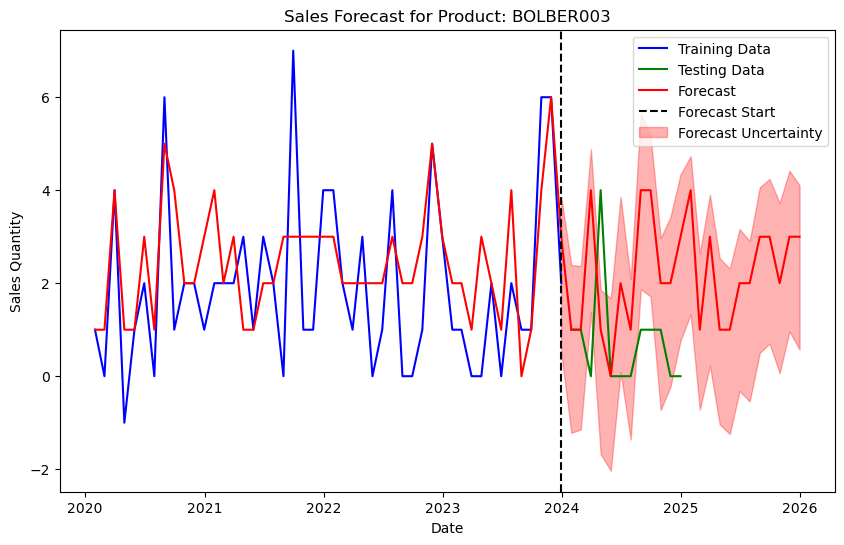

23:27:51 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: BOLBER005


23:27:51 - cmdstanpy - INFO - Chain [1] done processing


MAE: 0.9166666666666666, MSE: 1.25, RMSE: 1.118033988749895
Execution time: 0.34 seconds


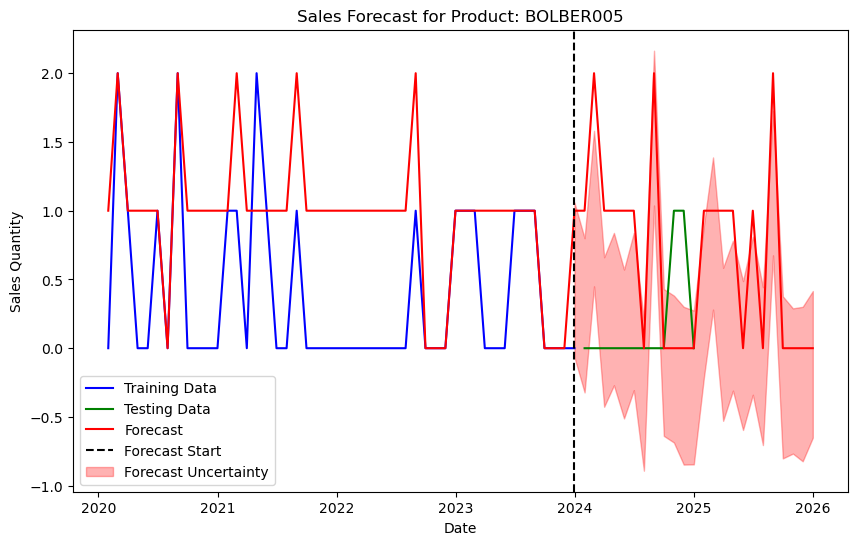

23:27:51 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: BURBER001


23:27:51 - cmdstanpy - INFO - Chain [1] done processing


MAE: 0.5833333333333334, MSE: 1.0833333333333333, RMSE: 1.0408329997330663
Execution time: 0.36 seconds


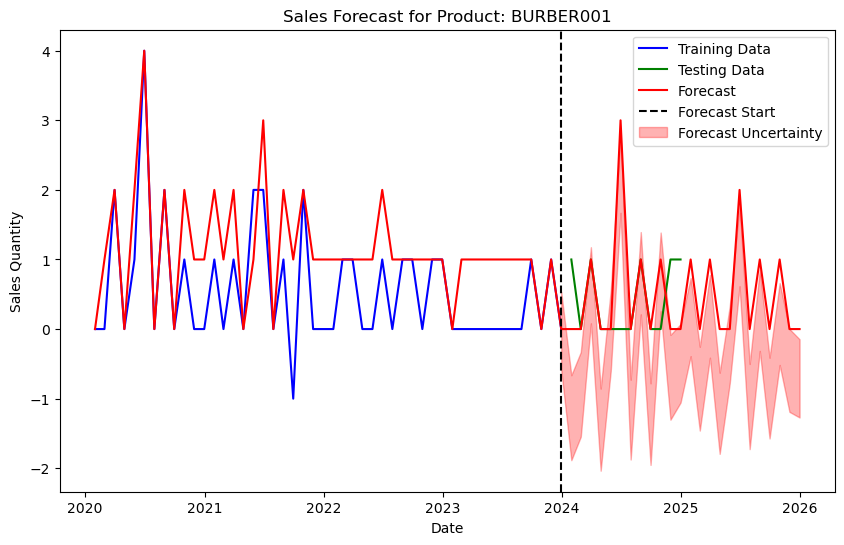

23:27:52 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: BURBER002


23:27:52 - cmdstanpy - INFO - Chain [1] done processing


MAE: 0.9166666666666666, MSE: 2.4166666666666665, RMSE: 1.5545631755148024
Execution time: 0.31 seconds


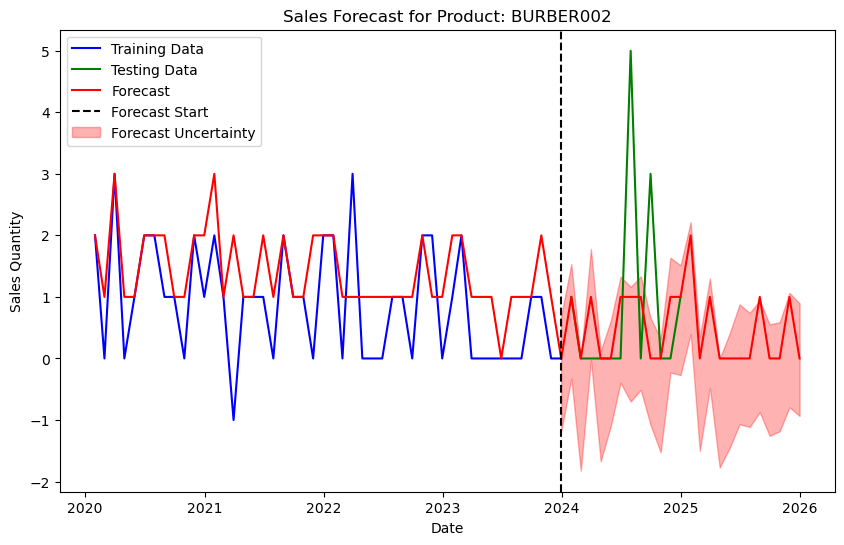

23:27:52 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: BURBER003


23:27:53 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.4166666666666667, MSE: 2.9166666666666665, RMSE: 1.707825127659933
Execution time: 0.38 seconds


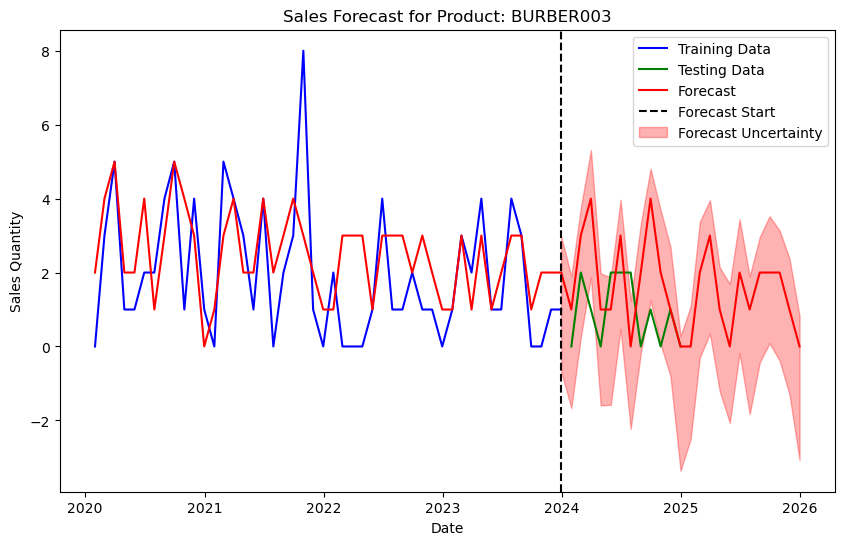

23:27:53 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: BURBER004


23:27:53 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.9166666666666667, MSE: 4.75, RMSE: 2.179449471770337
Execution time: 0.49 seconds


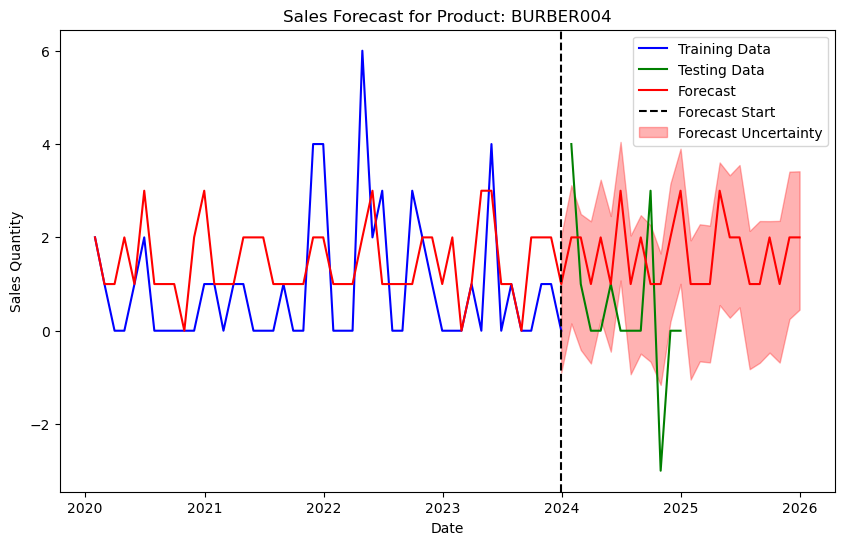

23:27:54 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: BURBER007


23:27:54 - cmdstanpy - INFO - Chain [1] done processing


MAE: 0.6666666666666666, MSE: 0.6666666666666666, RMSE: 0.816496580927726
Execution time: 0.40 seconds


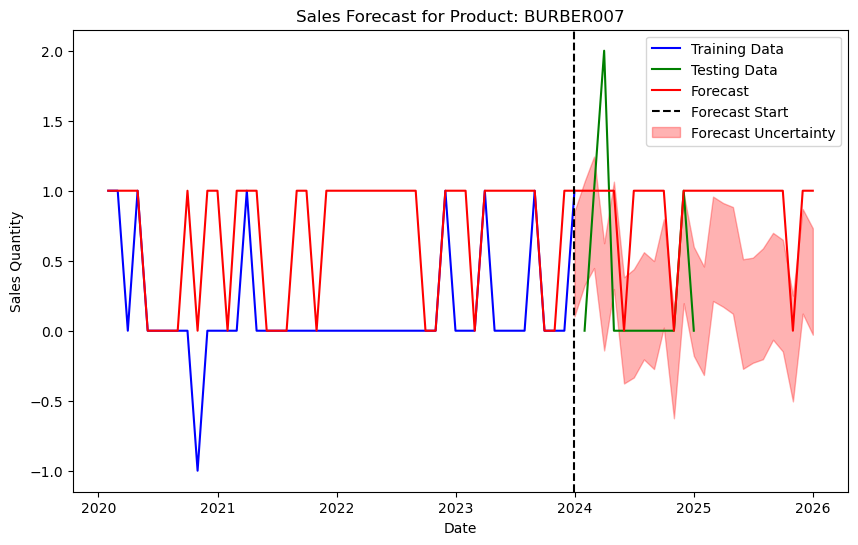

23:27:54 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: COFBER001


23:27:55 - cmdstanpy - INFO - Chain [1] done processing


MAE: 12.416666666666666, MSE: 199.41666666666666, RMSE: 14.121496615680176
Execution time: 0.46 seconds


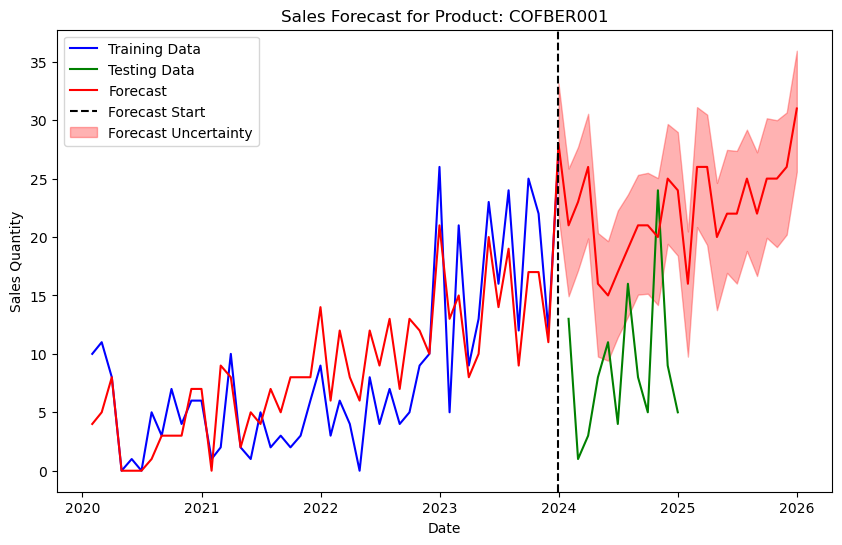

23:27:55 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: COKBER001


23:27:55 - cmdstanpy - INFO - Chain [1] done processing


MAE: 8.166666666666666, MSE: 76.16666666666667, RMSE: 8.727351641057364
Execution time: 0.41 seconds


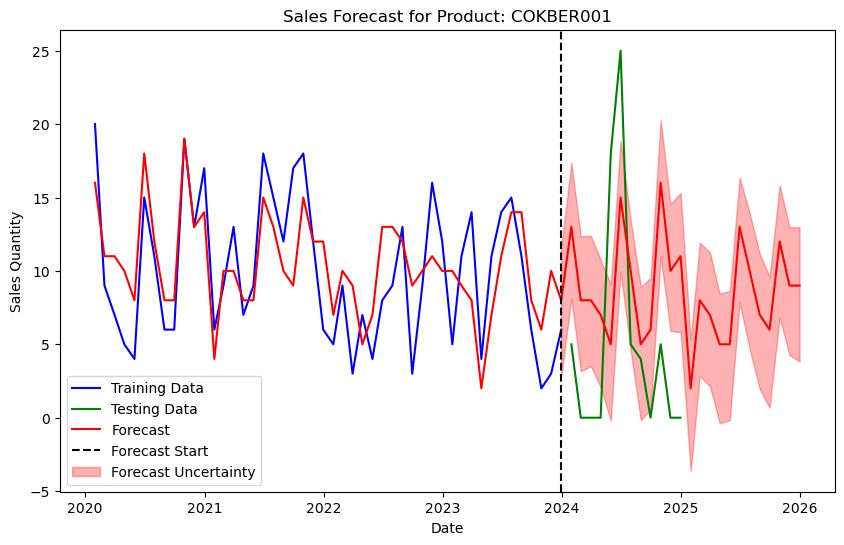

23:27:56 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: FRYBER002


23:27:56 - cmdstanpy - INFO - Chain [1] done processing


MAE: 5.916666666666667, MSE: 43.416666666666664, RMSE: 6.589132466923599
Execution time: 0.36 seconds


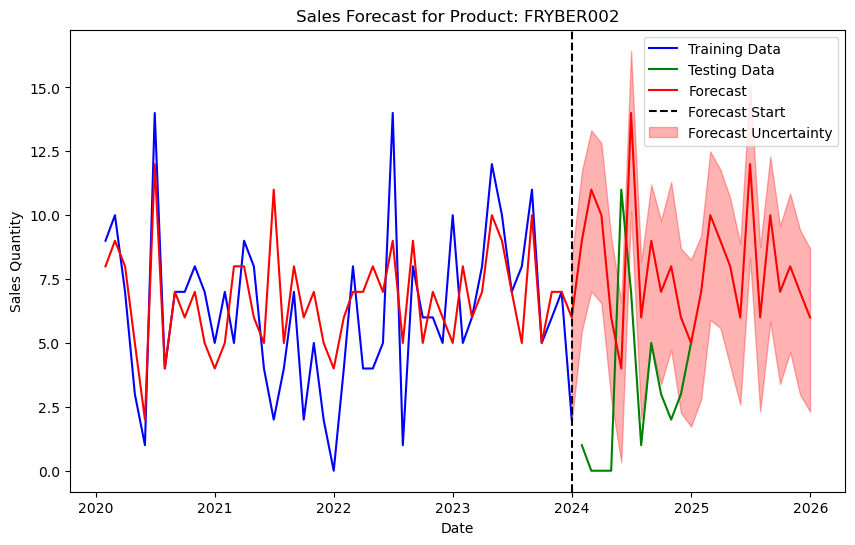

23:27:56 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: FRYBER003


23:27:56 - cmdstanpy - INFO - Chain [1] done processing


MAE: 3.8333333333333335, MSE: 22.666666666666668, RMSE: 4.760952285695233
Execution time: 0.45 seconds


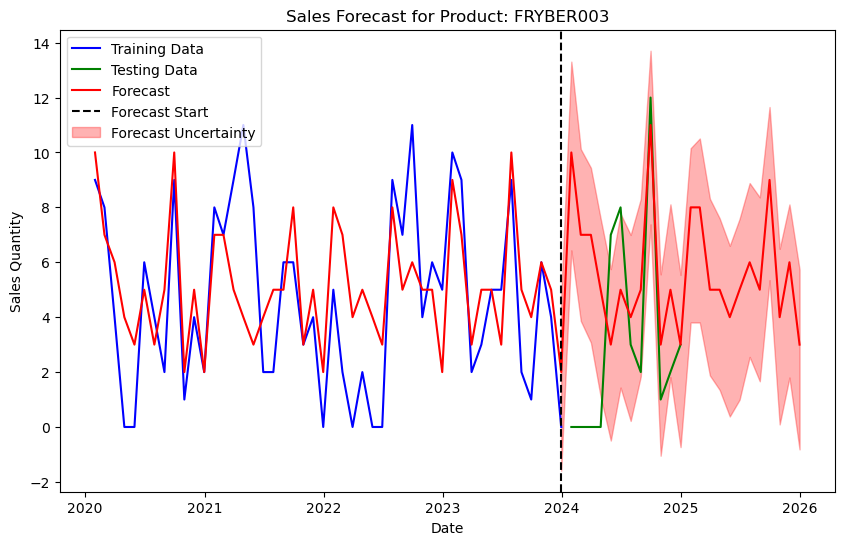

23:27:57 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: FRYBER005


23:27:57 - cmdstanpy - INFO - Chain [1] done processing


MAE: 9.416666666666666, MSE: 98.75, RMSE: 9.937303457175895
Execution time: 0.38 seconds


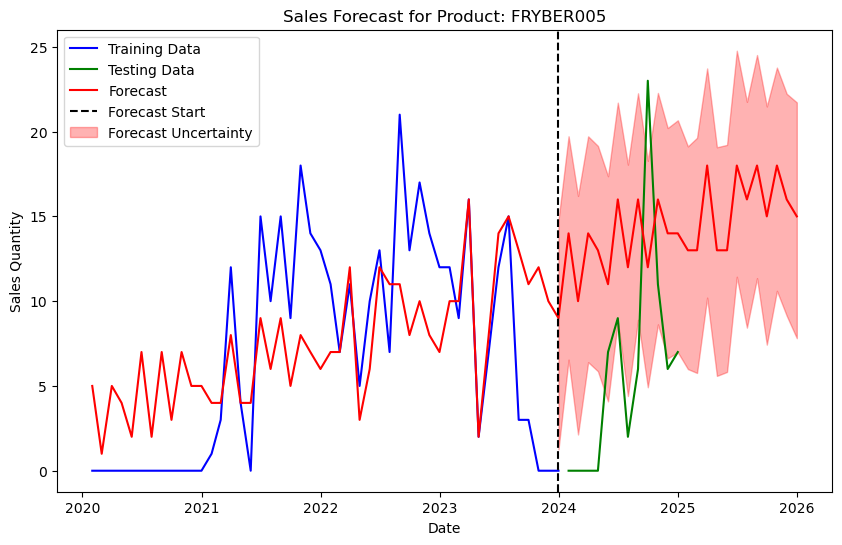

23:27:57 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: GRLBER003


23:27:58 - cmdstanpy - INFO - Chain [1] done processing


MAE: 9.166666666666666, MSE: 146.33333333333334, RMSE: 12.096831541082704
Execution time: 0.33 seconds


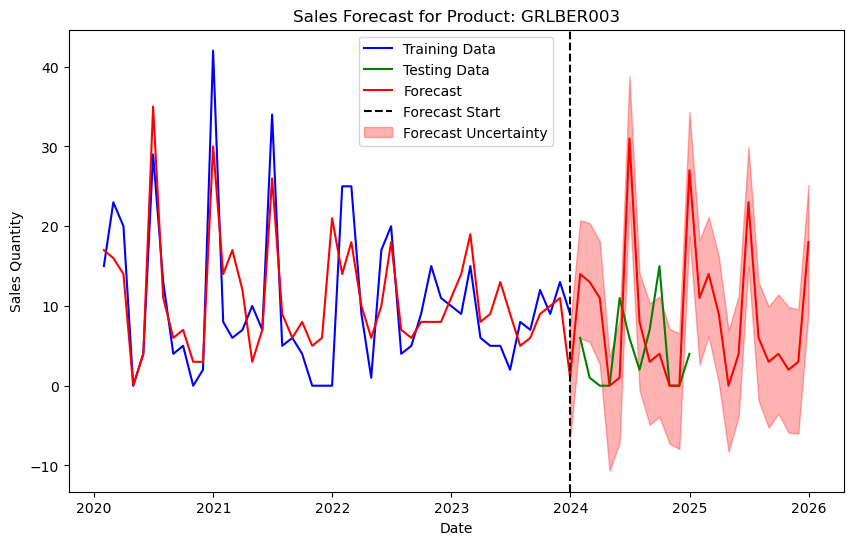

23:27:58 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: GRLBER004


23:27:58 - cmdstanpy - INFO - Chain [1] done processing


MAE: 5.5, MSE: 61.0, RMSE: 7.810249675906654
Execution time: 0.37 seconds


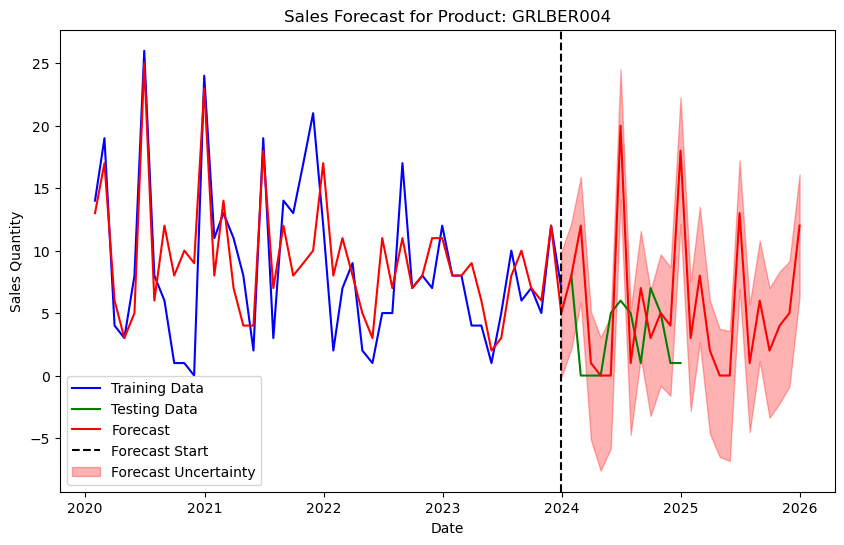

23:27:59 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: GRLBER009


23:27:59 - cmdstanpy - INFO - Chain [1] done processing


MAE: 2.0833333333333335, MSE: 9.416666666666666, RMSE: 3.068658773253661
Execution time: 0.62 seconds


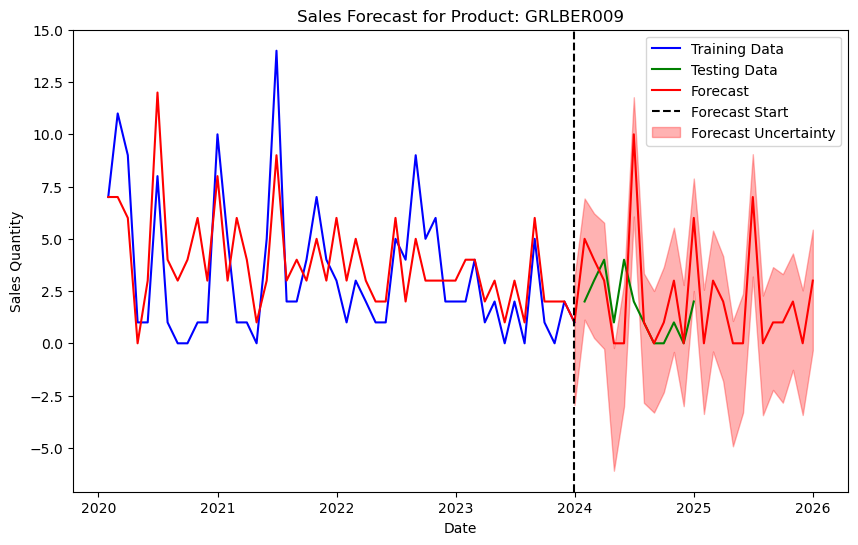

23:27:59 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: GRLBER010


23:28:00 - cmdstanpy - INFO - Chain [1] done processing


MAE: 2.0833333333333335, MSE: 5.583333333333333, RMSE: 2.362907813126304
Execution time: 0.45 seconds


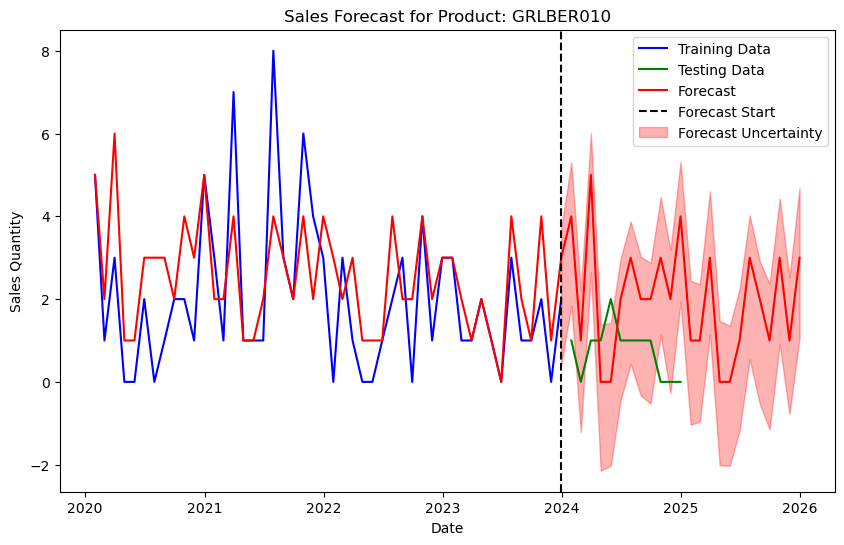

23:28:00 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: GRLBER011


23:28:00 - cmdstanpy - INFO - Chain [1] done processing


MAE: 5.833333333333333, MSE: 36.333333333333336, RMSE: 6.027713773341708
Execution time: 0.39 seconds


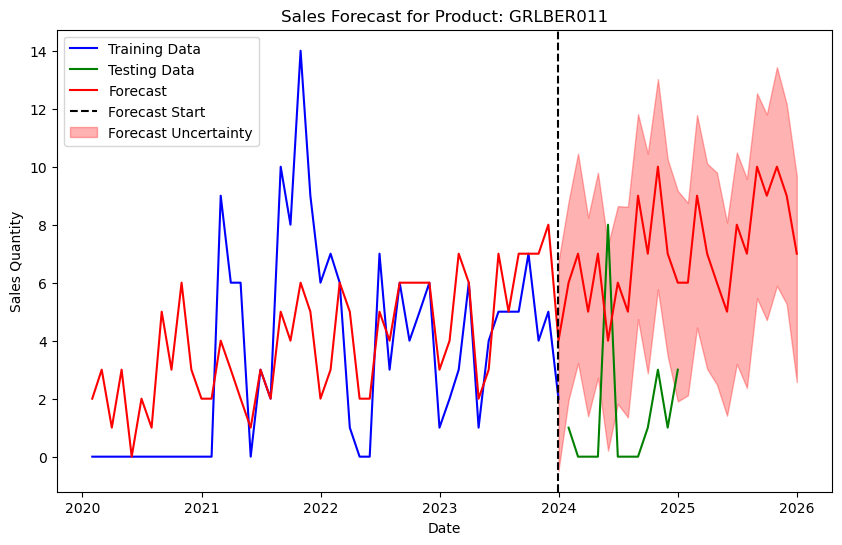

23:28:01 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: GRLBER012


23:28:01 - cmdstanpy - INFO - Chain [1] done processing


MAE: 3.4166666666666665, MSE: 12.583333333333334, RMSE: 3.547299442298794
Execution time: 0.45 seconds


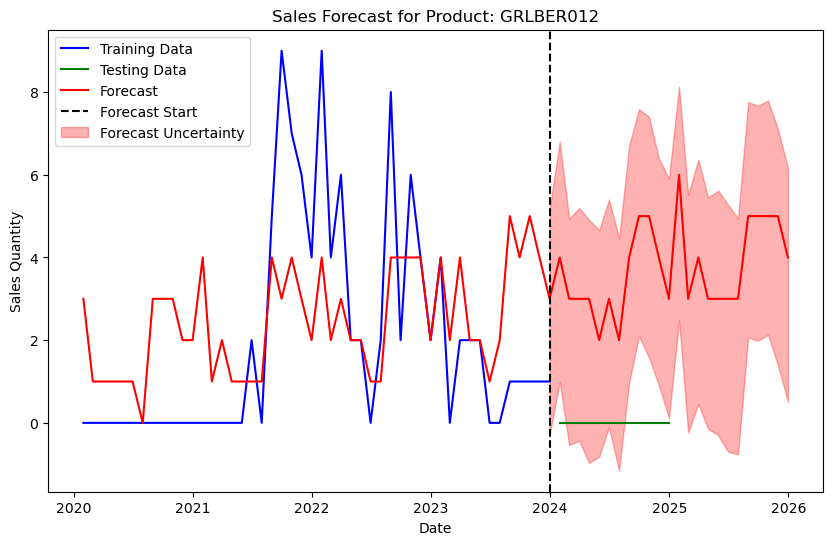

23:28:01 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: GRLBER015


23:28:02 - cmdstanpy - INFO - Chain [1] done processing


MAE: 2.8333333333333335, MSE: 11.666666666666666, RMSE: 3.415650255319866
Execution time: 0.34 seconds


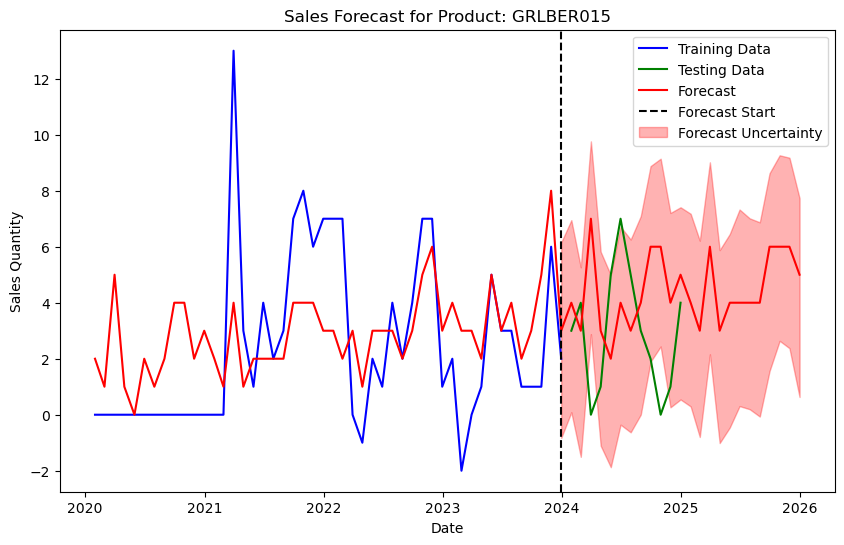

23:28:02 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: GRLBER019


23:28:02 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.0, MSE: 1.1666666666666667, RMSE: 1.0801234497346435
Execution time: 0.35 seconds


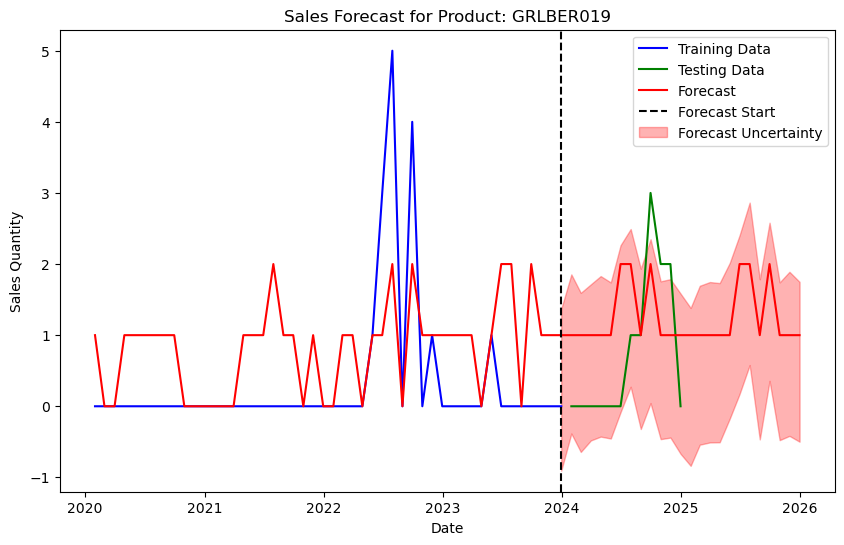

23:28:03 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: GRLBER020


23:28:03 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.4166666666666667, MSE: 3.0833333333333335, RMSE: 1.7559422921421233
Execution time: 0.44 seconds


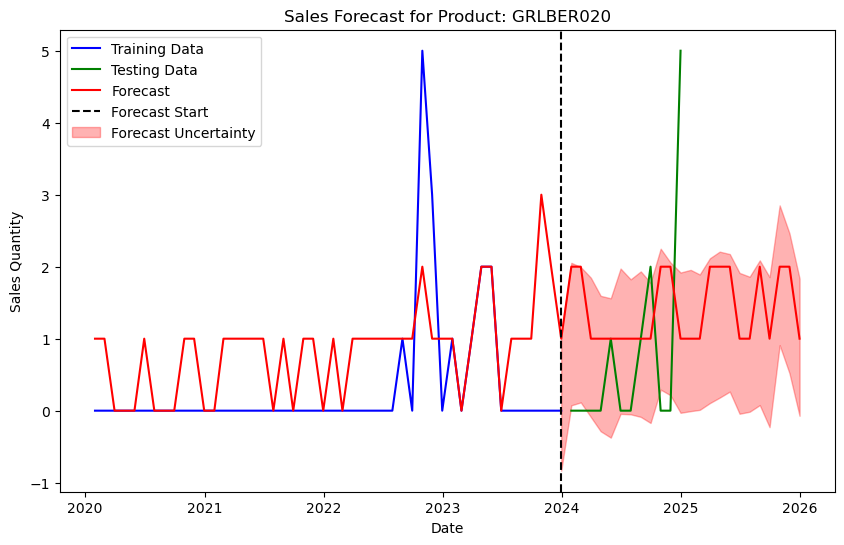

23:28:03 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: HEABER001


23:28:03 - cmdstanpy - INFO - Chain [1] done processing


MAE: 3.0833333333333335, MSE: 15.25, RMSE: 3.905124837953327
Execution time: 0.41 seconds


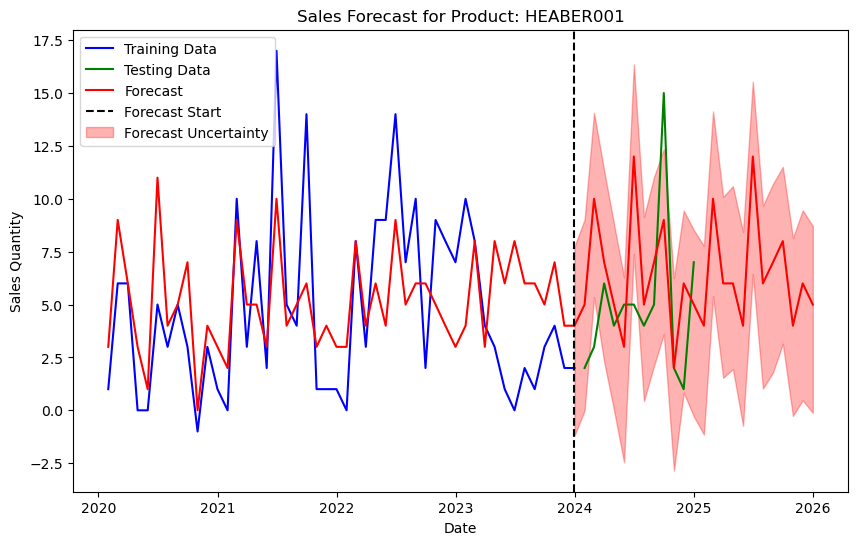

23:28:04 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: HOTBER001


23:28:04 - cmdstanpy - INFO - Chain [1] done processing


MAE: 2.0833333333333335, MSE: 6.916666666666667, RMSE: 2.6299556396765835
Execution time: 0.35 seconds


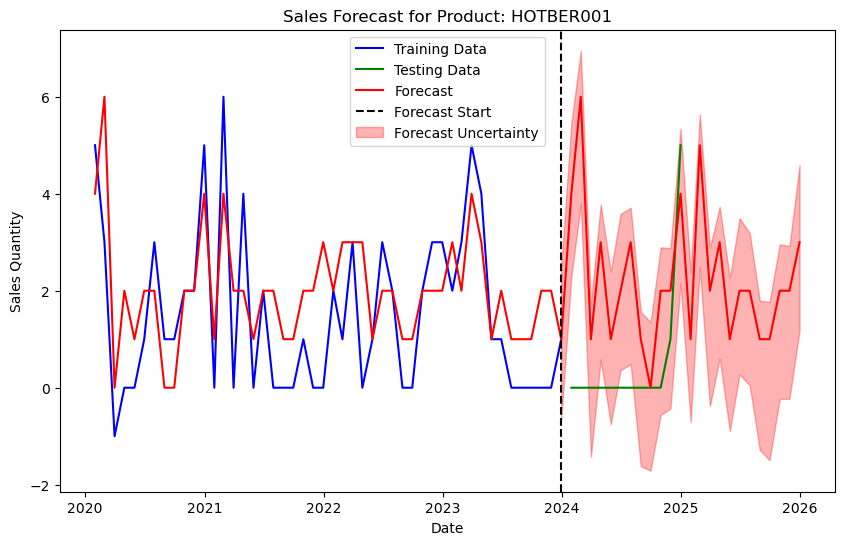

23:28:04 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: HOTBER002


23:28:05 - cmdstanpy - INFO - Chain [1] done processing


MAE: 2.0, MSE: 5.0, RMSE: 2.23606797749979
Execution time: 0.33 seconds


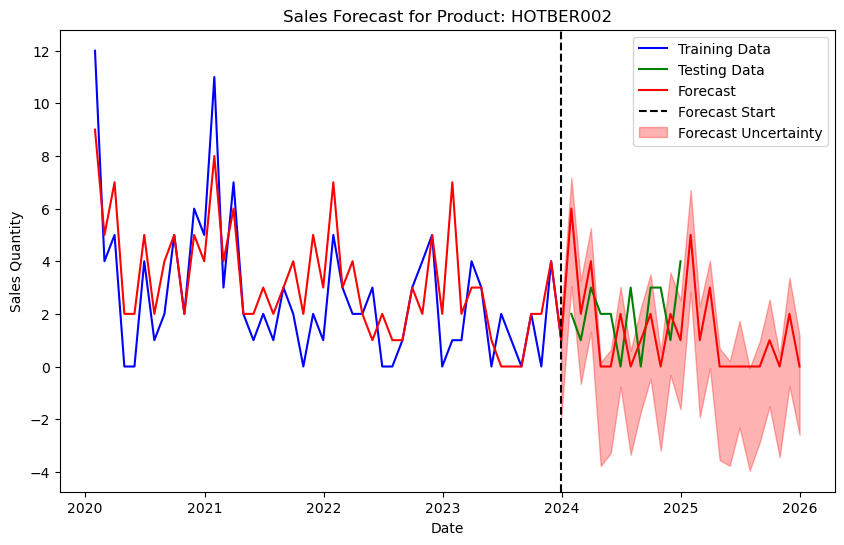

23:28:05 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: HOTBER003


23:28:05 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.9166666666666667, MSE: 6.416666666666667, RMSE: 2.533114025595111
Execution time: 0.39 seconds


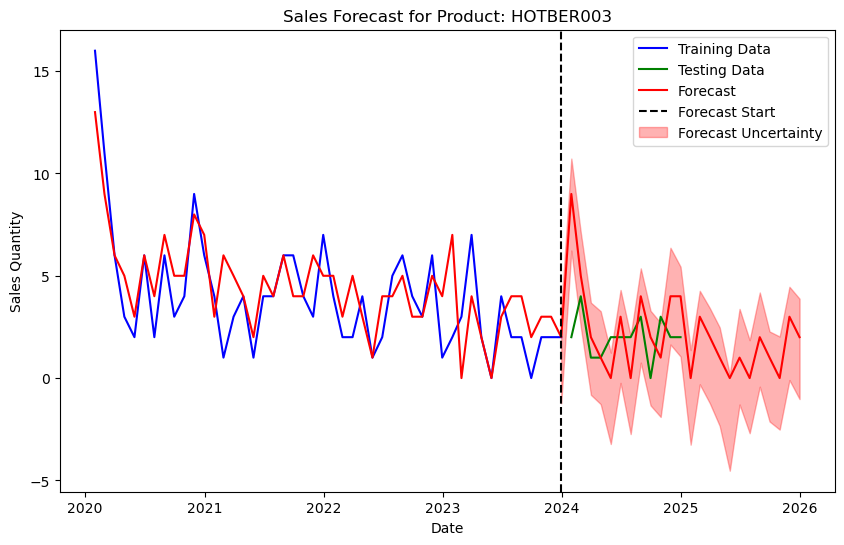

23:28:06 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: ICMBER002


23:28:06 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.0, MSE: 1.3333333333333333, RMSE: 1.1547005383792515
Execution time: 0.44 seconds


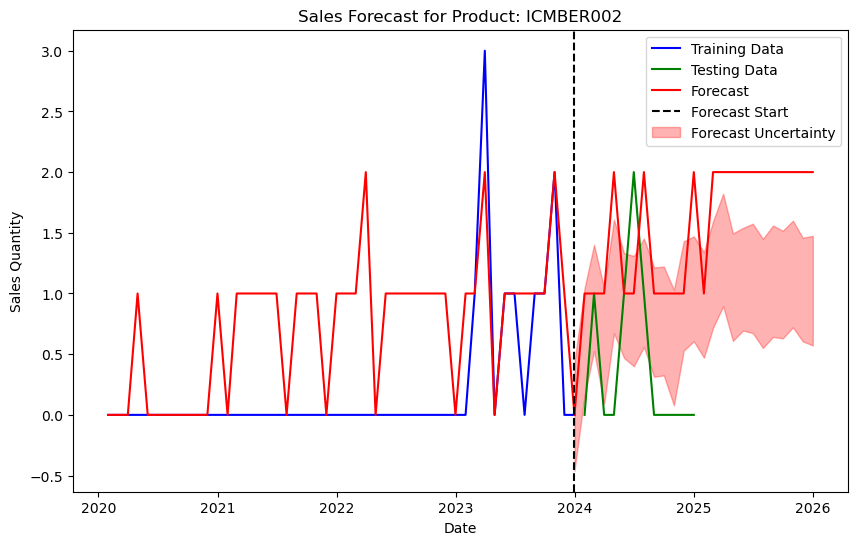

23:28:06 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: ICMBER003


23:28:07 - cmdstanpy - INFO - Chain [1] done processing


MAE: 0.8333333333333334, MSE: 1.3333333333333333, RMSE: 1.1547005383792515
Execution time: 0.56 seconds


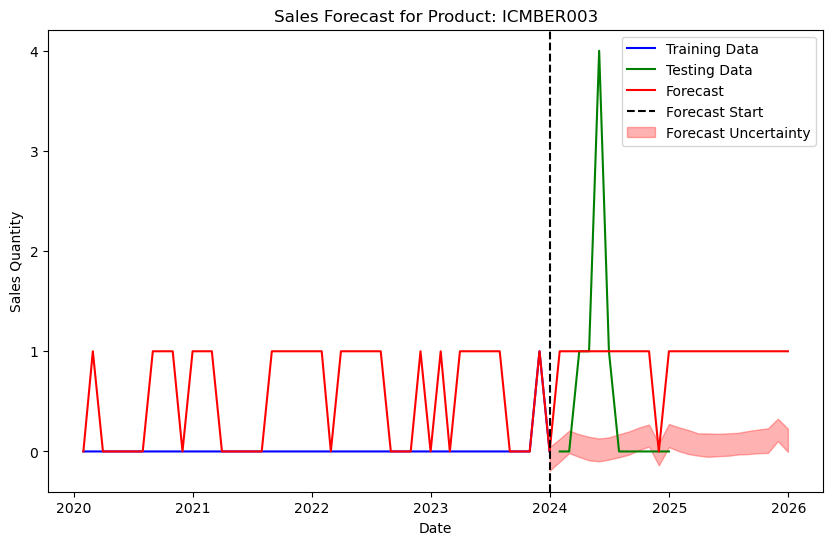

23:28:07 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: MIXBER001


23:28:07 - cmdstanpy - INFO - Chain [1] done processing


MAE: 3.4166666666666665, MSE: 18.75, RMSE: 4.330127018922194
Execution time: 0.36 seconds


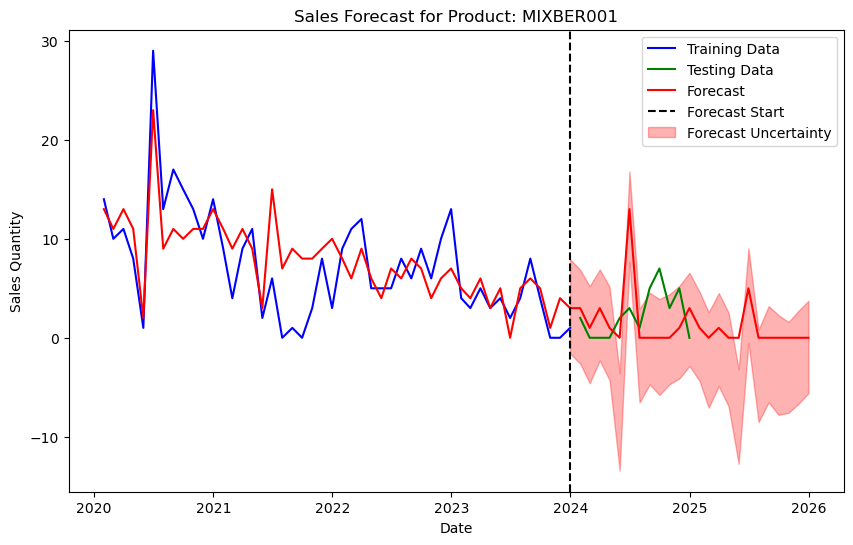

23:28:08 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: MIXBER003


23:28:08 - cmdstanpy - INFO - Chain [1] done processing


MAE: 4.25, MSE: 24.25, RMSE: 4.924428900898052
Execution time: 0.38 seconds


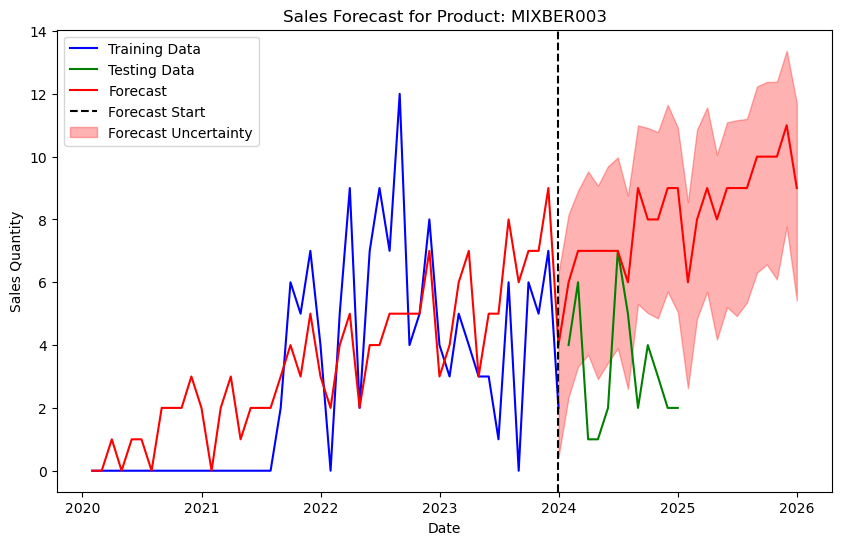

23:28:08 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: OVEBER002


23:28:08 - cmdstanpy - INFO - Chain [1] done processing


MAE: 3.25, MSE: 14.25, RMSE: 3.774917217635375
Execution time: 0.33 seconds


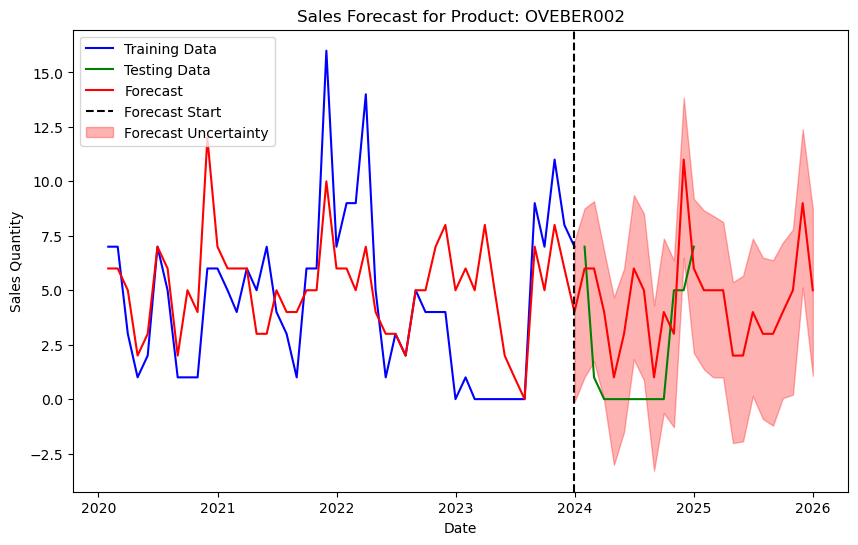

23:28:09 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: OVEBER005


23:28:09 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.0, MSE: 1.6666666666666667, RMSE: 1.2909944487358056
Execution time: 0.32 seconds


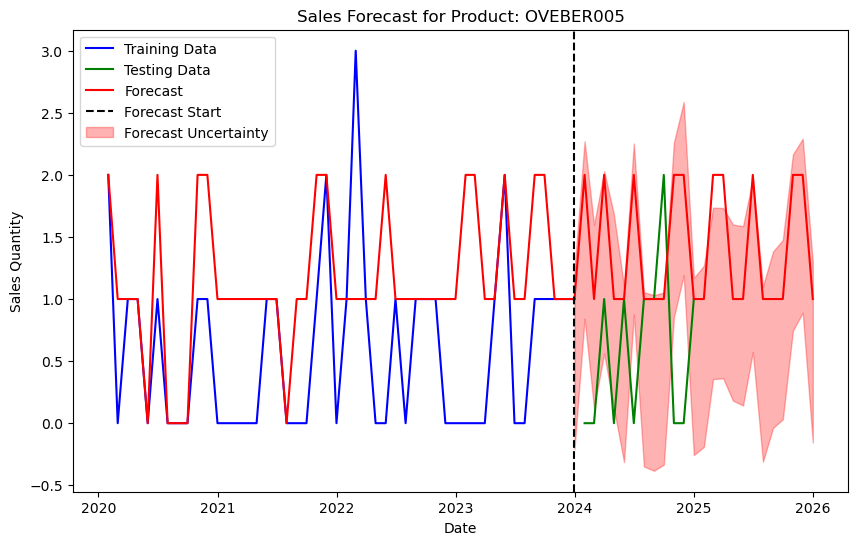

23:28:09 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: OVEBER006


23:28:10 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.0833333333333333, MSE: 1.5833333333333333, RMSE: 1.2583057392117916
Execution time: 0.38 seconds


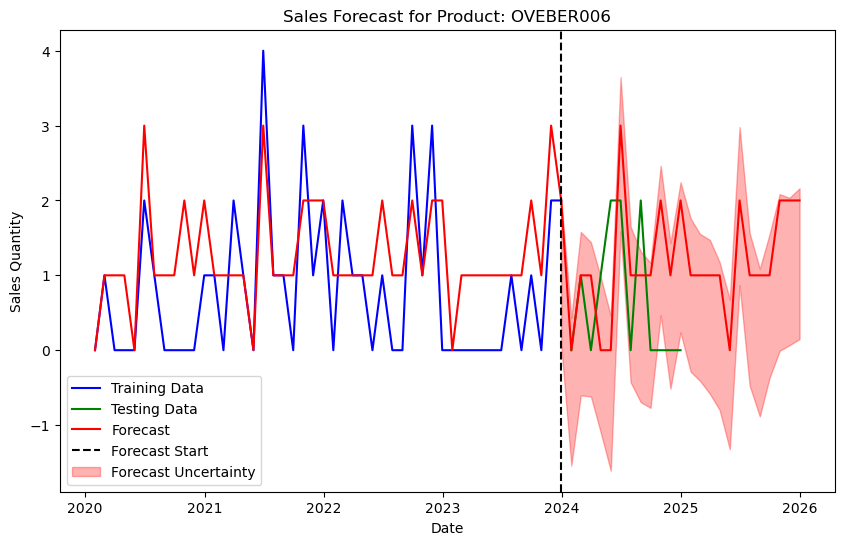

23:28:10 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: OVEBER011


23:28:10 - cmdstanpy - INFO - Chain [1] done processing


MAE: 6.75, MSE: 64.25, RMSE: 8.0156097709407
Execution time: 0.34 seconds


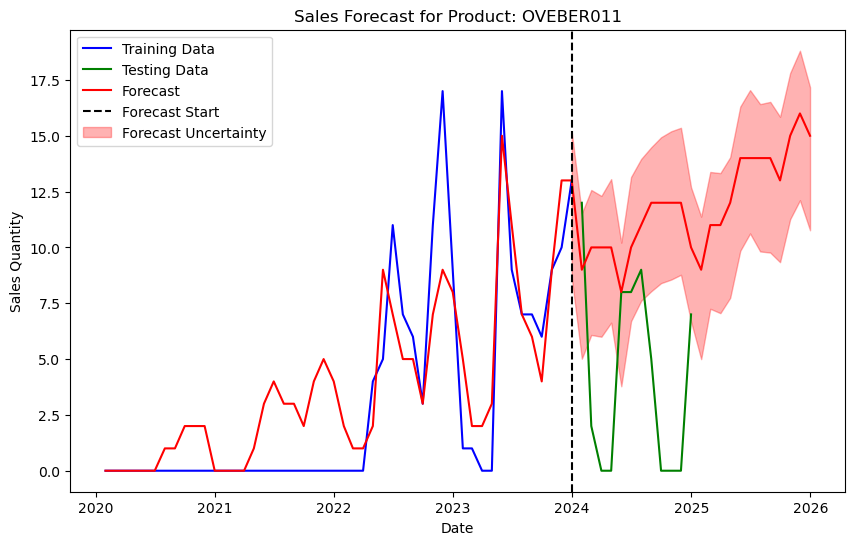

23:28:11 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: OVEBER012


23:28:11 - cmdstanpy - INFO - Chain [1] done processing


MAE: 4.333333333333333, MSE: 22.666666666666668, RMSE: 4.760952285695233
Execution time: 0.54 seconds


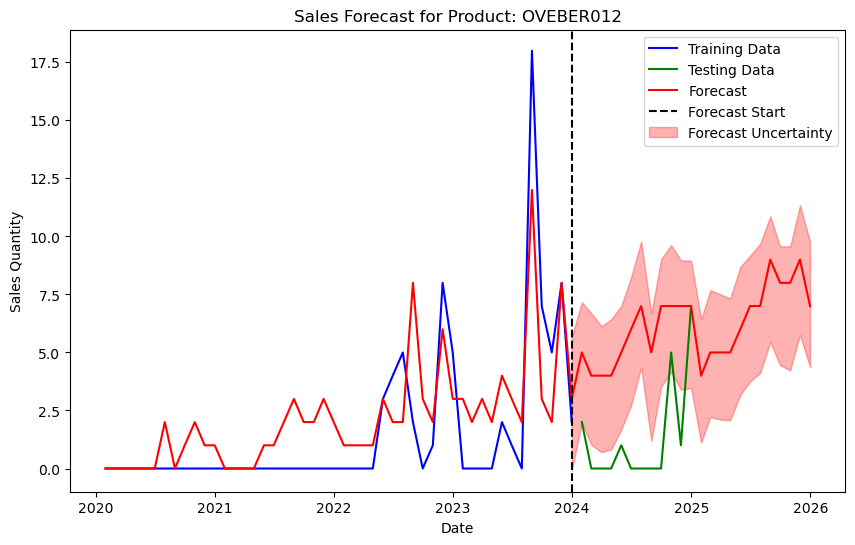

23:28:11 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: OVEBER013


23:28:12 - cmdstanpy - INFO - Chain [1] done processing


MAE: 4.25, MSE: 26.083333333333332, RMSE: 5.107184482014854
Execution time: 0.51 seconds


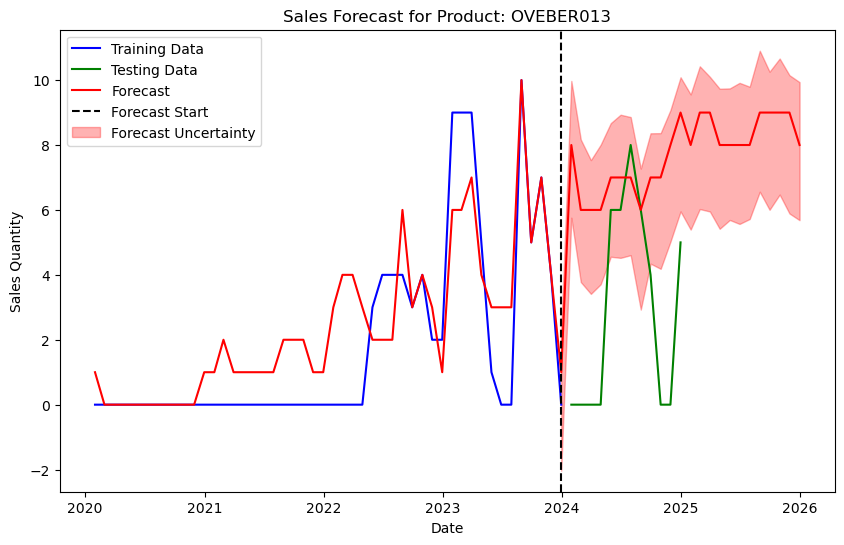

23:28:12 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: OVEBER014


23:28:12 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.8333333333333333, MSE: 4.333333333333333, RMSE: 2.0816659994661326
Execution time: 0.37 seconds


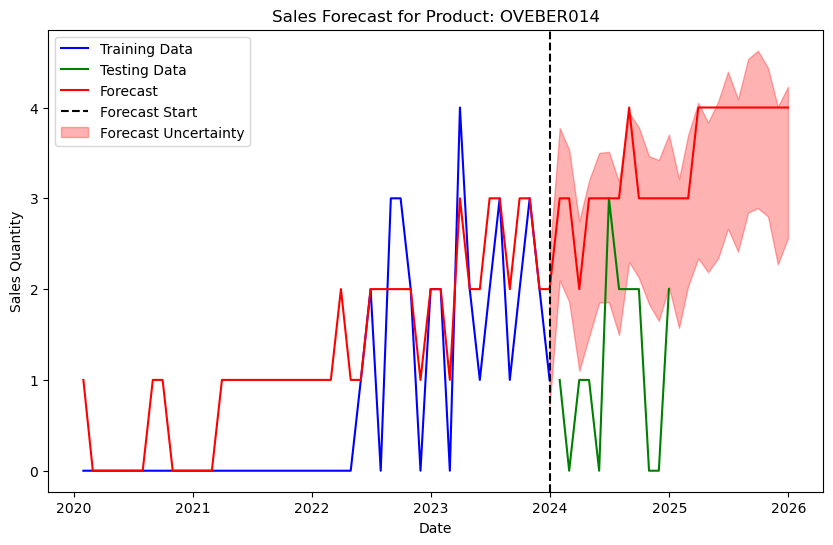

23:28:13 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: OVEBER015


23:28:13 - cmdstanpy - INFO - Chain [1] done processing


MAE: 0.6666666666666666, MSE: 0.8333333333333334, RMSE: 0.9128709291752769
Execution time: 0.38 seconds


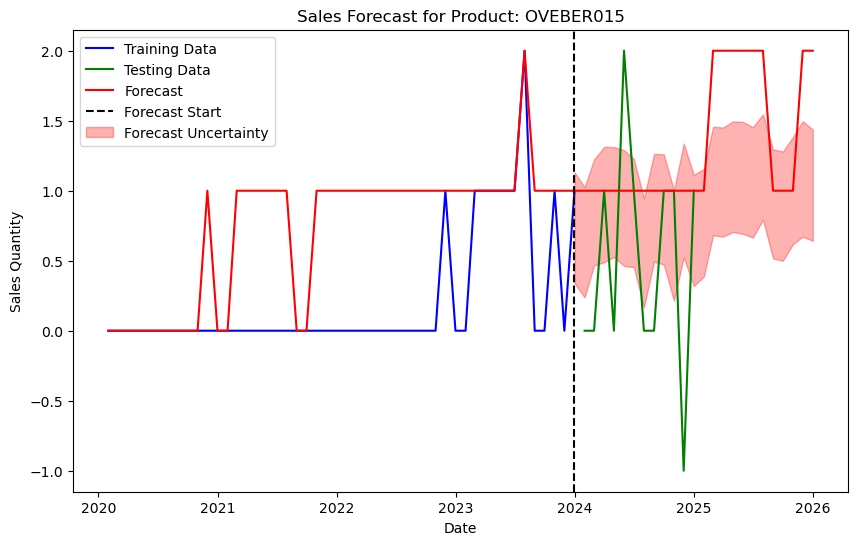

23:28:13 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: OVEBER016


23:28:13 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.25, MSE: 3.4166666666666665, RMSE: 1.848422751068236
Execution time: 0.37 seconds


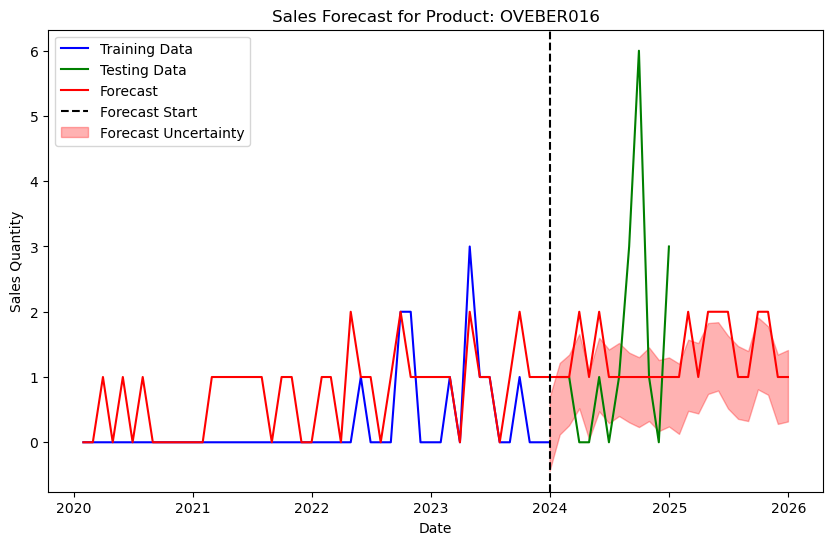

23:28:14 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: OVEBER017


23:28:14 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.25, MSE: 2.75, RMSE: 1.6583123951777
Execution time: 0.36 seconds


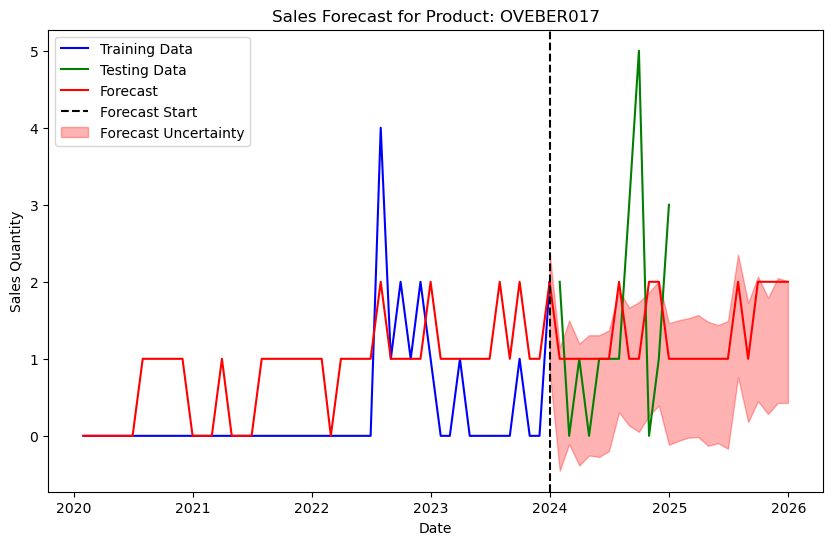

23:28:14 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: POPBER001


23:28:15 - cmdstanpy - INFO - Chain [1] done processing


MAE: 4.333333333333333, MSE: 29.666666666666668, RMSE: 5.446711546122731
Execution time: 0.39 seconds


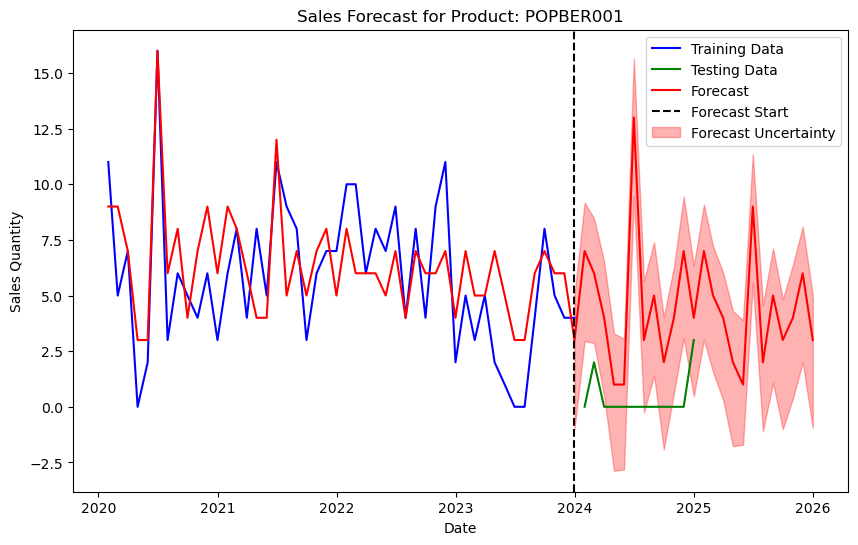

23:28:15 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: SOPBER001


23:28:15 - cmdstanpy - INFO - Chain [1] done processing


MAE: 2.75, MSE: 13.416666666666666, RMSE: 3.662876829305985
Execution time: 0.33 seconds


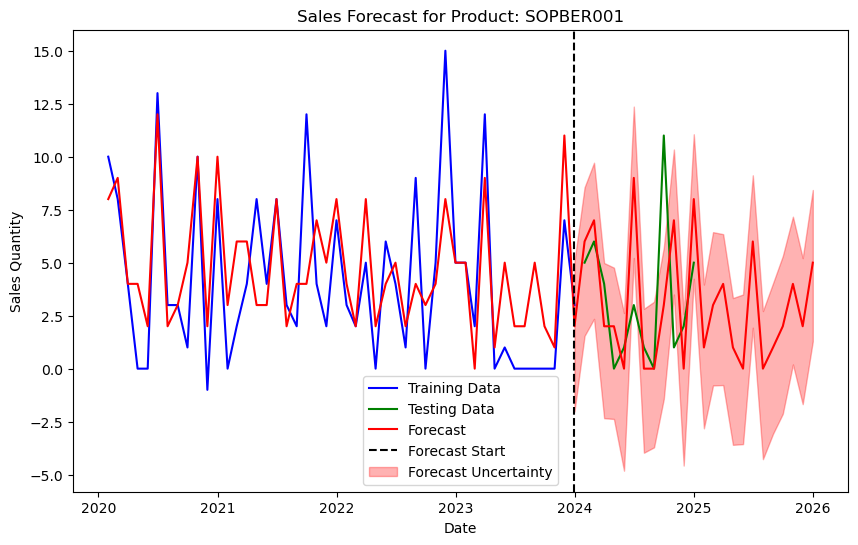

23:28:16 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: TROBER001


23:28:16 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.9166666666666667, MSE: 4.75, RMSE: 2.179449471770337
Execution time: 0.39 seconds


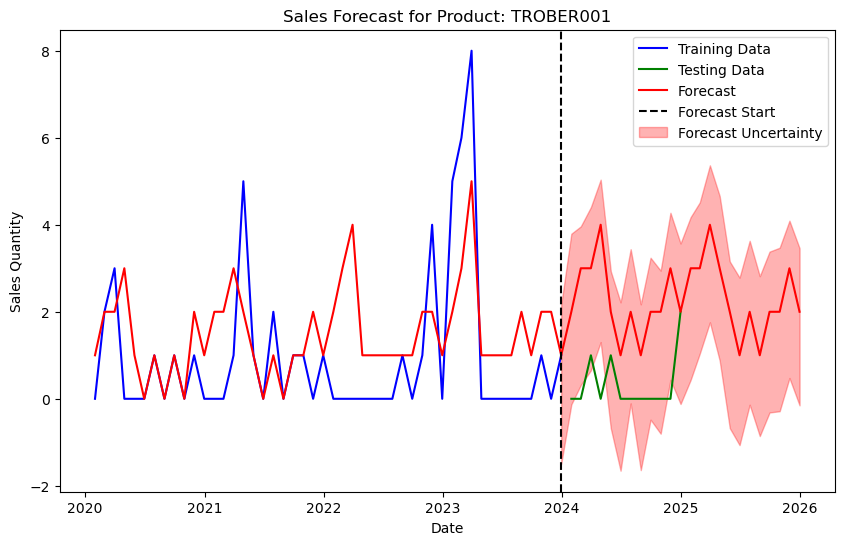

23:28:16 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: TROBER003


23:28:16 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.5833333333333333, MSE: 3.4166666666666665, RMSE: 1.848422751068236
Execution time: 0.30 seconds


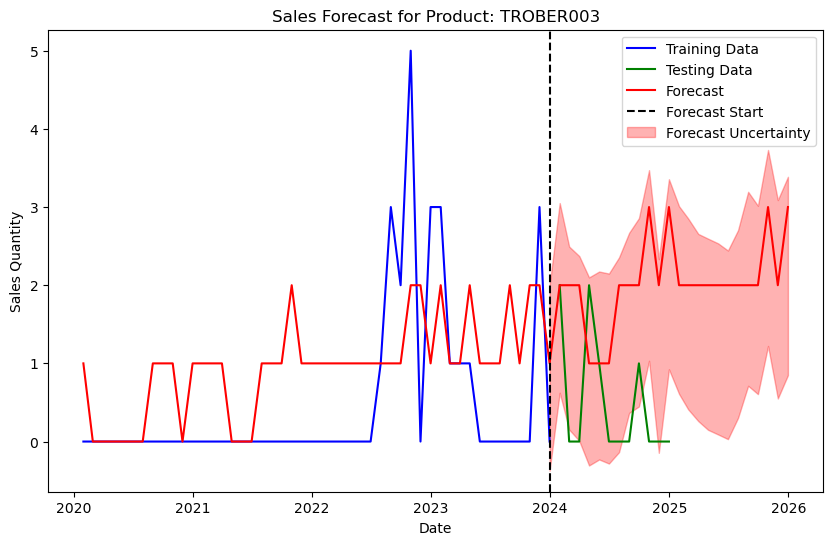

23:28:17 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: WARBER001


23:28:17 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.8333333333333333, MSE: 5.666666666666667, RMSE: 2.3804761428476167
Execution time: 0.37 seconds


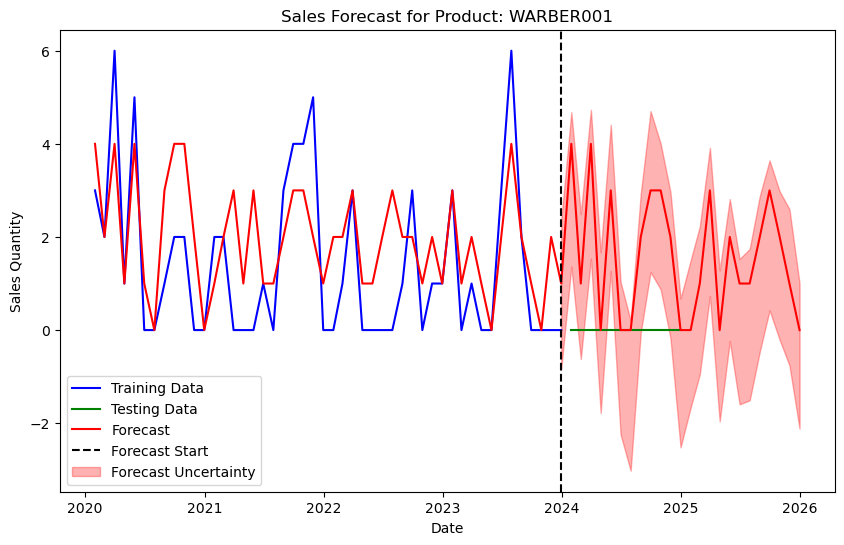

23:28:17 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: WARBER002


23:28:17 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.5, MSE: 3.0, RMSE: 1.7320508075688772
Execution time: 0.48 seconds


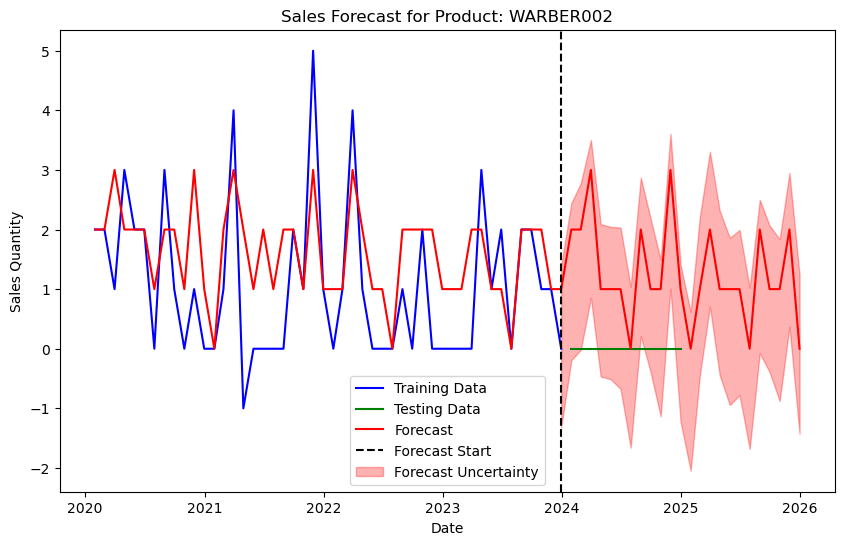

23:28:18 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: WARBER003


23:28:18 - cmdstanpy - INFO - Chain [1] done processing


MAE: 0.8333333333333334, MSE: 1.1666666666666667, RMSE: 1.0801234497346435
Execution time: 0.41 seconds


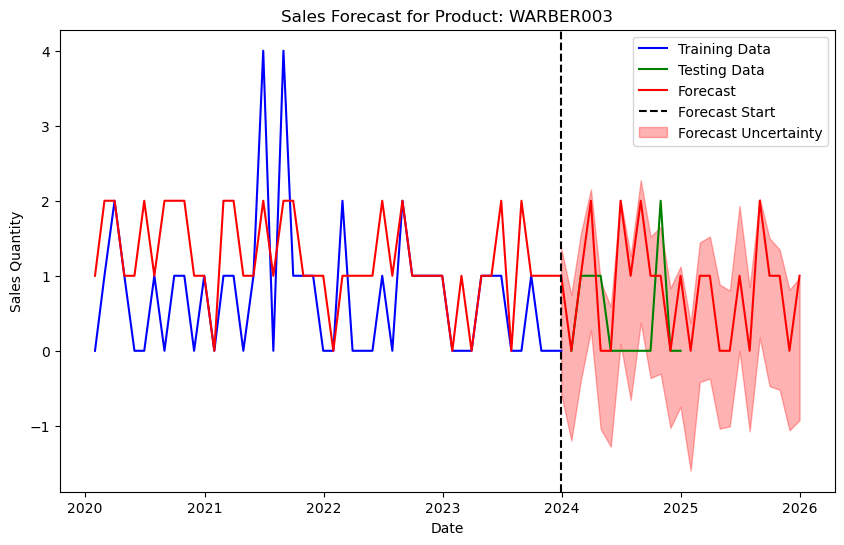

23:28:19 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: WARBER004


23:28:19 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.1666666666666667, MSE: 1.6666666666666667, RMSE: 1.2909944487358056
Execution time: 0.36 seconds


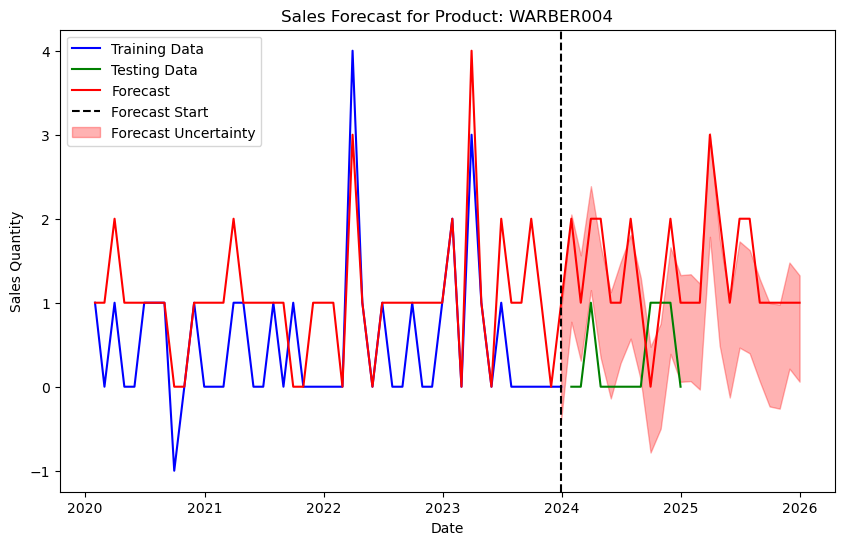

23:28:19 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: WARBER005


23:28:19 - cmdstanpy - INFO - Chain [1] done processing


MAE: 0.6666666666666666, MSE: 0.8333333333333334, RMSE: 0.9128709291752769
Execution time: 0.46 seconds


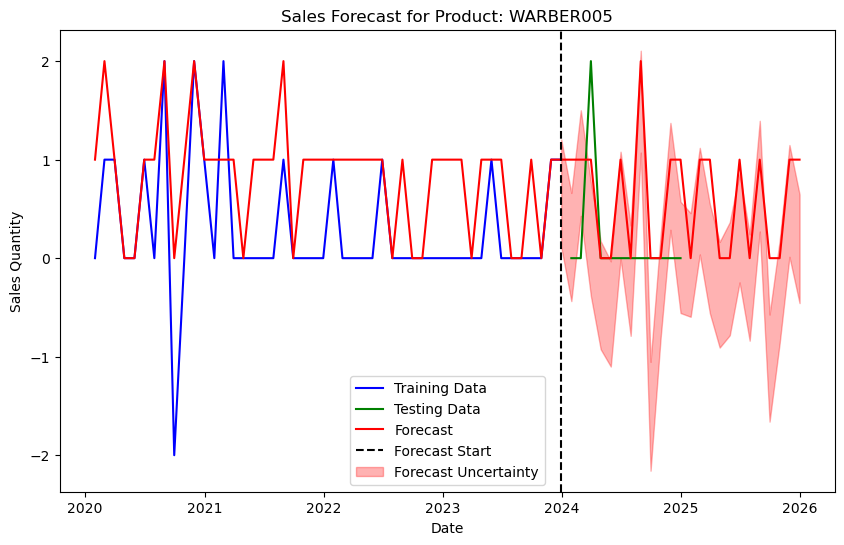

23:28:20 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: WARBER006


23:28:20 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.0, MSE: 2.8333333333333335, RMSE: 1.6832508230603465
Execution time: 0.48 seconds


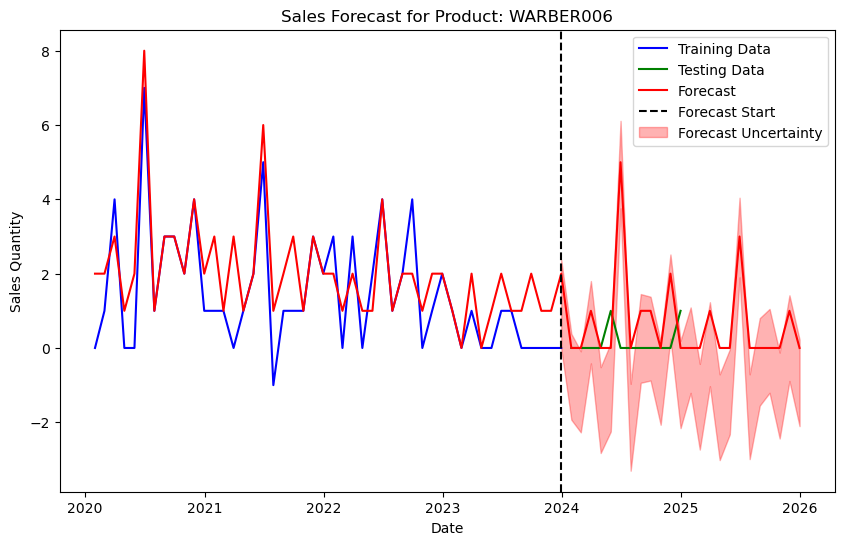

23:28:21 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: WARBER009


23:28:21 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.25, MSE: 2.75, RMSE: 1.6583123951777
Execution time: 0.35 seconds


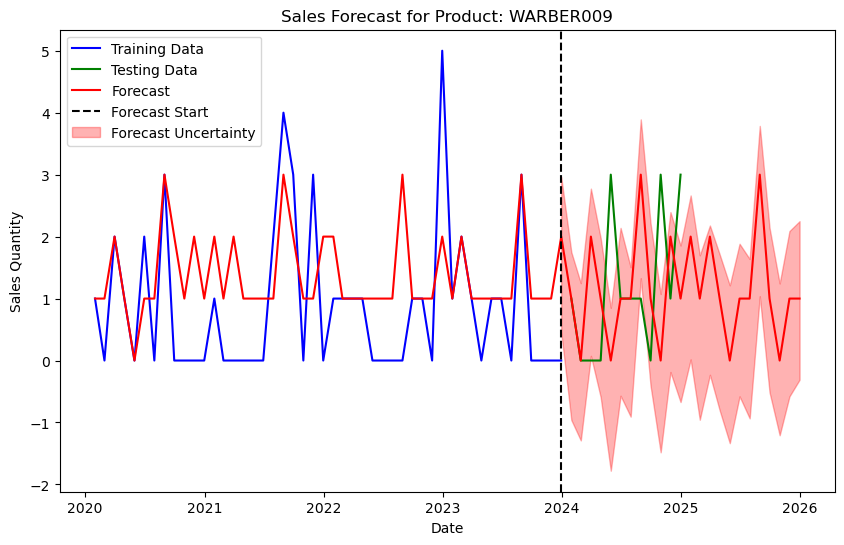

23:28:21 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: WARBER010


23:28:21 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.6666666666666667, MSE: 3.8333333333333335, RMSE: 1.9578900207451218
Execution time: 0.38 seconds


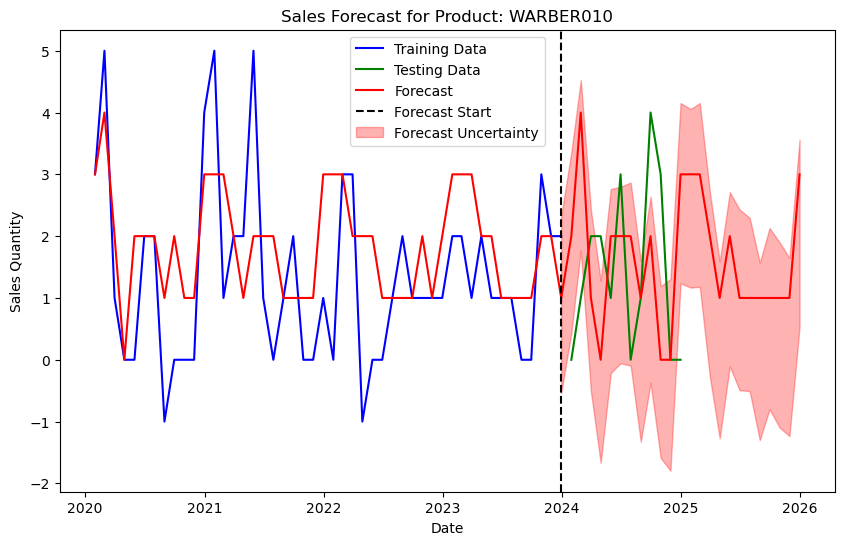

23:28:22 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: WARBER011


23:28:22 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.75, MSE: 3.5833333333333335, RMSE: 1.8929694486000912
Execution time: 0.40 seconds


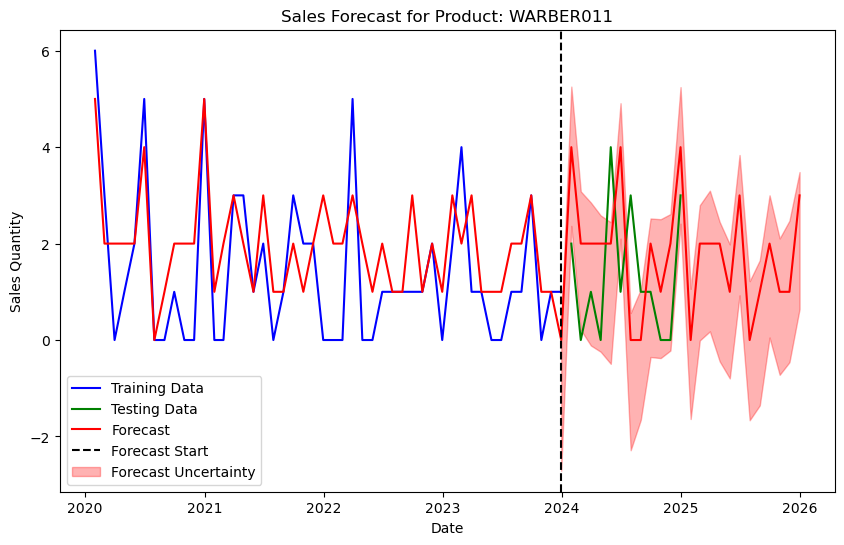

23:28:23 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: WARBER012


23:28:23 - cmdstanpy - INFO - Chain [1] done processing


MAE: 0.3333333333333333, MSE: 0.3333333333333333, RMSE: 0.5773502691896257
Execution time: 0.33 seconds


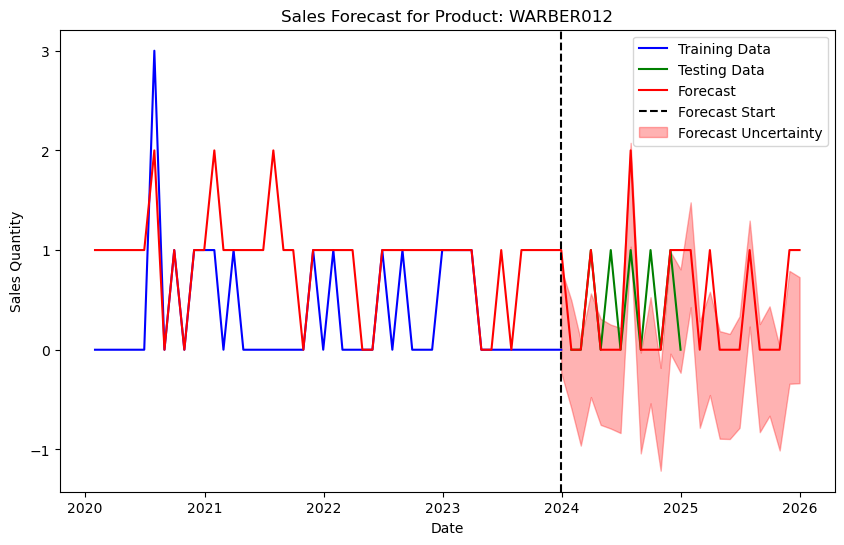

23:28:23 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: WARBER013


23:28:23 - cmdstanpy - INFO - Chain [1] done processing


MAE: 0.8333333333333334, MSE: 1.3333333333333333, RMSE: 1.1547005383792515
Execution time: 0.45 seconds


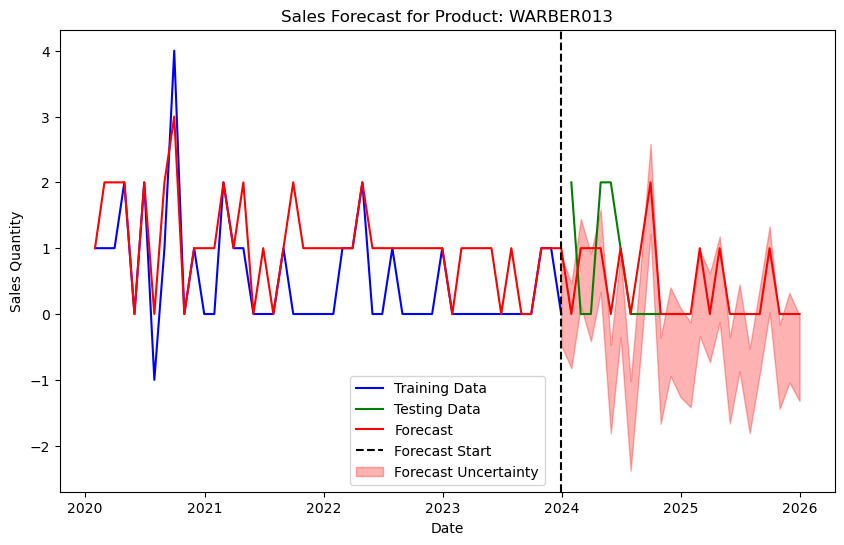

23:28:24 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: WARBER015


23:28:24 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.0833333333333333, MSE: 2.4166666666666665, RMSE: 1.5545631755148024
Execution time: 0.40 seconds


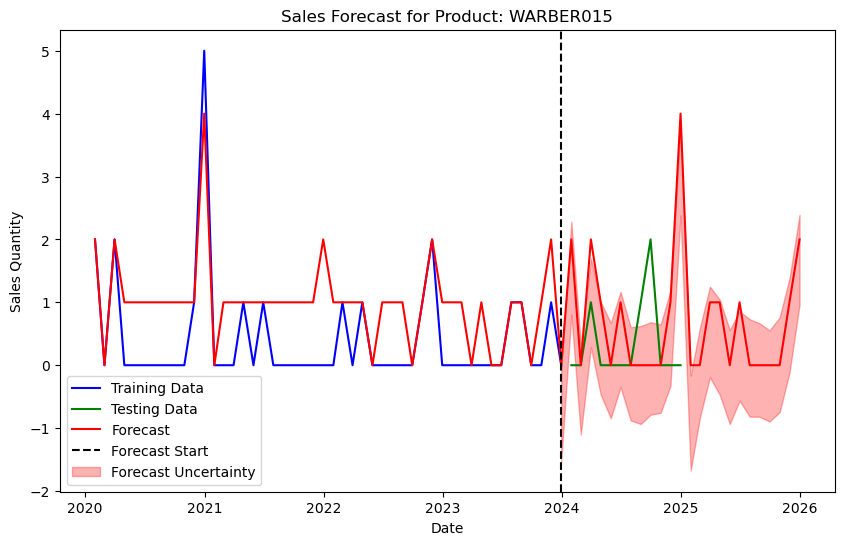

23:28:24 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: WARBER016


23:28:25 - cmdstanpy - INFO - Chain [1] done processing


MAE: 2.3333333333333335, MSE: 6.166666666666667, RMSE: 2.48327740429189
Execution time: 0.39 seconds


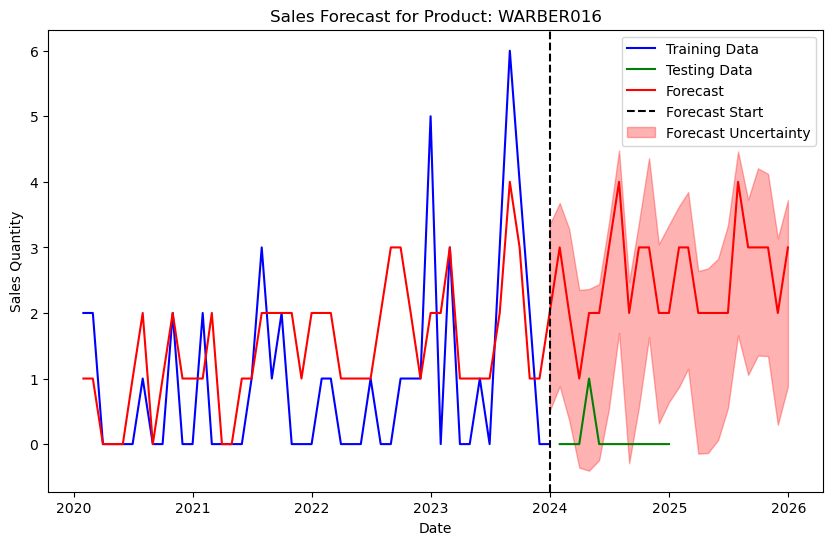

23:28:25 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: WARBER022


23:28:25 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.0, MSE: 1.0, RMSE: 1.0
Execution time: 0.41 seconds


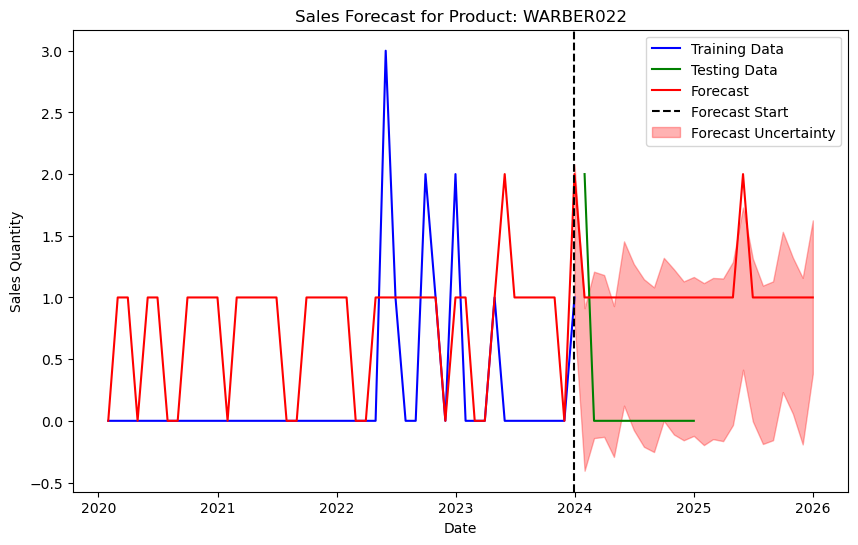

23:28:26 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: WARBER023


23:28:26 - cmdstanpy - INFO - Chain [1] done processing


MAE: 1.75, MSE: 3.25, RMSE: 1.8027756377319946
Execution time: 0.45 seconds


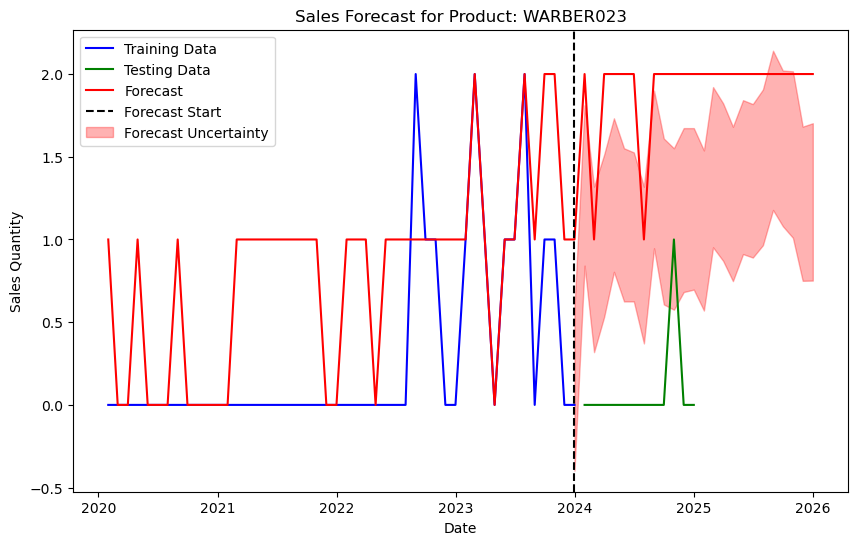

23:28:26 - cmdstanpy - INFO - Chain [1] start processing


Forecasting for Item: WARBER024


23:28:26 - cmdstanpy - INFO - Chain [1] done processing


MAE: 0.8333333333333334, MSE: 0.8333333333333334, RMSE: 0.9128709291752769
Execution time: 0.37 seconds


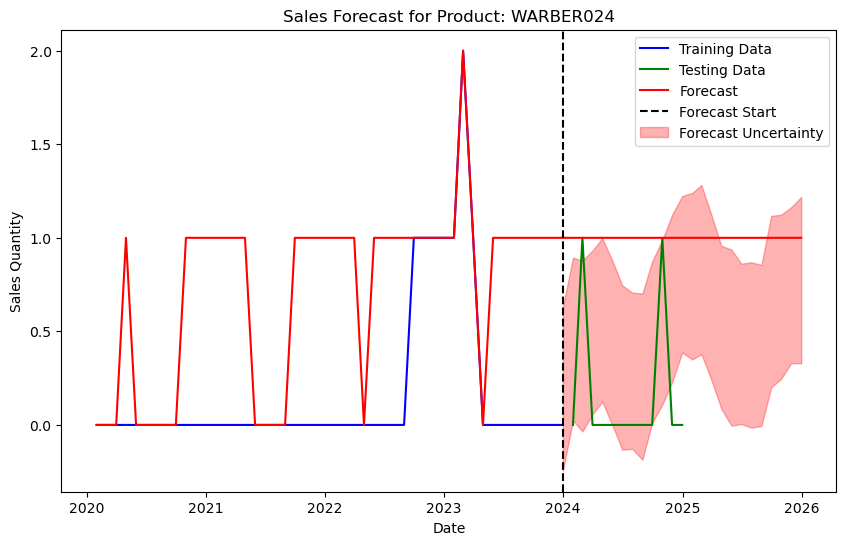

In [28]:
def forecast_sales(ProductNumber, data_filled, horizon_months=12):
    # Record the start time
    start_time = time.time()
    
    # Filter data for the specific store and item
    filtered_data = data_filled[(data_filled['ProductNumber'] == ProductNumber)]
    
    if filtered_data.empty:
        print(f"No data available for Item: {ProductNumber}")
        return None
    
    # Prepare data for Prophet
    df_prophet = filtered_data[['month', 'Sum of InvoicedQuantity']].rename(columns={'month': 'ds', 'Sum of InvoicedQuantity': 'y'})

    # Split the data into training and testing sets
    split_date = pd.Timestamp("2024-01-01") 
    train_data = df_prophet[df_prophet['ds'] < split_date]
    test_data = df_prophet[df_prophet['ds'] >= split_date]
    
    # Initialize and fit the Prophet model on training data
    model = Prophet()
    model.fit(train_data)
    
    # Create future dates for the test period (if this active disable the below line command)
    future = model.make_future_dataframe(periods=len(test_data) + horizon_months, freq='ME')
        
    # Generate forecast
    forecast = model.predict(future)

    # Extract forecasted values for the test period
    forecast_test = forecast[forecast['ds'].isin(test_data['ds'])]

    # Round up the forecast values and Replace negative values with zero after rounding
    forecast['yhat'] = np.ceil(forecast['yhat']).clip(lower=0)

    test_data = test_data.copy() 

    test_data['ds'] = pd.to_datetime(test_data['ds']) 
        
    evaluation_df = pd.merge(
    test_data.rename(columns={'y': 'actual'}),
    forecast[['ds', 'yhat_lower','yhat_upper', 'yhat']],
    on='ds', how='left')

    # Evaluate forecast accuracy
    if not evaluation_df.empty:
        mae = mean_absolute_error(evaluation_df['actual'], evaluation_df['yhat'])
        mse = mean_squared_error(evaluation_df['actual'], evaluation_df['yhat'])
        rmse = root_mean_squared_error(evaluation_df['actual'], evaluation_df['yhat'])
        evaluation_df['MAE'] = mae
        evaluation_df['MSE'] = mse
        evaluation_df['RMSE'] = rmse
        print(f"MAE: {mae}, MSE: {mse}, RMSE: {rmse}")
    else:
        print(f"Test data for Product: {ProductNumber} training period. Skipping accuracy calculation.")
    
    # Record the end time
    end_time = time.time()
    
    # Calculate execution time
    execution_time = end_time - start_time
    
    # Append execution time as a column
    evaluation_df['execution_time_seconds'] = execution_time
    print(f"Execution time: {execution_time:.2f} seconds")  

    # Plot the results
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.plot(train_data['ds'], train_data['y'], label="Training Data", color="blue")
    ax.plot(test_data['ds'], test_data['y'], label="Testing Data", color="green")
    ax.plot(forecast['ds'], forecast['yhat'], label="Forecast", color="red")
    
    # Add a vertical dotted line at the forecast start point
    forecast_start_date = train_data['ds'].iloc[-1]
    ax.axvline(forecast_start_date, color='black', linestyle='--', label="Forecast Start")
    
    # Shade the forecasted area in red
    ax.fill_between(
        forecast['ds'],
        forecast['yhat_lower'],
        forecast['yhat_upper'],
        where=(forecast['ds'] >= forecast_start_date),
        color='red',
        alpha=0.3,
        label="Forecast Uncertainty"
    )
    
    ax.set_title(f"Sales Forecast for Product: {ProductNumber}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Sales Quantity")
    ax.legend()
    plt.show()
    
    return evaluation_df, forecast

# Get unique item
item_combinations = data_filled[['ProductNumber']].drop_duplicates()

# Initialize containers for results
evaluation_results = []
forecast_results = []

# Perform forecasting for each item
for _, row in item_combinations.iterrows():
    ProductNumber = row['ProductNumber']
    print(f"Forecasting for Item: {ProductNumber}")
    evaluation_df, forecast = forecast_sales(ProductNumber, data_filled, horizon_months=12)
    
    if evaluation_df is not None and forecast is not None:
        evaluation_df['ProductNumber'] = ProductNumber
        forecast['ProductNumber'] = ProductNumber
        
        evaluation_results.append(evaluation_df)
        forecast_results.append(forecast)

# Combine all results into separate DataFrames
evaluation_df_combined = pd.concat(evaluation_results, ignore_index=True)
forecast_df_combined = pd.concat(forecast_results, ignore_index=True)

In [29]:
# Save results to CSV
evaluation_df_combined.to_csv("evaluation_results.csv", index=False)
forecast_df_combined.to_csv("forecast_results.csv", index=False)

## Extract the forecasted values for the 12 months horizon in Pivot table

In [30]:
# Create the pivot table using the filtered DataFrame
filtered_forecast_df = forecast_df_combined[forecast_df_combined['ds'] >= '2025-01-01']

Pivot_table2 = pd.pivot_table(
    filtered_forecast_df, 
    values='yhat', 
    index='ProductNumber',
    columns='ds', 
    aggfunc='sum', 
    fill_value=0
)

Pivot_table2

ds,2025-01-31,2025-02-28,2025-03-31,2025-04-30,2025-05-31,2025-06-30,2025-07-31,2025-08-31,2025-09-30,2025-10-31,2025-11-30,2025-12-31
ProductNumber,,,,,,,,,,,,
BOLBER001,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
BOLBER002,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
BOLBER003,4.0,1.0,3.0,1.0,1.0,2.0,2.0,3.0,3.0,2.0,3.0,3.0
BOLBER005,1.0,1.0,1.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0
BURBER001,1.0,0.0,1.0,0.0,0.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
WARBER015,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,2.0
WARBER016,3.0,3.0,2.0,2.0,2.0,2.0,4.0,3.0,3.0,3.0,2.0,3.0
WARBER022,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [31]:
Pivot_table2.to_csv("Pivot_table2-filtered-sales_forecast_results.csv", index=True)

## Cross validation 

In [35]:
def prophet_cv(ProductNumber, data_filled, cv_initial, cv_period, cv_horizon):
    
    # Filter data for the specific store and item
    filtered_data = data_filled[(data_filled['ProductNumber'] == ProductNumber)]
    
    if filtered_data.empty:
        print(f"No data available for Item: {ProductNumber}")
        return None, None
    
    # Prepare data for Prophet
    df_prophet = filtered_data[['month', 'Sum of InvoicedQuantity']].rename(columns={'month': 'ds', 'Sum of InvoicedQuantity': 'y'})

    # Initialize and fit the Prophet model on the full dataset
    model = Prophet()
    model.fit(df_prophet)
    
    # Perform cross-validation
    df_cv = cross_validation(model, initial=cv_initial, period=cv_period, horizon=cv_horizon)
    
    # Evaluate performance metrics
    df_metrics = performance_metrics(df_cv)
    
    # Print key performance metrics
    print(df_metrics[['horizon', 'mse', 'rmse', 'mae']])
       
    return df_cv, df_metrics

# Example usage for the top 5 products
top_5_products = data_filled[data_filled['month'] >= '2023-01-01'].groupby('ProductNumber')['Sum of InvoicedQuantity'].sum().nlargest(5).index.tolist()

results_df = []
cv_df = []

for ProductNumber in top_5_products:
    print(f"\nCross-validating for Product: {ProductNumber}")
    cv, results = prophet_cv(ProductNumber, data_filled, cv_initial='1400 days', cv_period='180 days', cv_horizon='365 days')
    results_df.append({'ProductNumber': ProductNumber, 'Metrics': metrics})
    cv_df.append({'ProductNumber': ProductNumber, 'cv': cv})
    

23:37:41 - cmdstanpy - INFO - Chain [1] start processing



Cross-validating for Product: COFBER001


23:37:41 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/1 [00:00<?, ?it/s]

23:37:41 - cmdstanpy - INFO - Chain [1] start processing
23:37:42 - cmdstanpy - INFO - Chain [1] done processing
23:37:42 - cmdstanpy - INFO - Chain [1] start processing


    horizon         mse       rmse        mae
0   30 days   55.044363   7.419189   7.419189
1   59 days  455.495203  21.342334  21.342334
2   90 days  490.902172  22.156312  22.156312
3  120 days   51.175387   7.153697   7.153697
4  151 days   11.810247   3.436604   3.436604
5  181 days  162.461062  12.746021  12.746021
6  212 days    5.312851   2.304962   2.304962
7  243 days  144.081834  12.003409  12.003409
8  273 days  236.536038  15.379728  15.379728
9  304 days   17.834132   4.223048   4.223048
10 334 days  235.543857  15.347438  15.347438
11 365 days  354.514730  18.828562  18.828562

Cross-validating for Product: COKBER001


23:37:42 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/1 [00:00<?, ?it/s]

23:37:42 - cmdstanpy - INFO - Chain [1] start processing
23:37:42 - cmdstanpy - INFO - Chain [1] done processing
23:37:43 - cmdstanpy - INFO - Chain [1] start processing


    horizon         mse       rmse        mae
0   30 days   60.037086   7.748360   7.748360
1   59 days   62.256487   7.890278   7.890278
2   90 days   61.427037   7.837540   7.837540
3  120 days   44.689247   6.685002   6.685002
4  151 days  179.116147  13.383428  13.383428
5  181 days  108.675141  10.424737  10.424737
6  212 days   16.530514   4.065774   4.065774
7  243 days    0.028803   0.169715   0.169715
8  273 days   26.090874   5.107923   5.107923
9  304 days  112.173702  10.591209  10.591209
10 334 days   99.473232   9.973627   9.973627
11 365 days  110.104332  10.493061  10.493061

Cross-validating for Product: GRLBER003


23:37:43 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/1 [00:00<?, ?it/s]

23:37:43 - cmdstanpy - INFO - Chain [1] start processing
23:37:43 - cmdstanpy - INFO - Chain [1] done processing
23:37:43 - cmdstanpy - INFO - Chain [1] start processing


    horizon         mse       rmse        mae
0   30 days   53.427303   7.309398   7.309398
1   59 days  140.109676  11.836793  11.836793
2   90 days  106.138954  10.302376  10.302376
3  120 days   10.738330   3.276939   3.276939
4  151 days  110.447313  10.509392  10.509392
5  181 days  623.099365  24.961958  24.961958
6  212 days   25.379611   5.037818   5.037818
7  243 days   17.251696   4.153516   4.153516
8  273 days  140.168221  11.839266  11.839266
9  304 days    0.137404   0.370681   0.370681
10 334 days    0.425194   0.652069   0.652069
11 365 days  513.870617  22.668714  22.668714

Cross-validating for Product: FRYBER005


23:37:44 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/1 [00:00<?, ?it/s]

23:37:44 - cmdstanpy - INFO - Chain [1] start processing
23:37:44 - cmdstanpy - INFO - Chain [1] done processing
23:37:44 - cmdstanpy - INFO - Chain [1] start processing


    horizon         mse       rmse        mae
0   30 days  178.663548  13.366508  13.366508
1   59 days   91.620512   9.571860   9.571860
2   90 days  177.287052  13.314918  13.314918
3  120 days  164.670721  12.832409  12.832409
4  151 days   14.268410   3.777355   3.777355
5  181 days   41.959735   6.477633   6.477633
6  212 days   85.272118   9.234290   9.234290
7  243 days   96.044639   9.800237   9.800237
8  273 days  130.183561  11.409801  11.409801
9  304 days   20.275520   4.502835   4.502835
10 334 days   57.575823   7.587873   7.587873
11 365 days   43.639588   6.606027   6.606027

Cross-validating for Product: OVEBER011


23:37:45 - cmdstanpy - INFO - Chain [1] done processing


  0%|          | 0/1 [00:00<?, ?it/s]

23:37:45 - cmdstanpy - INFO - Chain [1] start processing
23:37:45 - cmdstanpy - INFO - Chain [1] done processing


    horizon         mse       rmse        mae
0   30 days   14.099640   3.754949   3.754949
1   59 days   52.467713   7.243460   7.243460
2   90 days   84.493580   9.192039   9.192039
3  120 days   96.391045   9.817894   9.817894
4  151 days    0.831650   0.911948   0.911948
5  181 days    3.926739   1.981600   1.981600
6  212 days    3.244437   1.801232   1.801232
7  243 days   41.442078   6.437552   6.437552
8  273 days  137.384213  11.721101  11.721101
9  304 days  141.447297  11.893162  11.893162
10 334 days  140.227277  11.841760  11.841760
11 365 days    6.877510   2.622501   2.622501


In [38]:
cv_df

[{'ProductNumber': 'COFBER001',
  'cv':            ds       yhat  yhat_lower  yhat_upper     y     cutoff
  0  2024-01-31  20.419189   14.833971   25.817487  13.0 2024-01-01
  1  2024-02-29  22.342334   16.799744   27.707988   1.0 2024-01-01
  2  2024-03-31  25.156312   19.415571   30.519936   3.0 2024-01-01
  3  2024-04-30  15.153697    9.998874   19.740416   8.0 2024-01-01
  4  2024-05-31  14.436604    9.001531   20.091525  11.0 2024-01-01
  5  2024-06-30  16.746021   10.953444   22.383601   4.0 2024-01-01
  6  2024-07-31  18.304962   12.929094   23.913021  16.0 2024-01-01
  7  2024-08-31  20.003409   15.011516   25.230366   8.0 2024-01-01
  8  2024-09-30  20.379728   15.342257   25.720291   5.0 2024-01-01
  9  2024-10-31  19.776952   14.274707   24.693405  24.0 2024-01-01
  10 2024-11-30  24.347438   18.888267   29.785487   9.0 2024-01-01
  11 2024-12-31  23.828562   18.487516   29.145228   5.0 2024-01-01},
 {'ProductNumber': 'COKBER001',
  'cv':            ds       yhat  yhat_lower

In [39]:
results_df

[{'ProductNumber': 'COFBER001',
  'Metrics':     horizon         mse       rmse        mae     mdape     smape  coverage
  0   30 days   14.099640   3.754949   3.754949  0.312912  0.370950       0.0
  1   59 days   52.467713   7.243460   7.243460  3.621730  1.288475       0.0
  2   90 days   84.493580   9.192039   9.192039       inf  2.000000       0.0
  3  120 days   96.391045   9.817894   9.817894       inf  2.000000       0.0
  4  151 days    0.831650   0.911948   0.911948  0.113994  0.120883       1.0
  5  181 days    3.926739   1.981600   1.981600  0.247700  0.220403       1.0
  6  212 days    3.244437   1.801232   1.801232  0.200137  0.181931       1.0
  7  243 days   41.442078   6.437552   6.437552  1.287510  0.783274       0.0
  8  273 days  137.384213  11.721101  11.721101       inf  2.000000       0.0
  9  304 days  141.447297  11.893162  11.893162       inf  2.000000       0.0
  10 334 days  140.227277  11.841760  11.841760       inf  2.000000       0.0
  11 365 days    6.87

##  Grid Search for hyperparameter tuning

In [40]:
#generate the top 5 products per sales quantity
top_5_Prod = data_filled[data_filled['month'] >= '2023-01-01'].groupby('ProductNumber')['Sum of InvoicedQuantity'].sum().reset_index()
top_5_Prod = top_5_Prod.sort_values(by='Sum of InvoicedQuantity', ascending=False).head(5)
top_5_Prod

,ProductNumber,Sum of InvoicedQuantity
9,COFBER001,316.0
10,COKBER001,164.0
14,GRLBER003,152.0
13,FRYBER005,150.0
34,OVEBER011,131.0


In [41]:
# Grid search for the top 5 products
def grid_search_prophet(ProductNumber, data_filled, horizon_months):
    # Filter data for the specific item
    filtered_data = data_filled[data_filled['ProductNumber'] == ProductNumber]
    
    # Prepare data for Prophet
    df_prophet = filtered_data[['month', 'Sum of InvoicedQuantity']].rename(
        columns={'month': 'ds', 'Sum of InvoicedQuantity': 'y'}
    )
    
    # Split data into train and test
    split_index = int(len(df_prophet) * 0.8)
    train_data = df_prophet.iloc[:split_index]
    test_data = df_prophet.iloc[split_index:]
    
    # Define hyperparameter grid
    param_grid = {
        'seasonality_mode': ['additive', 'multiplicative'],
        'changepoint_prior_scale': [0.05, 0.1, 2.5],
        'seasonality_prior_scale': [1.0, 5.0, 10.0]
    }
    
    # Generate all combinations of hyperparameters
    all_params = [dict(zip(param_grid.keys(), v)) for v in product(*param_grid.values())]
    
    best_params = None
    best_rmse = float('inf')
    results = []

    # Grid Search
    for params in all_params: 
        #print(f"Testing params: {params}")
        model = Prophet(
            seasonality_mode=params['seasonality_mode'],
            changepoint_prior_scale=params['changepoint_prior_scale'],
            seasonality_prior_scale=params['seasonality_prior_scale'],
            weekly_seasonality=False,
            daily_seasonality=False)
        model.fit(train_data)
        future = model.make_future_dataframe(periods=len(test_data), freq='ME')
        forecast = model.predict(future)
        forecast_test = forecast
        
        # Evaluate forecast accuracy on test data
        test_data_eval = test_data.copy()

        # Ensure both 'ds' columns are in datetime format
        forecast_test['ds'] = pd.to_datetime(forecast_test['ds']) 
        test_data_eval['ds'] = pd.to_datetime(test_data_eval['ds']) + pd.offsets.MonthEnd(0)

        # Merge forecast and test data
        merged_data = pd.merge(forecast_test[['ds','yhat']], test_data_eval[['ds','y']], on='ds', how='left').dropna()
        # print (merged_data)        
        # Calculate RMSE
        rmse = root_mean_squared_error(merged_data['y'], merged_data['yhat'])
        #print(f"RMSE: {rmse}")
        
        # Store the results
        results.append({**params, 'rmse': rmse})
        
        # Update best params if current RMSE is lower
        if rmse < best_rmse:
            best_rmse = rmse
            best_params = params

    # Output best params
    print(f"Best Params: {best_params}, Best RMSE: {best_rmse}")
    
    # Train and forecast using the best params
    best_model = Prophet(
        seasonality_mode=best_params['seasonality_mode'],
        changepoint_prior_scale=best_params['changepoint_prior_scale'],
        seasonality_prior_scale=best_params['seasonality_prior_scale'],
        weekly_seasonality=False,
        daily_seasonality=False
        )
    best_model.fit(train_data)
    
    future = best_model.make_future_dataframe(periods=len(test_data) + horizon_months, freq='ME')
    best_forecast = best_model.predict(future)

    return pd.DataFrame(results), best_forecast

all_grid_results = []

# Usage for top 5 products
for i in top_5_Prod['ProductNumber']:
    print (f"Searching for Product: {i}")
    results_df, best_forecast = grid_search_prophet(i, data_filled, horizon_months=12)
    results_df['ProductNumber']=i
    all_grid_results.append(results_df)

all_grid_results = pd.concat(all_grid_results, ignore_index=True)


Searching for Product: COFBER001


23:39:50 - cmdstanpy - INFO - Chain [1] start processing
23:39:50 - cmdstanpy - INFO - Chain [1] done processing
23:39:50 - cmdstanpy - INFO - Chain [1] start processing
23:39:50 - cmdstanpy - INFO - Chain [1] done processing
23:39:50 - cmdstanpy - INFO - Chain [1] start processing
23:39:51 - cmdstanpy - INFO - Chain [1] done processing
23:39:51 - cmdstanpy - INFO - Chain [1] start processing
23:39:51 - cmdstanpy - INFO - Chain [1] done processing
23:39:51 - cmdstanpy - INFO - Chain [1] start processing
23:39:52 - cmdstanpy - INFO - Chain [1] done processing
23:39:52 - cmdstanpy - INFO - Chain [1] start processing
23:39:52 - cmdstanpy - INFO - Chain [1] done processing
23:39:52 - cmdstanpy - INFO - Chain [1] start processing
23:39:53 - cmdstanpy - INFO - Chain [1] done processing
23:39:53 - cmdstanpy - INFO - Chain [1] start processing
23:39:54 - cmdstanpy - INFO - Chain [1] done processing
23:39:54 - cmdstanpy - INFO - Chain [1] start processing
23:39:55 - cmdstanpy - INFO - Chain [1]

Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 1.0}, Best RMSE: 7.807261308321543


23:40:01 - cmdstanpy - INFO - Chain [1] done processing
23:40:01 - cmdstanpy - INFO - Chain [1] start processing


Searching for Product: COKBER001


23:40:02 - cmdstanpy - INFO - Chain [1] done processing
23:40:02 - cmdstanpy - INFO - Chain [1] start processing
23:40:02 - cmdstanpy - INFO - Chain [1] done processing
23:40:02 - cmdstanpy - INFO - Chain [1] start processing
23:40:02 - cmdstanpy - INFO - Chain [1] done processing
23:40:03 - cmdstanpy - INFO - Chain [1] start processing
23:40:03 - cmdstanpy - INFO - Chain [1] done processing
23:40:03 - cmdstanpy - INFO - Chain [1] start processing
23:40:03 - cmdstanpy - INFO - Chain [1] done processing
23:40:03 - cmdstanpy - INFO - Chain [1] start processing
23:40:04 - cmdstanpy - INFO - Chain [1] done processing
23:40:04 - cmdstanpy - INFO - Chain [1] start processing
23:40:05 - cmdstanpy - INFO - Chain [1] done processing
23:40:05 - cmdstanpy - INFO - Chain [1] start processing
23:40:06 - cmdstanpy - INFO - Chain [1] done processing
23:40:06 - cmdstanpy - INFO - Chain [1] start processing
23:40:07 - cmdstanpy - INFO - Chain [1] done processing
23:40:07 - cmdstanpy - INFO - Chain [1] 

Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 1.0}, Best RMSE: 7.663524077320349


23:40:12 - cmdstanpy - INFO - Chain [1] done processing
23:40:12 - cmdstanpy - INFO - Chain [1] start processing


Searching for Product: GRLBER003


23:40:12 - cmdstanpy - INFO - Chain [1] done processing
23:40:12 - cmdstanpy - INFO - Chain [1] start processing
23:40:13 - cmdstanpy - INFO - Chain [1] done processing
23:40:13 - cmdstanpy - INFO - Chain [1] start processing
23:40:13 - cmdstanpy - INFO - Chain [1] done processing
23:40:13 - cmdstanpy - INFO - Chain [1] start processing
23:40:13 - cmdstanpy - INFO - Chain [1] done processing
23:40:14 - cmdstanpy - INFO - Chain [1] start processing
23:40:14 - cmdstanpy - INFO - Chain [1] done processing
23:40:14 - cmdstanpy - INFO - Chain [1] start processing
23:40:14 - cmdstanpy - INFO - Chain [1] done processing
23:40:14 - cmdstanpy - INFO - Chain [1] start processing
23:40:15 - cmdstanpy - INFO - Chain [1] done processing
23:40:15 - cmdstanpy - INFO - Chain [1] start processing
23:40:16 - cmdstanpy - INFO - Chain [1] done processing
23:40:16 - cmdstanpy - INFO - Chain [1] start processing
23:40:17 - cmdstanpy - INFO - Chain [1] done processing
23:40:17 - cmdstanpy - INFO - Chain [1] 

Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 1.0}, Best RMSE: 5.354105579487398


23:40:22 - cmdstanpy - INFO - Chain [1] done processing
23:40:23 - cmdstanpy - INFO - Chain [1] start processing


Searching for Product: FRYBER005


23:40:23 - cmdstanpy - INFO - Chain [1] done processing
23:40:23 - cmdstanpy - INFO - Chain [1] start processing
23:40:23 - cmdstanpy - INFO - Chain [1] done processing
23:40:23 - cmdstanpy - INFO - Chain [1] start processing
23:40:24 - cmdstanpy - INFO - Chain [1] done processing
23:40:24 - cmdstanpy - INFO - Chain [1] start processing
23:40:24 - cmdstanpy - INFO - Chain [1] done processing
23:40:24 - cmdstanpy - INFO - Chain [1] start processing
23:40:24 - cmdstanpy - INFO - Chain [1] done processing
23:40:25 - cmdstanpy - INFO - Chain [1] start processing
23:40:25 - cmdstanpy - INFO - Chain [1] done processing
23:40:25 - cmdstanpy - INFO - Chain [1] start processing
23:40:26 - cmdstanpy - INFO - Chain [1] done processing
23:40:26 - cmdstanpy - INFO - Chain [1] start processing
23:40:27 - cmdstanpy - INFO - Chain [1] done processing
23:40:27 - cmdstanpy - INFO - Chain [1] start processing
23:40:28 - cmdstanpy - INFO - Chain [1] done processing
23:40:28 - cmdstanpy - INFO - Chain [1] 

Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 1.0}, Best RMSE: 8.32058526387974


23:40:34 - cmdstanpy - INFO - Chain [1] done processing
23:40:34 - cmdstanpy - INFO - Chain [1] start processing


Searching for Product: OVEBER011


23:40:35 - cmdstanpy - INFO - Chain [1] done processing
23:40:35 - cmdstanpy - INFO - Chain [1] start processing
23:40:35 - cmdstanpy - INFO - Chain [1] done processing
23:40:35 - cmdstanpy - INFO - Chain [1] start processing
23:40:35 - cmdstanpy - INFO - Chain [1] done processing
23:40:35 - cmdstanpy - INFO - Chain [1] start processing
23:40:36 - cmdstanpy - INFO - Chain [1] done processing
23:40:36 - cmdstanpy - INFO - Chain [1] start processing
23:40:36 - cmdstanpy - INFO - Chain [1] done processing
23:40:36 - cmdstanpy - INFO - Chain [1] start processing
23:40:36 - cmdstanpy - INFO - Chain [1] done processing
23:40:37 - cmdstanpy - INFO - Chain [1] start processing
23:40:37 - cmdstanpy - INFO - Chain [1] done processing
23:40:37 - cmdstanpy - INFO - Chain [1] start processing
23:40:38 - cmdstanpy - INFO - Chain [1] done processing
23:40:38 - cmdstanpy - INFO - Chain [1] start processing
23:40:39 - cmdstanpy - INFO - Chain [1] done processing
23:40:39 - cmdstanpy - INFO - Chain [1] 

Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 1.0}, Best RMSE: 7.444925324253138


23:42:51 - cmdstanpy - INFO - Chain [1] done processing


In [42]:
all_grid_results.sort_values('rmse', ascending=True).reset_index(drop=True)

,seasonality_mode,changepoint_prior_scale,seasonality_prior_scale,rmse,ProductNumber
0,multiplicative,2.50,1.0,5.354106,GRLBER003
1,multiplicative,0.05,1.0,5.369654,GRLBER003
2,multiplicative,0.10,1.0,5.390051,GRLBER003
3,additive,0.05,1.0,7.444925,OVEBER011
4,additive,0.10,1.0,7.469150,OVEBER011
...,...,...,...,...,...
85,multiplicative,2.50,5.0,23.937269,FRYBER005
86,multiplicative,2.50,10.0,24.057686,GRLBER003
87,multiplicative,0.10,5.0,27.823879,COFBER001
88,multiplicative,0.10,10.0,29.349483,COFBER001


In [43]:
# Find the row with the lowest rmse for each ProductNumber
lowest_rmse_per_product = all_grid_results.loc[all_grid_results.groupby('ProductNumber')['rmse'].idxmin()].reset_index(drop=True)
lowest_rmse_per_product

,seasonality_mode,changepoint_prior_scale,seasonality_prior_scale,rmse,ProductNumber
0,multiplicative,2.50,1.0,7.807261,COFBER001
1,multiplicative,0.05,1.0,7.663524,COKBER001
2,additive,0.10,1.0,8.320585,FRYBER005
3,multiplicative,2.50,1.0,5.354106,GRLBER003
4,additive,0.05,1.0,7.444925,OVEBER011


## Re-run Prophet with the recommended Hyper parameters

Forecasting for Item: BOLBER001
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 10.0}, Best RMSE: 0.2545018894635606
MAE: 0.9166666666666666, MSE: 0.9166666666666666, RMSE: 0.9574271077563381
Execution time: 10.12 seconds


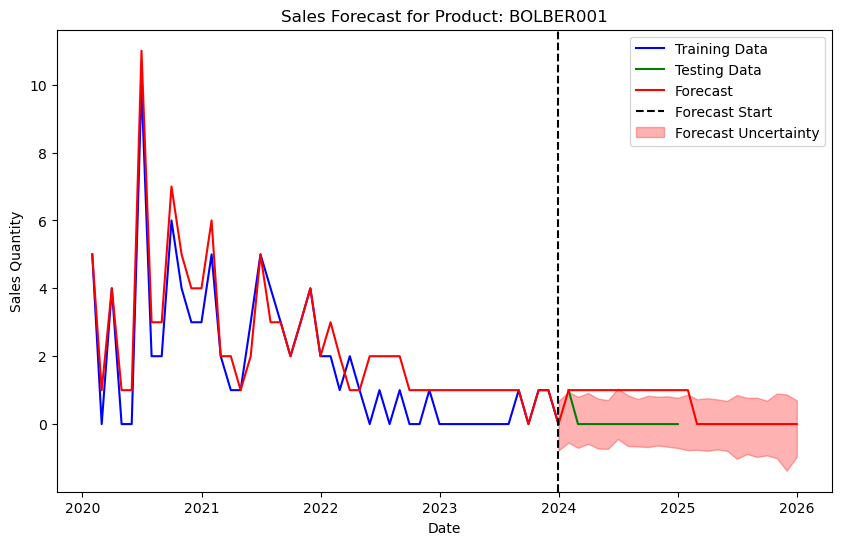

Forecasting for Item: BOLBER002
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 5.0}, Best RMSE: 0.6450495799486998
MAE: 0.16666666666666666, MSE: 0.16666666666666666, RMSE: 0.408248290463863
Execution time: 9.51 seconds


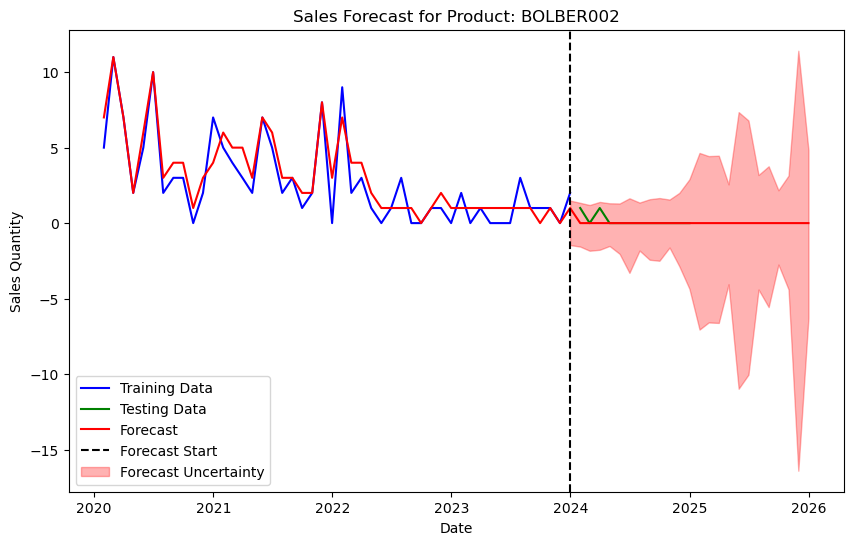

Forecasting for Item: BOLBER003
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 1.0}, Best RMSE: 1.8986031063045208
MAE: 1.9166666666666667, MSE: 4.583333333333333, RMSE: 2.140872096444188
Execution time: 8.80 seconds


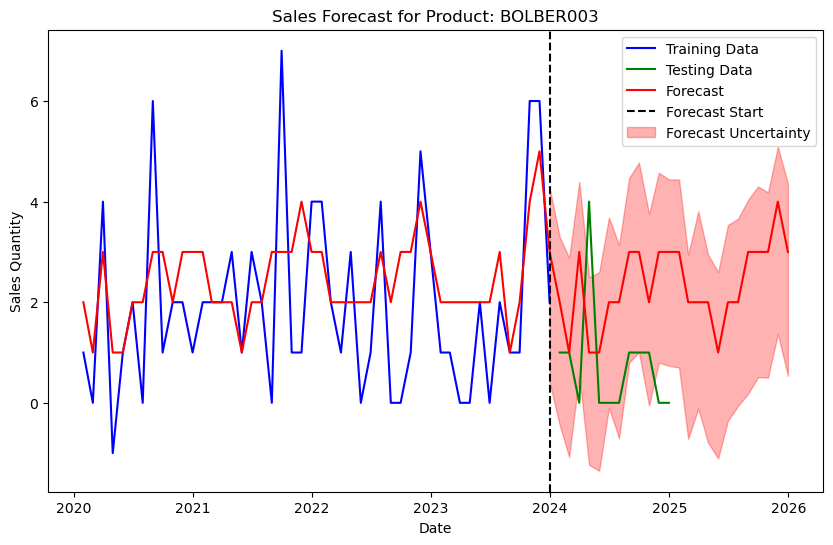

Forecasting for Item: BOLBER005
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 10.0}, Best RMSE: 0.44263200033584726
MAE: 0.75, MSE: 0.75, RMSE: 0.8660254037844386
Execution time: 10.10 seconds


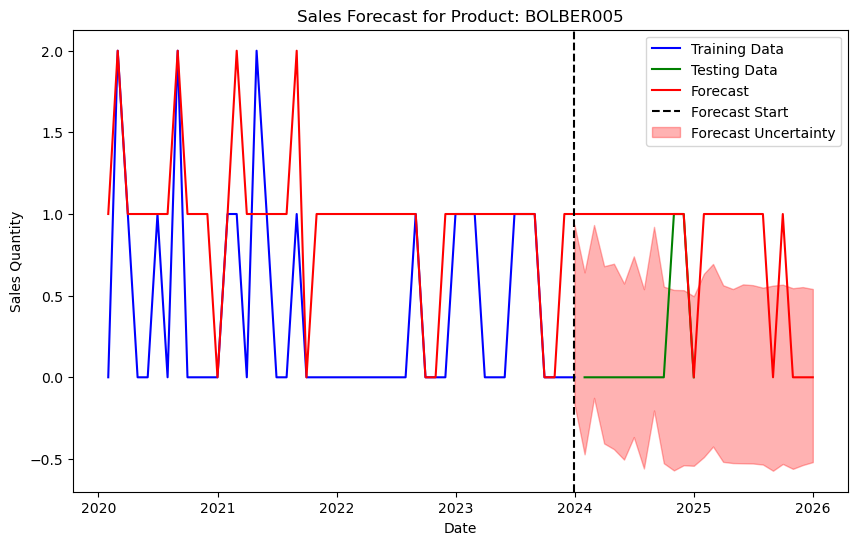

Forecasting for Item: BURBER001
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 10.0}, Best RMSE: 0.7403917426484379
MAE: 0.5, MSE: 0.5, RMSE: 0.7071067811865476
Execution time: 11.37 seconds


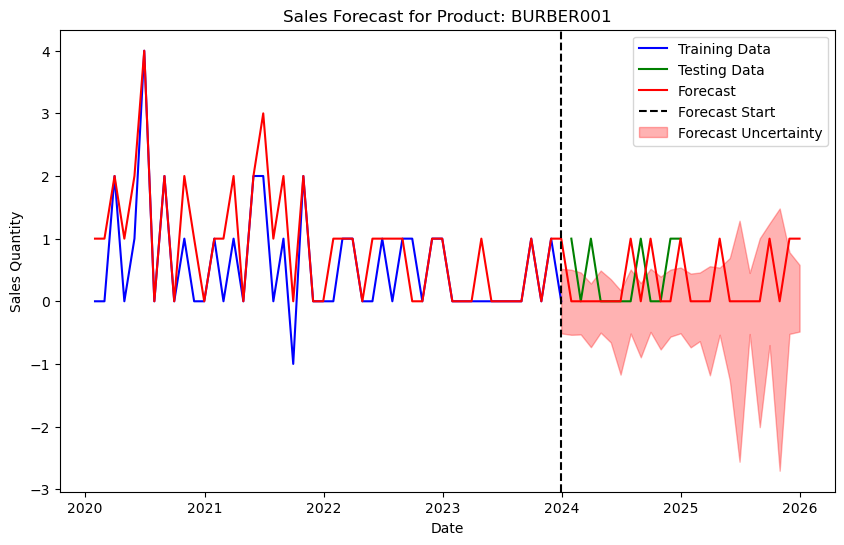

Forecasting for Item: BURBER002
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 10.0}, Best RMSE: 1.6105338872303188
MAE: 1.1666666666666667, MSE: 2.3333333333333335, RMSE: 1.5275252316519468
Execution time: 8.20 seconds


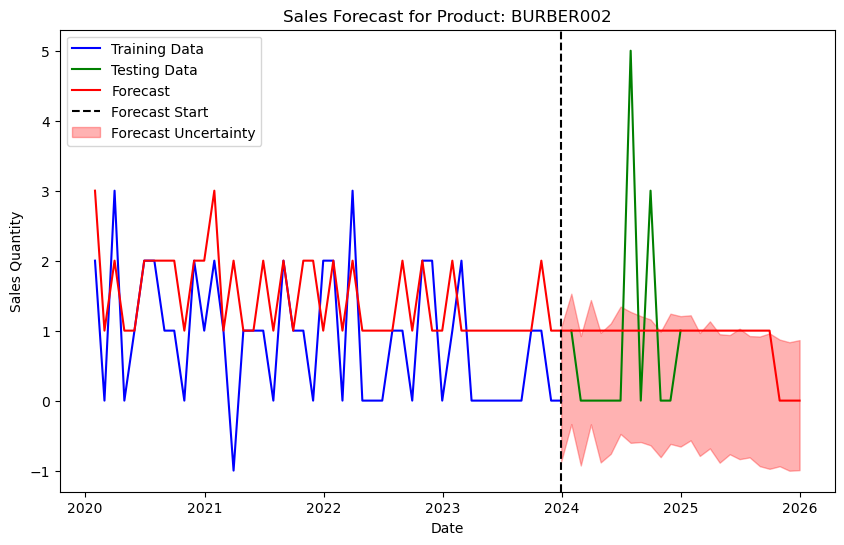

Forecasting for Item: BURBER003
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 1.0}, Best RMSE: 0.8595281263264559
MAE: 0.75, MSE: 0.75, RMSE: 0.8660254037844386
Execution time: 11.10 seconds


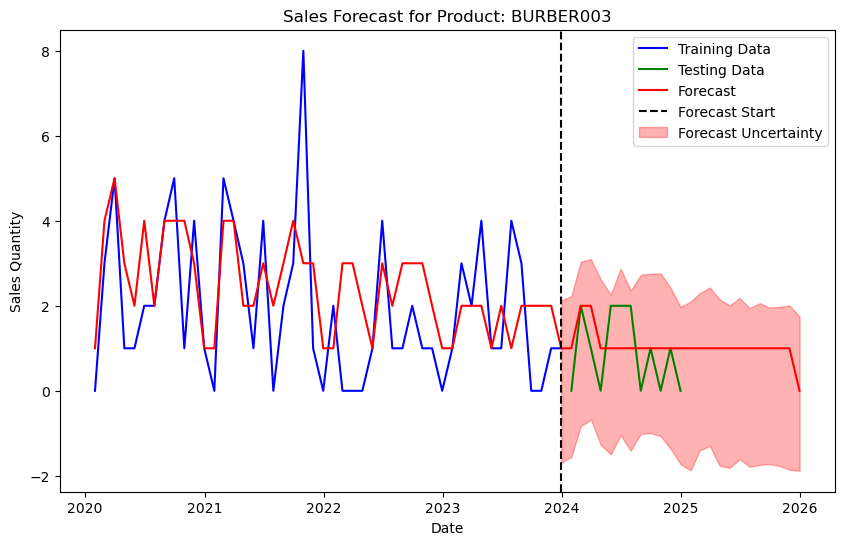

Forecasting for Item: BURBER004
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 5.0}, Best RMSE: 1.6591808995582427
MAE: 1.3333333333333333, MSE: 3.1666666666666665, RMSE: 1.7795130420052185
Execution time: 11.21 seconds


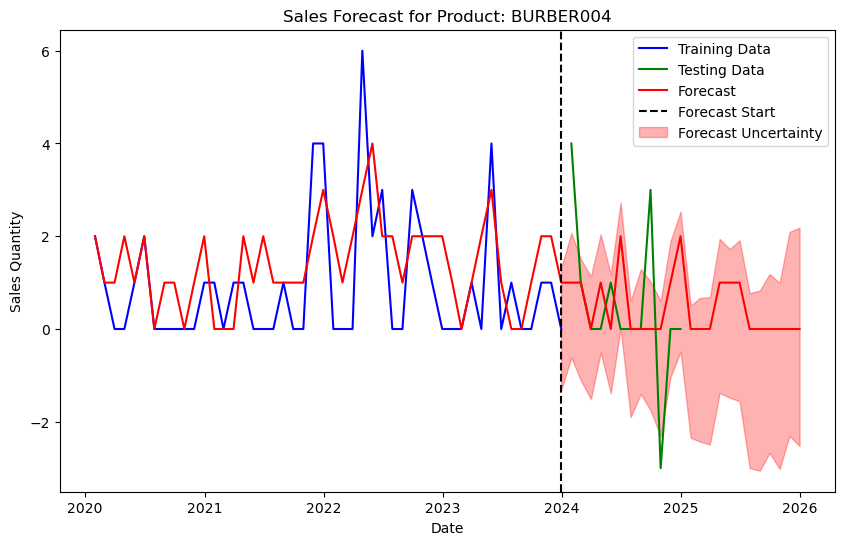

Forecasting for Item: BURBER007
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 1.0}, Best RMSE: 0.545050103634389
MAE: 0.75, MSE: 0.75, RMSE: 0.8660254037844386
Execution time: 12.15 seconds


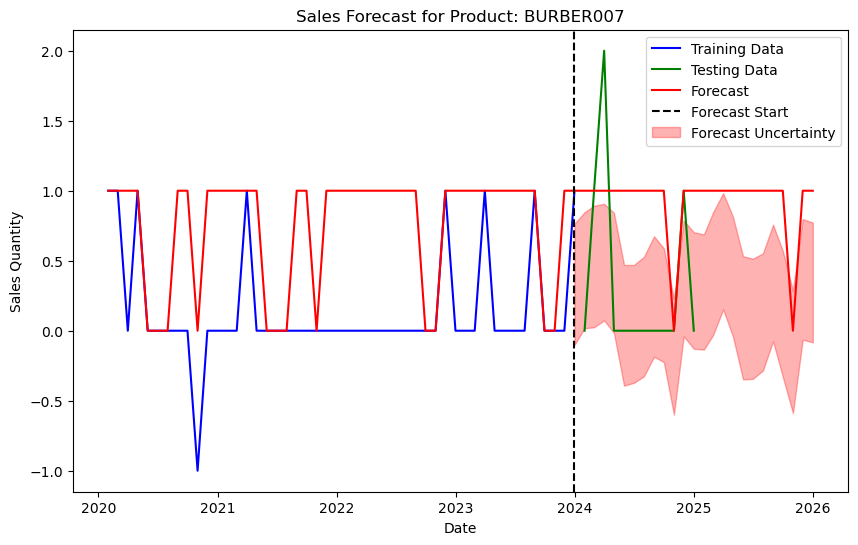

Forecasting for Item: COFBER001
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 1.0}, Best RMSE: 7.807261308321543
MAE: 6.666666666666667, MSE: 62.166666666666664, RMSE: 7.884584115009914
Execution time: 11.34 seconds


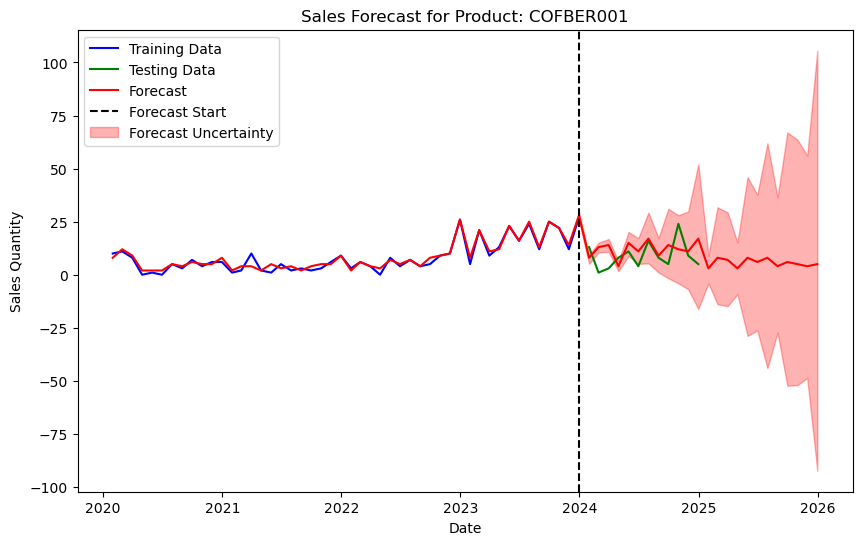

Forecasting for Item: COKBER001
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 1.0}, Best RMSE: 7.663524077320349
MAE: 7.0, MSE: 61.666666666666664, RMSE: 7.852812659593164
Execution time: 10.40 seconds


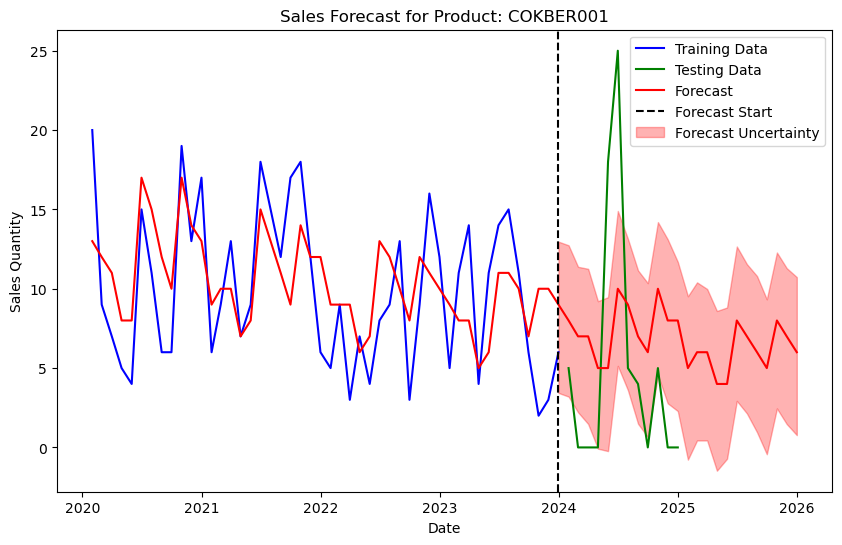

Forecasting for Item: FRYBER002
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 1.0}, Best RMSE: 4.911715580462682
MAE: 4.583333333333333, MSE: 27.916666666666668, RMSE: 5.283622494715786
Execution time: 9.81 seconds


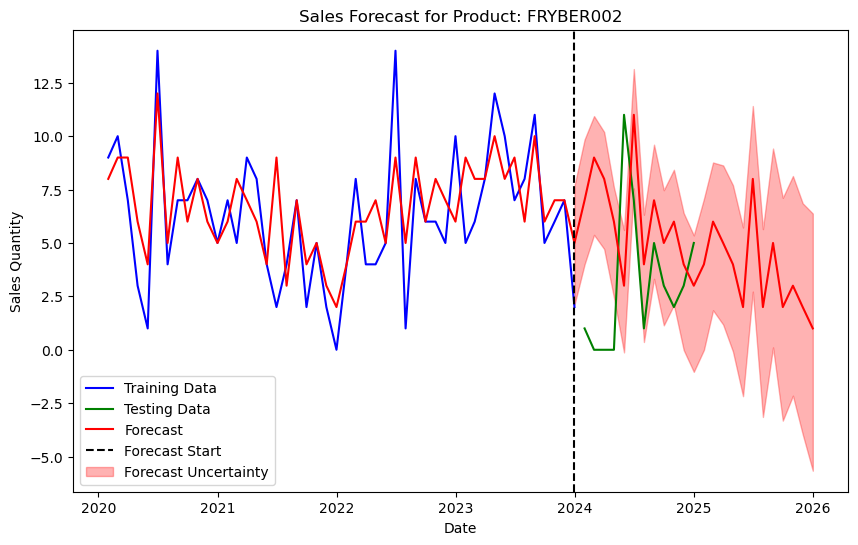

Forecasting for Item: FRYBER003
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 10.0}, Best RMSE: 4.393758615319679
MAE: 3.6666666666666665, MSE: 19.0, RMSE: 4.358898943540674
Execution time: 10.39 seconds


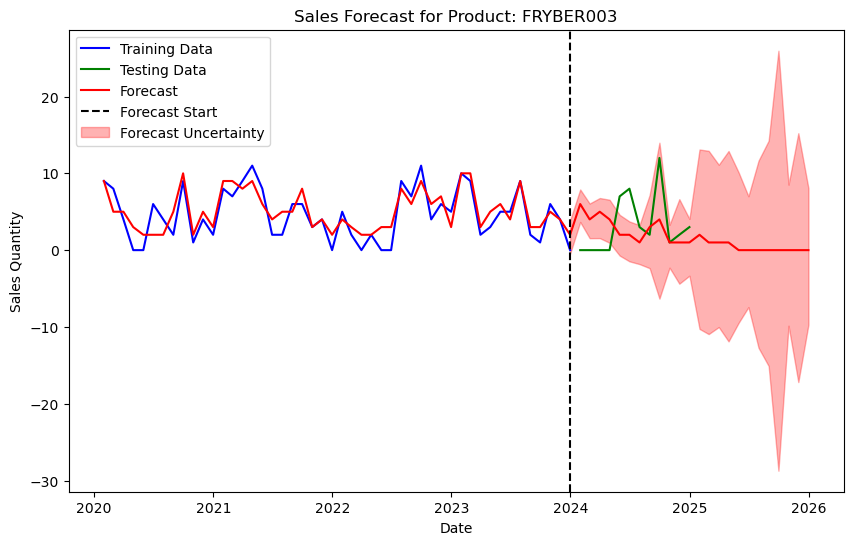

Forecasting for Item: FRYBER005
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 1.0}, Best RMSE: 8.32058526387974
MAE: 7.666666666666667, MSE: 74.16666666666667, RMSE: 8.612007121842542
Execution time: 11.43 seconds


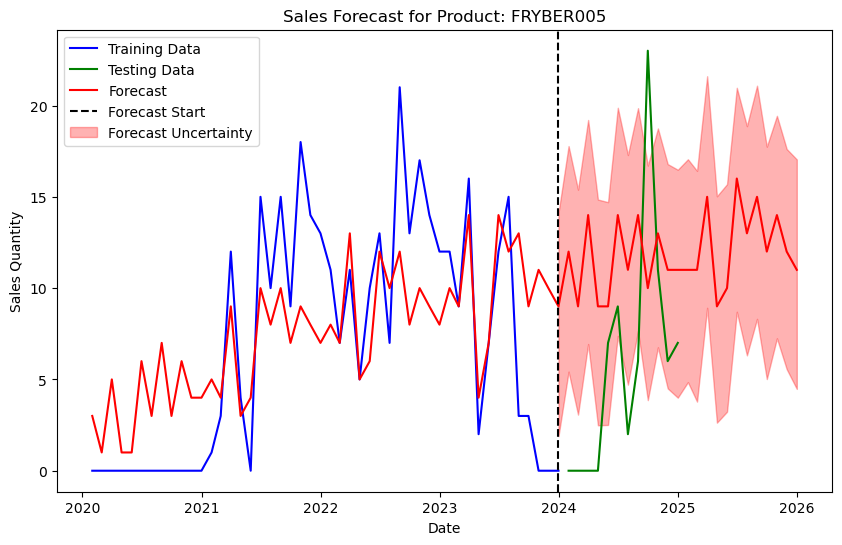

Forecasting for Item: GRLBER003
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 1.0}, Best RMSE: 5.354105579487398
MAE: 4.5, MSE: 29.0, RMSE: 5.385164807134504
Execution time: 10.24 seconds


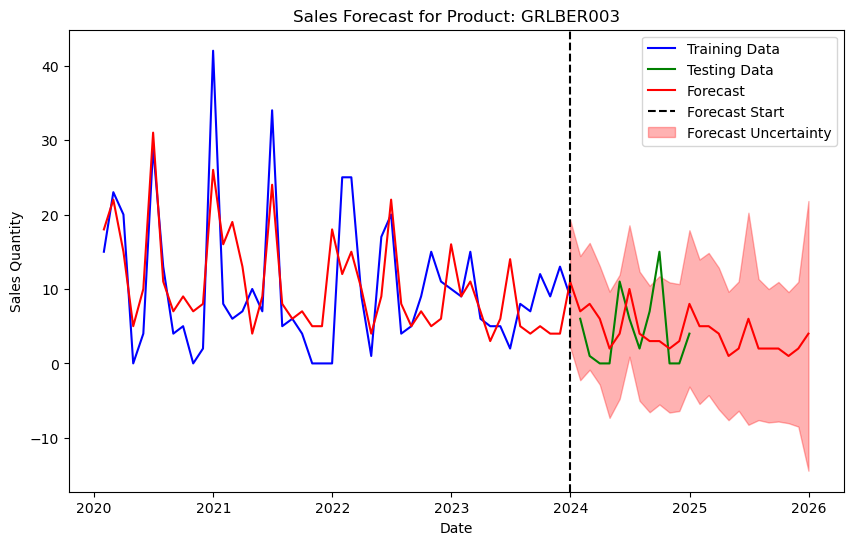

Forecasting for Item: GRLBER004
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 1.0}, Best RMSE: 3.606668145283741
MAE: 3.4166666666666665, MSE: 14.916666666666666, RMSE: 3.8622100754188224
Execution time: 9.33 seconds


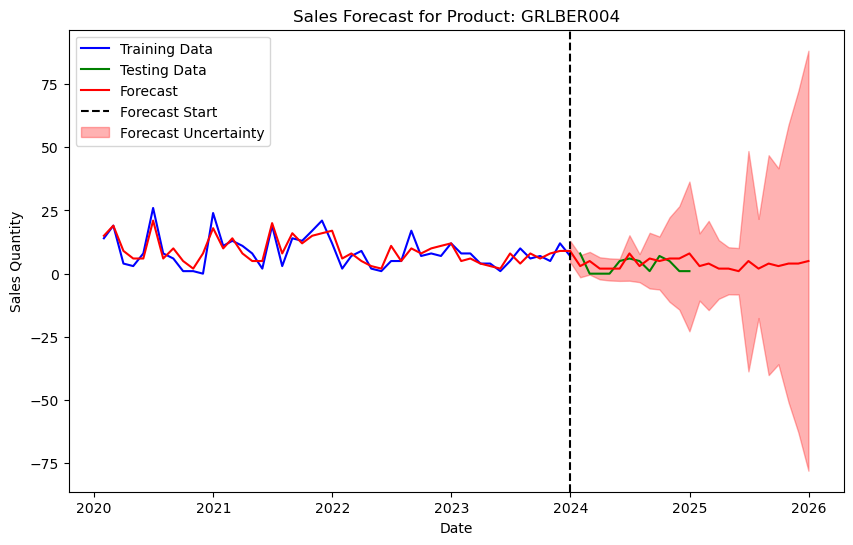

Forecasting for Item: GRLBER009
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 5.0}, Best RMSE: 1.413440698911747
MAE: 1.4166666666666667, MSE: 2.75, RMSE: 1.6583123951777
Execution time: 10.71 seconds


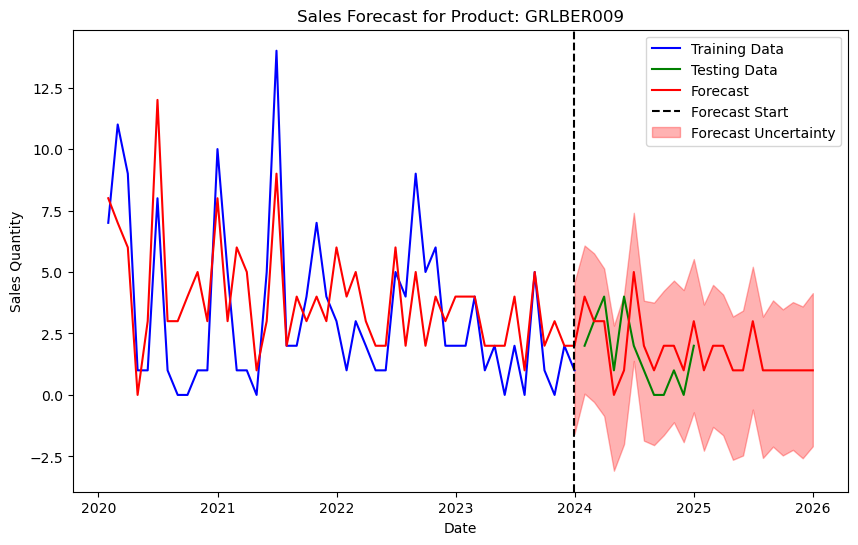

Forecasting for Item: GRLBER010
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 1.0}, Best RMSE: 0.7662462657926935
MAE: 0.25, MSE: 0.25, RMSE: 0.5
Execution time: 11.48 seconds


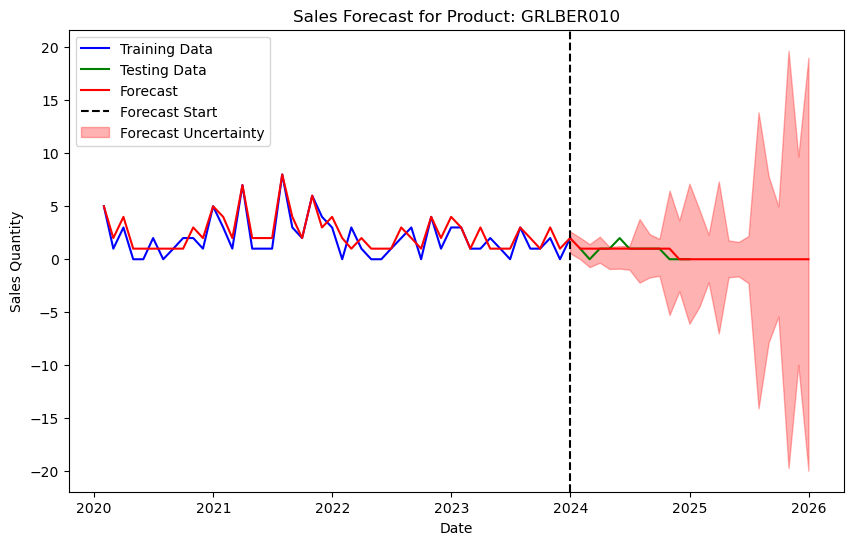

Forecasting for Item: GRLBER011
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 10.0}, Best RMSE: 3.796976388461457
MAE: 3.25, MSE: 15.416666666666666, RMSE: 3.926406329796582
Execution time: 11.60 seconds


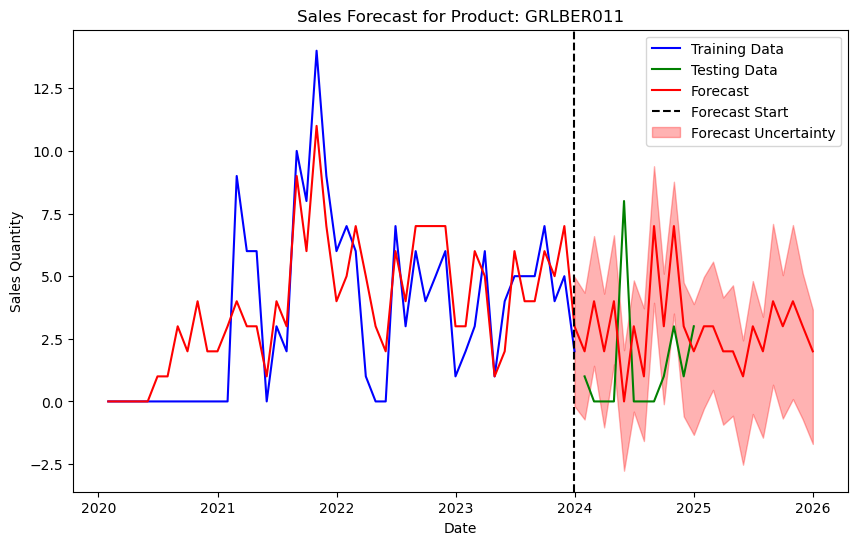

Forecasting for Item: GRLBER012
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 1.0}, Best RMSE: 1.0008715128749444
MAE: 0.25, MSE: 0.25, RMSE: 0.5
Execution time: 13.05 seconds


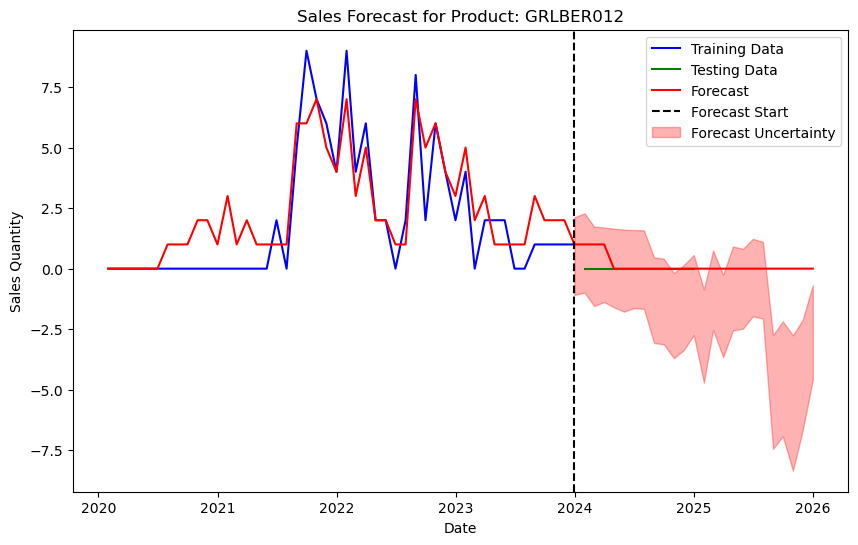

Forecasting for Item: GRLBER015
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 1.0}, Best RMSE: 3.0416850802116984
MAE: 2.5, MSE: 9.833333333333334, RMSE: 3.13581462037113
Execution time: 10.99 seconds


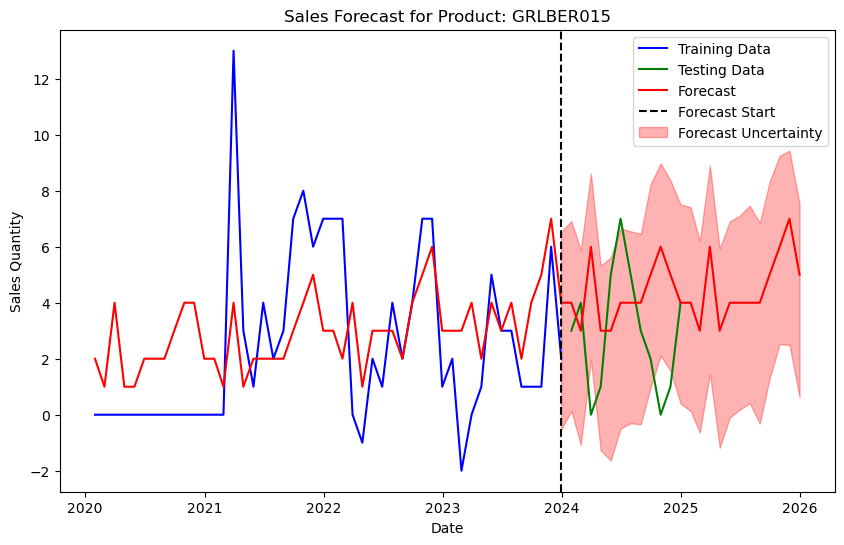

Forecasting for Item: GRLBER019
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 1.0}, Best RMSE: 0.9386704468368021
MAE: 1.0, MSE: 1.1666666666666667, RMSE: 1.0801234497346435
Execution time: 85.00 seconds


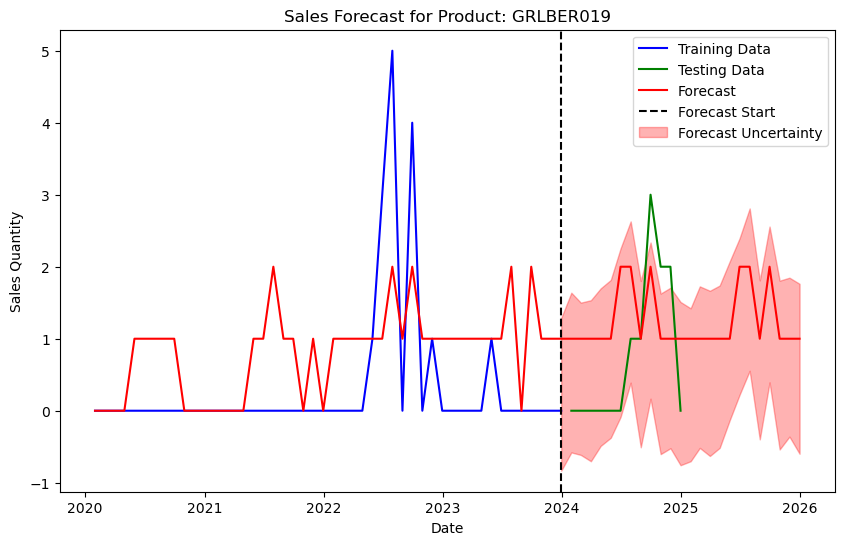

Forecasting for Item: GRLBER020
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 10.0}, Best RMSE: 1.4831363214745568
MAE: 1.4166666666666667, MSE: 3.0833333333333335, RMSE: 1.7559422921421233
Execution time: 137.36 seconds


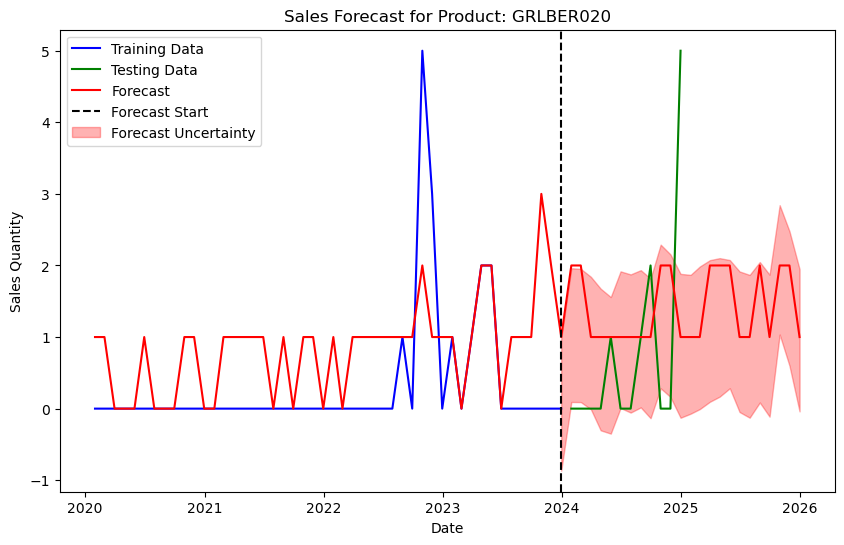

Forecasting for Item: HEABER001
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 1.0}, Best RMSE: 3.731859708095616
MAE: 3.1666666666666665, MSE: 15.5, RMSE: 3.9370039370059056
Execution time: 10.57 seconds


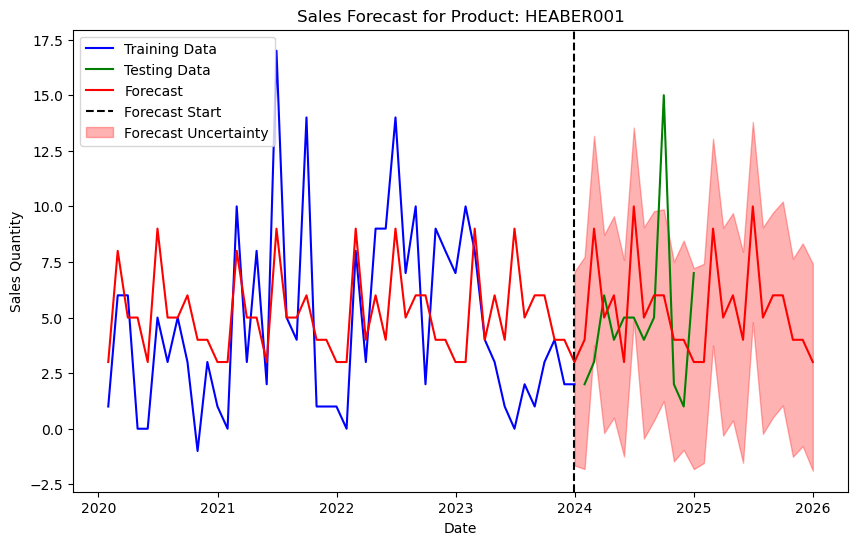

Forecasting for Item: HOTBER001
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 1.0}, Best RMSE: 1.5900237329375646
MAE: 1.8333333333333333, MSE: 3.8333333333333335, RMSE: 1.9578900207451218
Execution time: 11.14 seconds


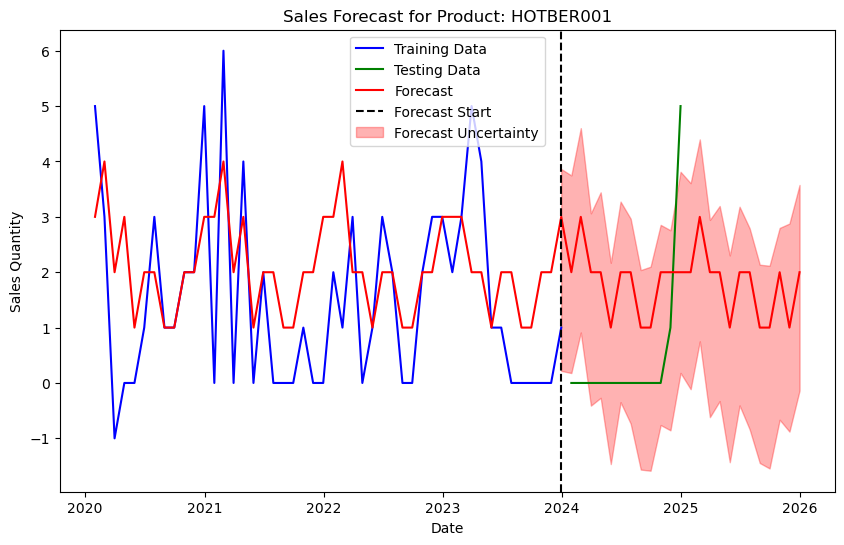

Forecasting for Item: HOTBER002
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 5.0}, Best RMSE: 1.7670084196614881
MAE: 1.5, MSE: 2.6666666666666665, RMSE: 1.632993161855452
Execution time: 12.19 seconds


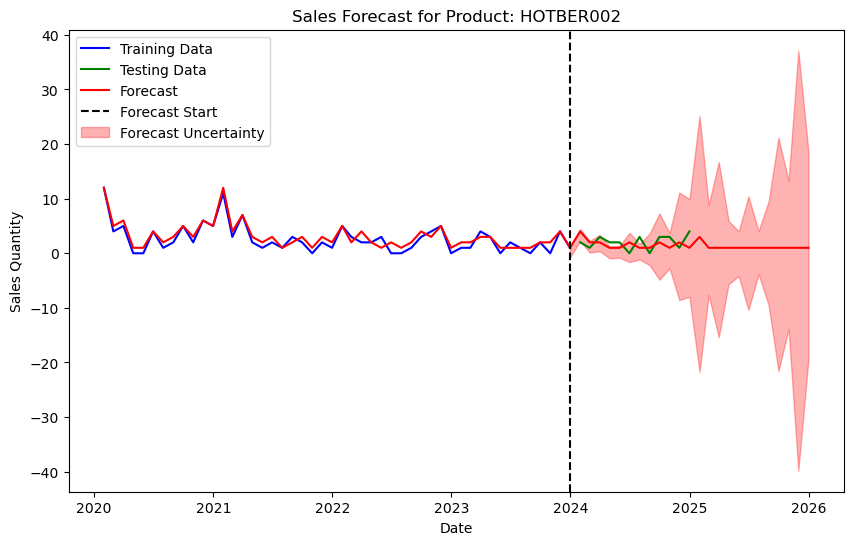

Forecasting for Item: HOTBER003
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 10.0}, Best RMSE: 1.4076881955836802
MAE: 1.0, MSE: 1.3333333333333333, RMSE: 1.1547005383792515
Execution time: 10.73 seconds


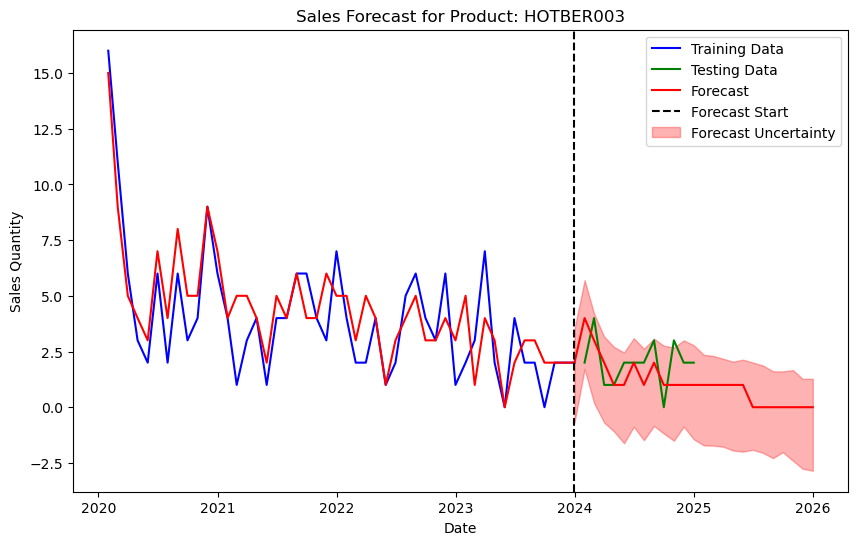

Forecasting for Item: ICMBER002
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 1.0}, Best RMSE: 0.5768013801043659
MAE: 0.75, MSE: 0.75, RMSE: 0.8660254037844386
Execution time: 233.26 seconds


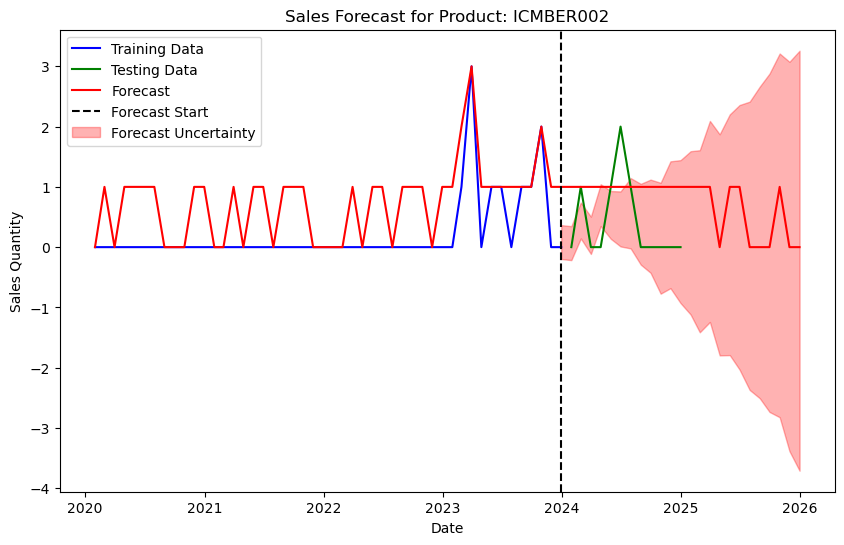

Forecasting for Item: ICMBER003
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 1.0}, Best RMSE: 1.1801353081854622
MAE: 0.9166666666666666, MSE: 1.4166666666666667, RMSE: 1.1902380714238083
Execution time: 221.54 seconds


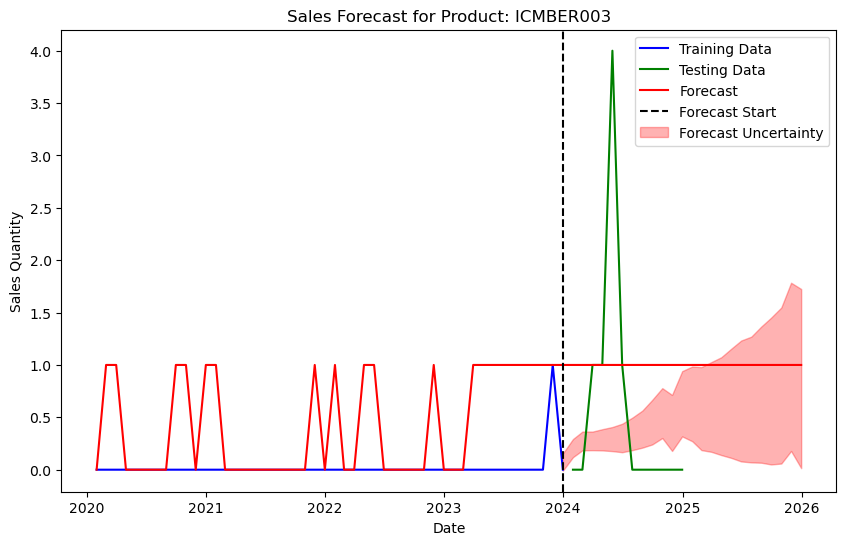

Forecasting for Item: MIXBER001
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 5.0}, Best RMSE: 3.163943998764288
MAE: 2.1666666666666665, MSE: 8.333333333333334, RMSE: 2.886751345948129
Execution time: 11.34 seconds


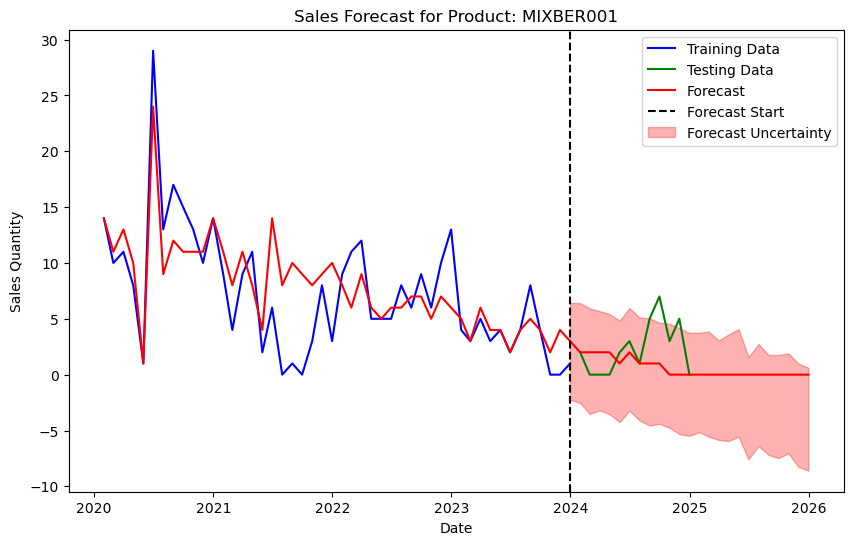

Forecasting for Item: MIXBER003
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 1.0}, Best RMSE: 2.269088995331207
MAE: 1.75, MSE: 4.75, RMSE: 2.179449471770337
Execution time: 10.41 seconds


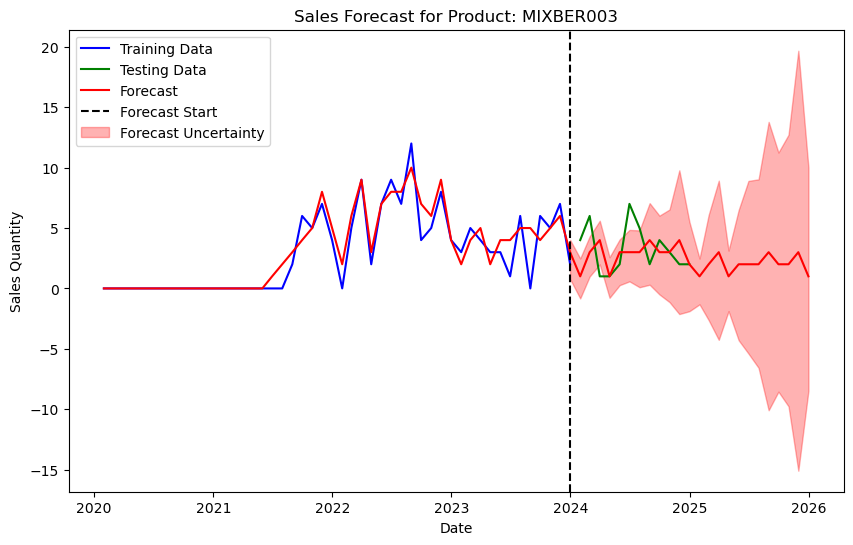

Forecasting for Item: OVEBER002
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 1.0}, Best RMSE: 3.1205748088350695
MAE: 3.1666666666666665, MSE: 12.333333333333334, RMSE: 3.5118845842842465
Execution time: 9.87 seconds


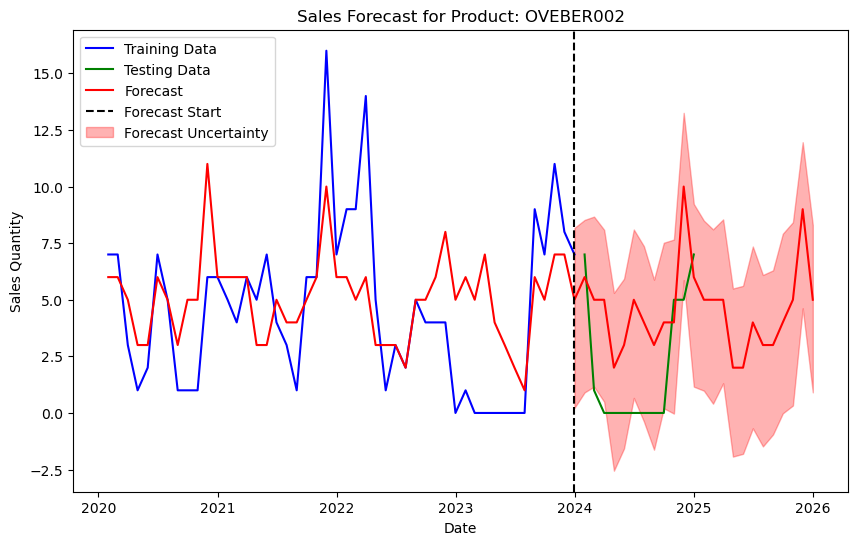

Forecasting for Item: OVEBER005
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 1.0}, Best RMSE: 0.8604294321925648
MAE: 0.75, MSE: 1.0833333333333333, RMSE: 1.0408329997330663
Execution time: 12.17 seconds


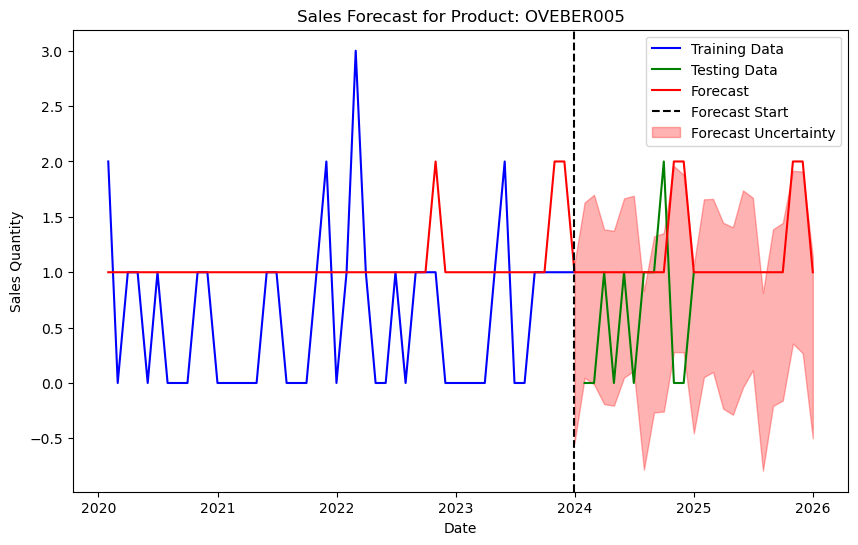

Forecasting for Item: OVEBER006
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 1.0}, Best RMSE: 1.0739210291796282
MAE: 0.9166666666666666, MSE: 1.25, RMSE: 1.118033988749895
Execution time: 11.54 seconds


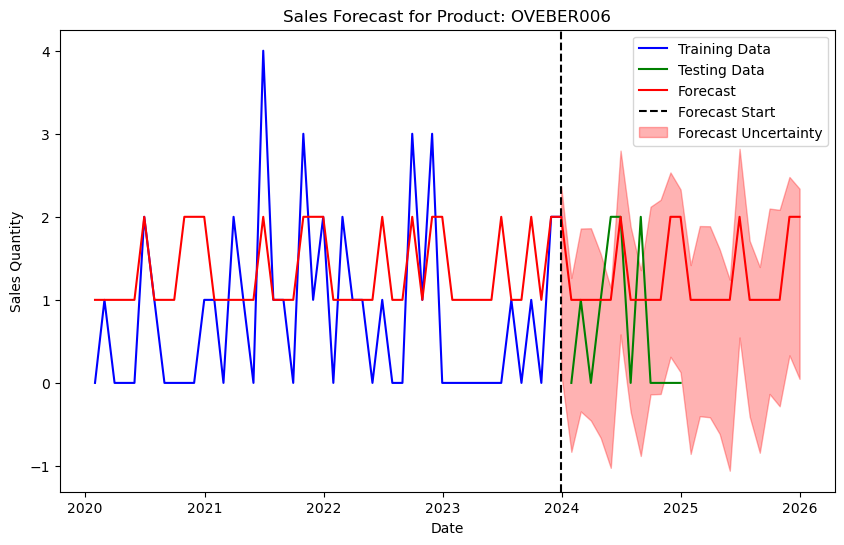

Forecasting for Item: OVEBER011
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 1.0}, Best RMSE: 7.444925324253138
MAE: 6.75, MSE: 60.583333333333336, RMSE: 7.783529619223745
Execution time: 134.38 seconds


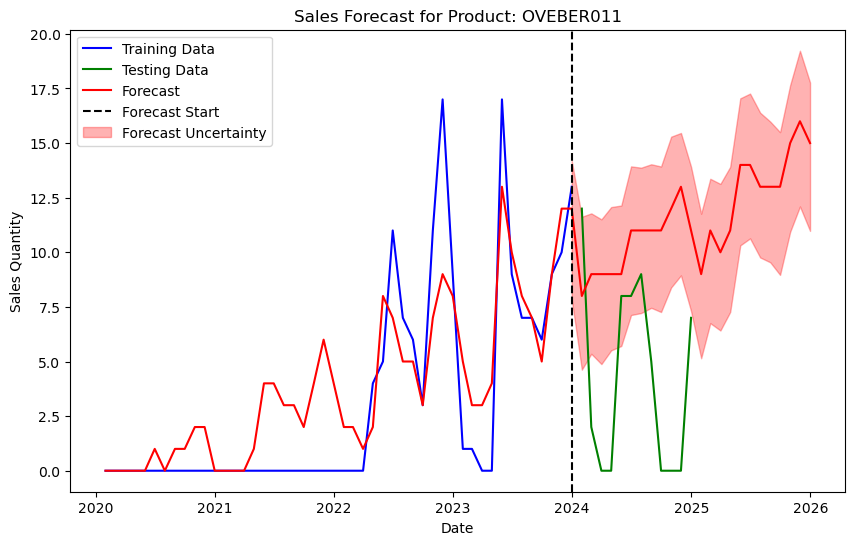

Forecasting for Item: OVEBER012
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 1.0}, Best RMSE: 4.285733705553142
MAE: 4.5, MSE: 23.666666666666668, RMSE: 4.864839839775475
Execution time: 61.32 seconds


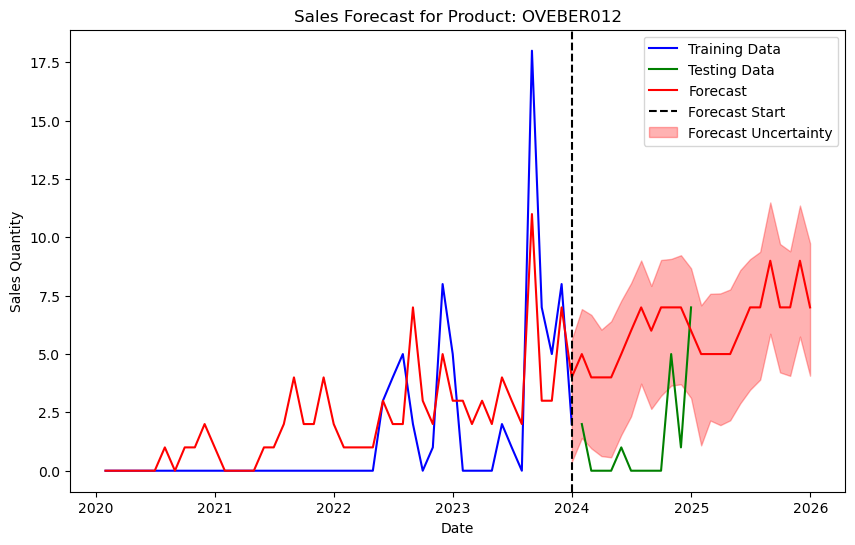

Forecasting for Item: OVEBER013
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 5.0}, Best RMSE: 3.2206324775184876
MAE: 2.8333333333333335, MSE: 11.333333333333334, RMSE: 3.366501646120693
Execution time: 60.99 seconds


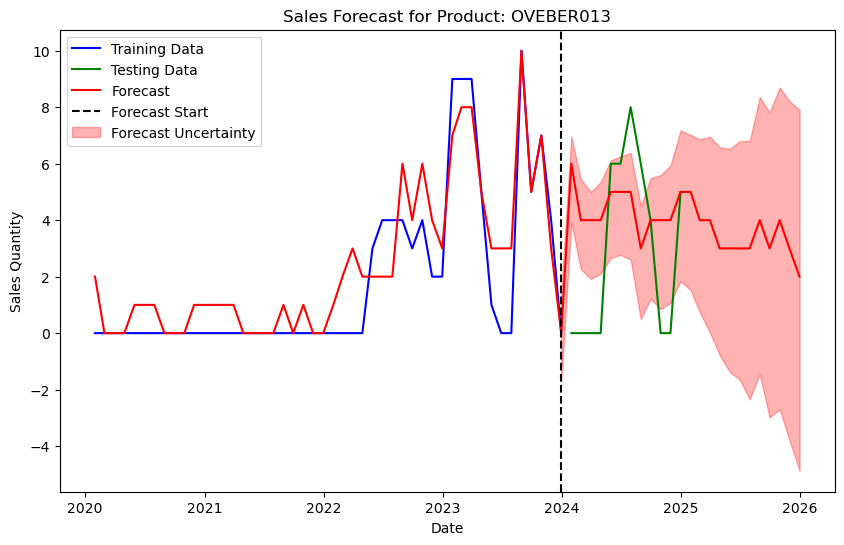

Forecasting for Item: OVEBER014
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 1.0}, Best RMSE: 1.277301810220714
MAE: 1.0833333333333333, MSE: 2.25, RMSE: 1.5
Execution time: 62.40 seconds


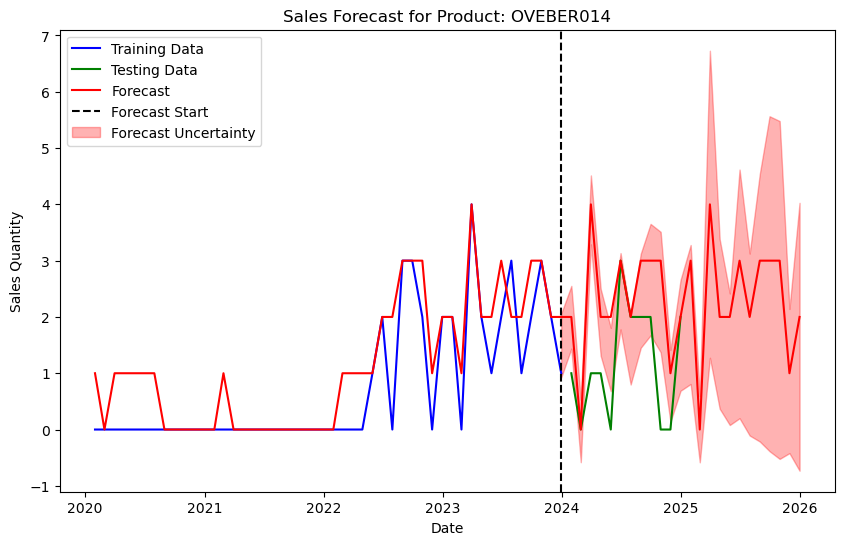

Forecasting for Item: OVEBER015
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 5.0}, Best RMSE: 0.7703823347174753
MAE: 0.6666666666666666, MSE: 0.8333333333333334, RMSE: 0.9128709291752769
Execution time: 143.56 seconds


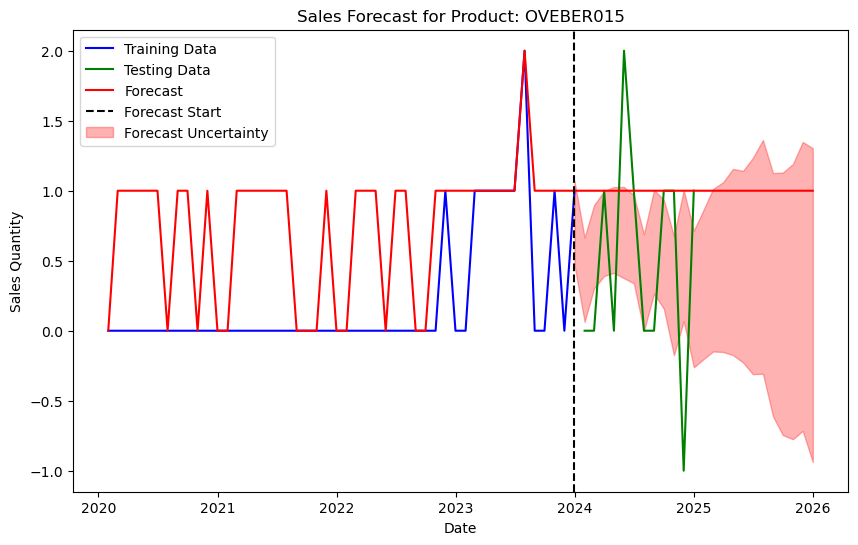

Forecasting for Item: OVEBER016
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 1.0}, Best RMSE: 1.8007164333755794
MAE: 1.1666666666666667, MSE: 3.1666666666666665, RMSE: 1.7795130420052185
Execution time: 109.95 seconds


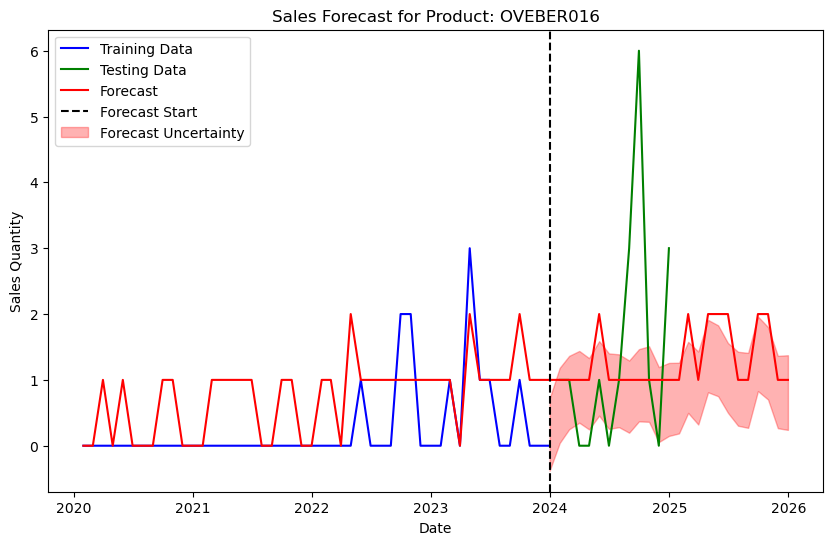

Forecasting for Item: OVEBER017
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 1.0}, Best RMSE: 1.3947347788084998
MAE: 1.0, MSE: 1.8333333333333333, RMSE: 1.35400640077266
Execution time: 58.98 seconds


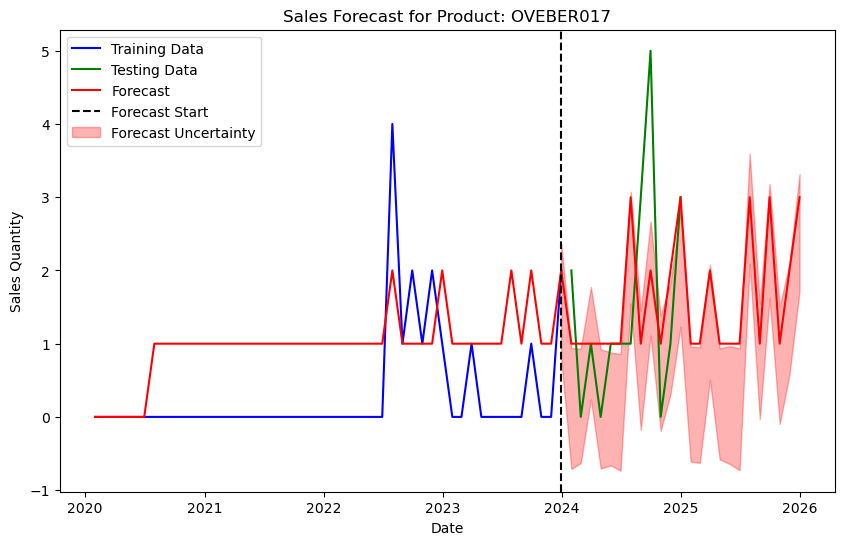

Forecasting for Item: POPBER001
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 1.0}, Best RMSE: 3.795456393776443
MAE: 3.8333333333333335, MSE: 17.666666666666668, RMSE: 4.203173404306164
Execution time: 10.37 seconds


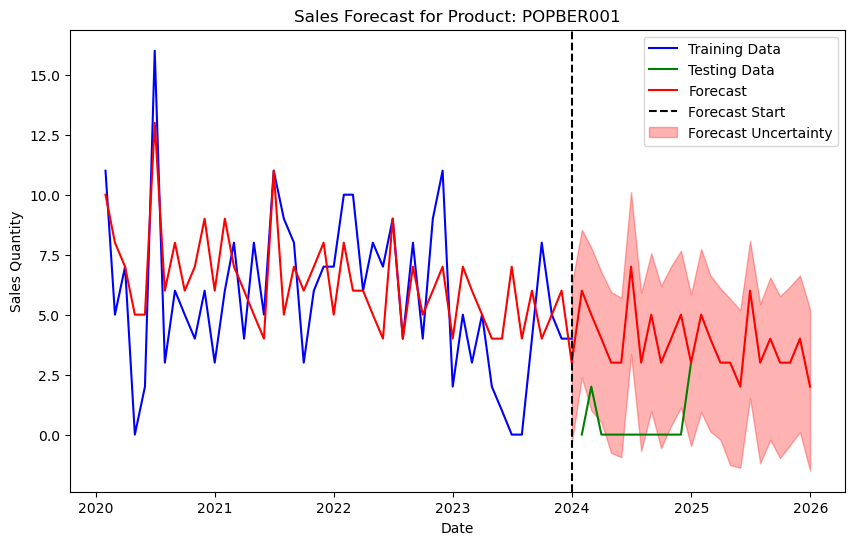

Forecasting for Item: SOPBER001
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 5.0}, Best RMSE: 2.972733532436018
MAE: 2.0833333333333335, MSE: 9.75, RMSE: 3.122498999199199
Execution time: 10.75 seconds


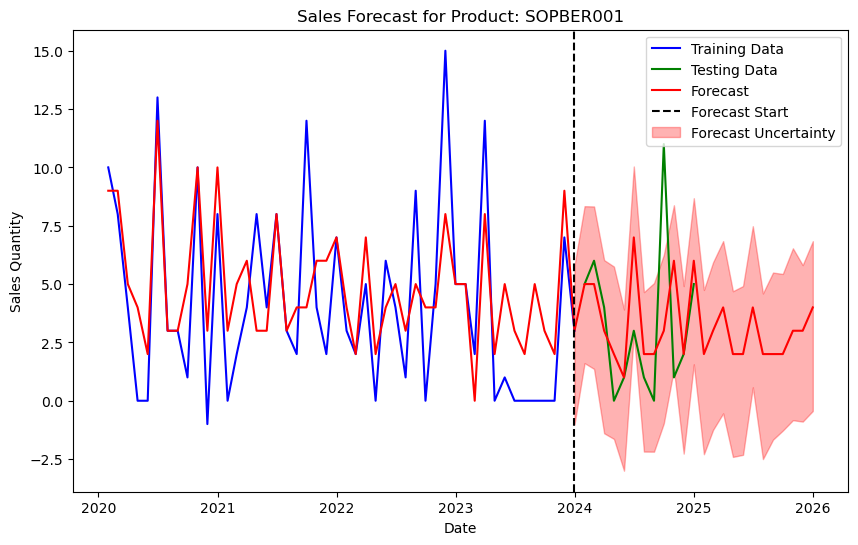

Forecasting for Item: TROBER001
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 1.0}, Best RMSE: 1.6202782796712067
MAE: 1.9166666666666667, MSE: 4.583333333333333, RMSE: 2.140872096444188
Execution time: 9.96 seconds


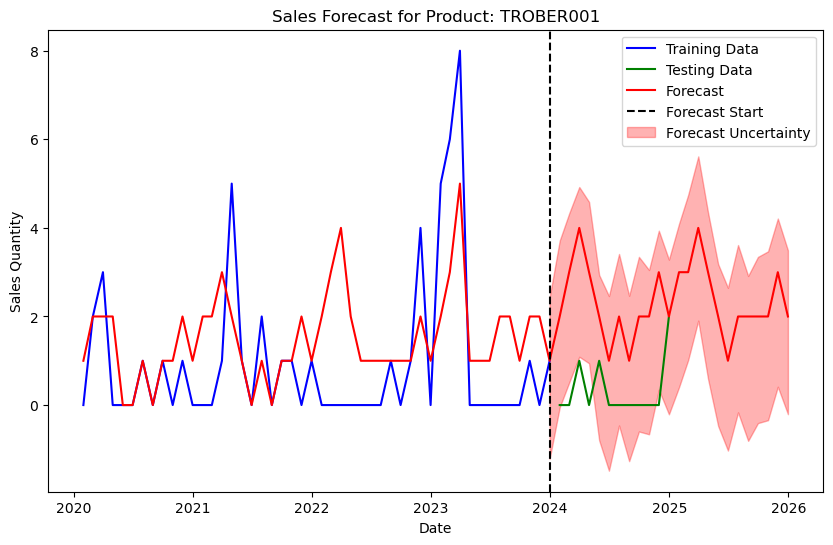

Forecasting for Item: TROBER003
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 1.0}, Best RMSE: 1.2419913777740195
MAE: 1.5, MSE: 3.0, RMSE: 1.7320508075688772
Execution time: 60.10 seconds


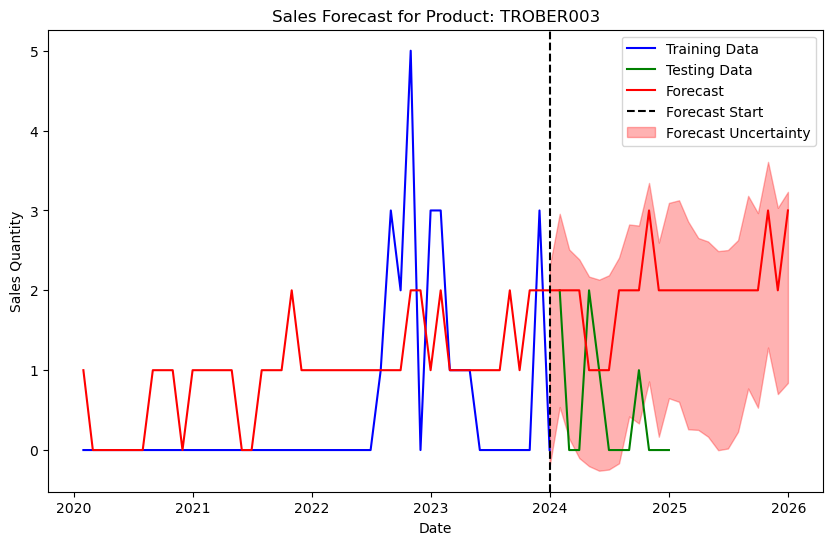

Forecasting for Item: WARBER001
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 1.0}, Best RMSE: 0.3504804877414659
MAE: 0.25, MSE: 0.25, RMSE: 0.5
Execution time: 10.08 seconds


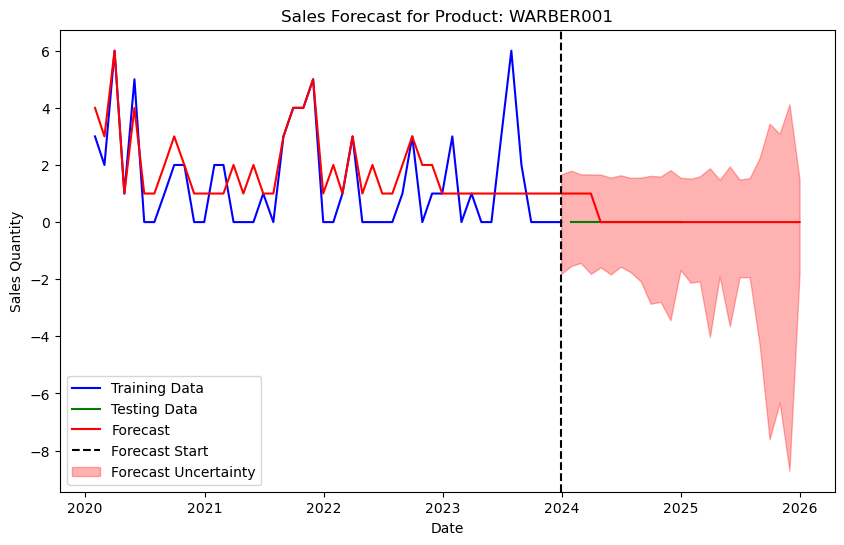

Forecasting for Item: WARBER002
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 1.0}, Best RMSE: 0.845666408696095
MAE: 1.3333333333333333, MSE: 2.0, RMSE: 1.4142135623730951
Execution time: 8.51 seconds


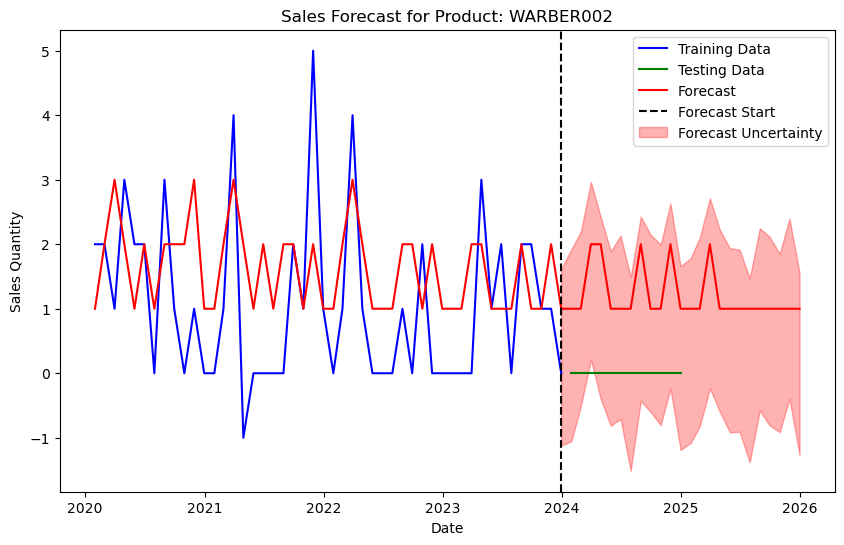

Forecasting for Item: WARBER003
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 5.0}, Best RMSE: 0.628733567979419
MAE: 0.75, MSE: 0.75, RMSE: 0.8660254037844386
Execution time: 11.09 seconds


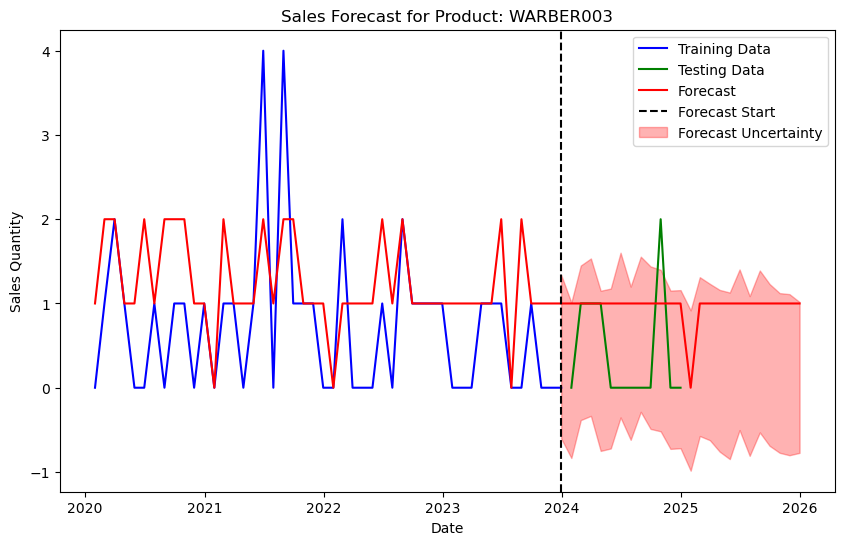

Forecasting for Item: WARBER004
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 1.0}, Best RMSE: 0.8595210446390371
MAE: 1.0833333333333333, MSE: 1.5833333333333333, RMSE: 1.2583057392117916
Execution time: 10.77 seconds


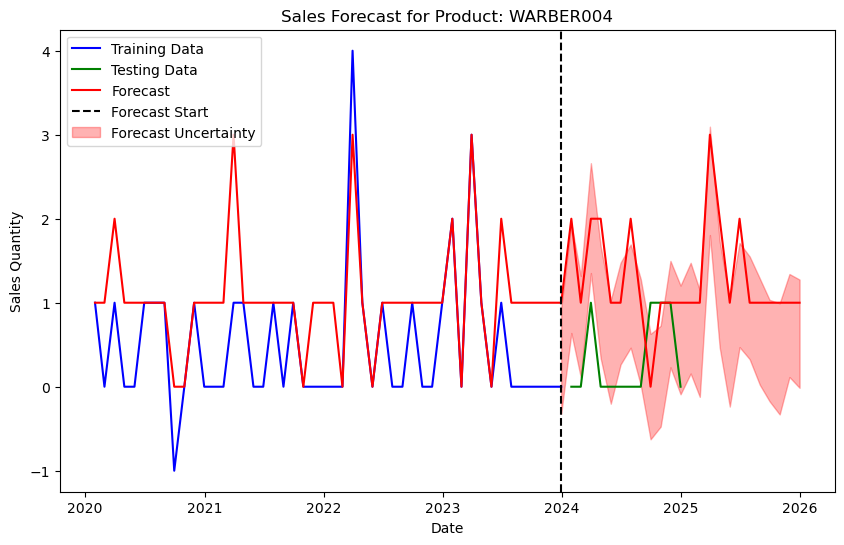

Forecasting for Item: WARBER005
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 1.0}, Best RMSE: 0.5954284836017044
MAE: 0.6666666666666666, MSE: 0.6666666666666666, RMSE: 0.816496580927726
Execution time: 10.16 seconds


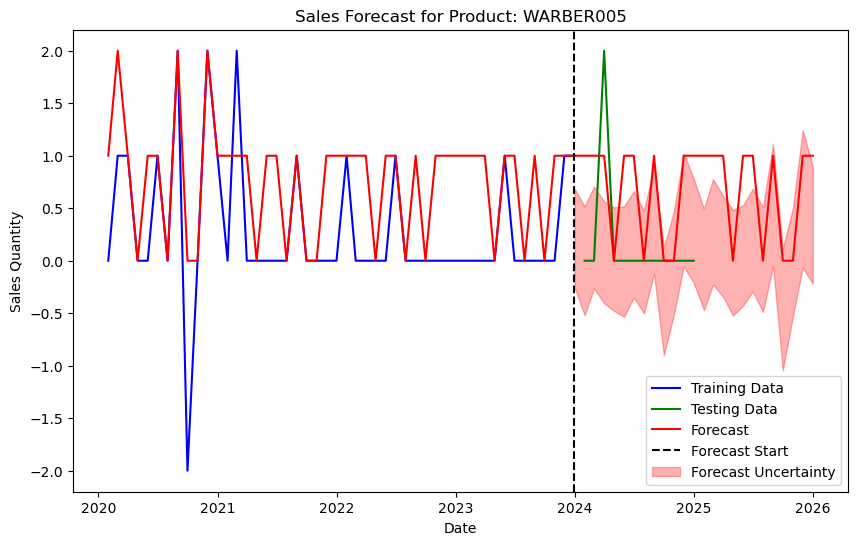

Forecasting for Item: WARBER006
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 1.0}, Best RMSE: 0.5187803819277836
MAE: 0.4166666666666667, MSE: 0.4166666666666667, RMSE: 0.6454972243679028
Execution time: 12.03 seconds


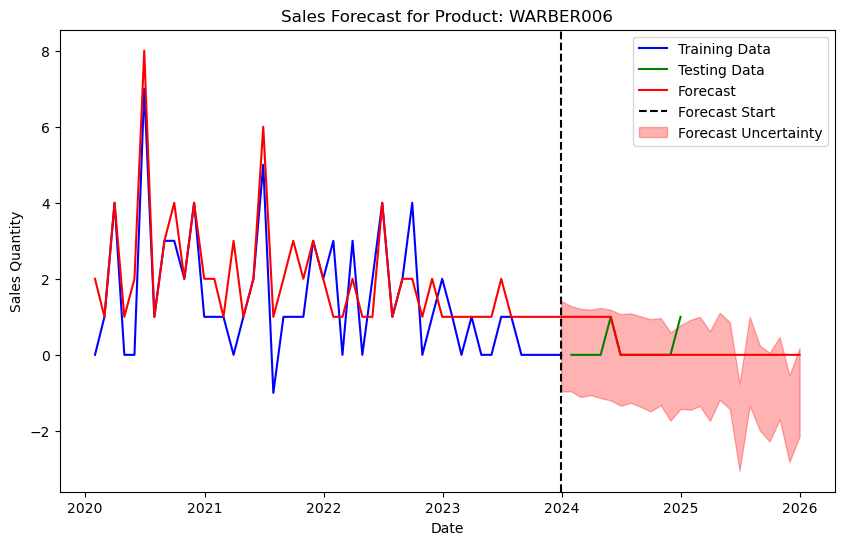

Forecasting for Item: WARBER009
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 1.0}, Best RMSE: 1.395933982678199
MAE: 1.0, MSE: 1.6666666666666667, RMSE: 1.2909944487358056
Execution time: 10.19 seconds


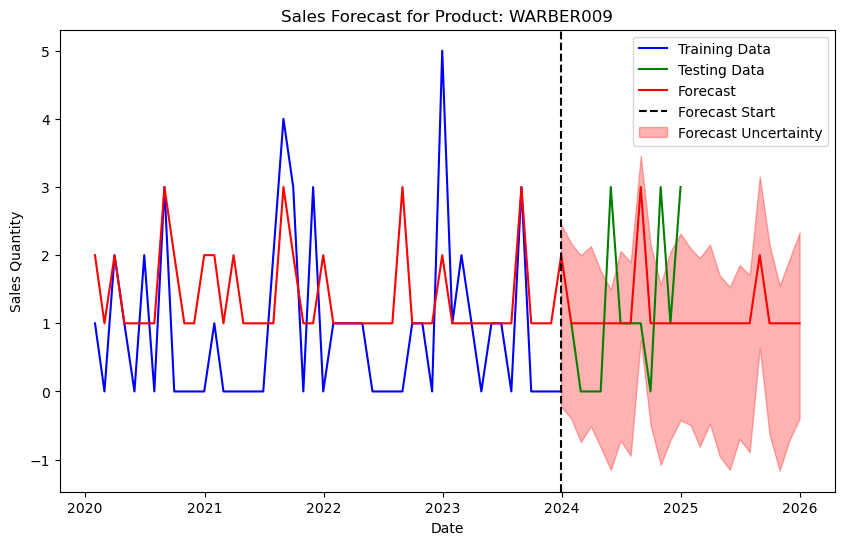

Forecasting for Item: WARBER010
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 1.0}, Best RMSE: 1.667693899639785
MAE: 1.25, MSE: 2.4166666666666665, RMSE: 1.5545631755148024
Execution time: 10.15 seconds


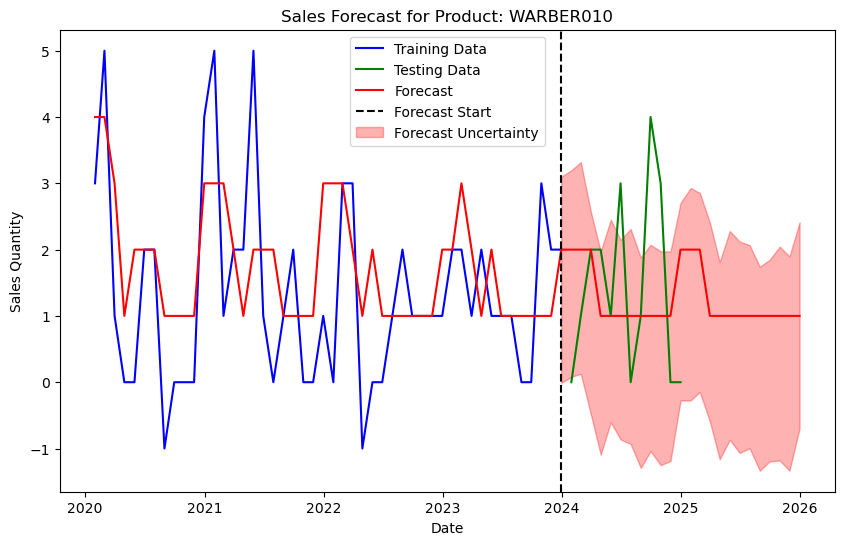

Forecasting for Item: WARBER011
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 1.0}, Best RMSE: 1.435256815789318
MAE: 1.0833333333333333, MSE: 1.9166666666666667, RMSE: 1.3844373104863459
Execution time: 10.33 seconds


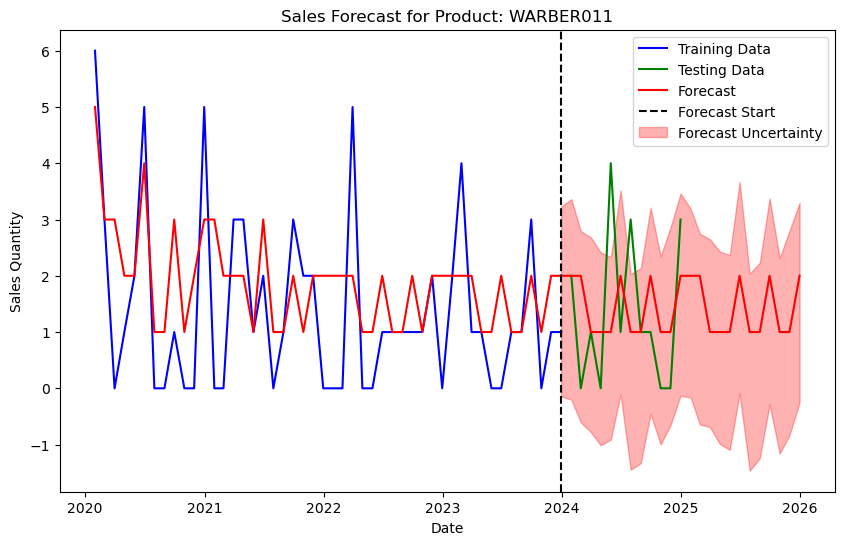

Forecasting for Item: WARBER012
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 1.0}, Best RMSE: 0.594634936813192
MAE: 0.3333333333333333, MSE: 0.3333333333333333, RMSE: 0.5773502691896257
Execution time: 11.46 seconds


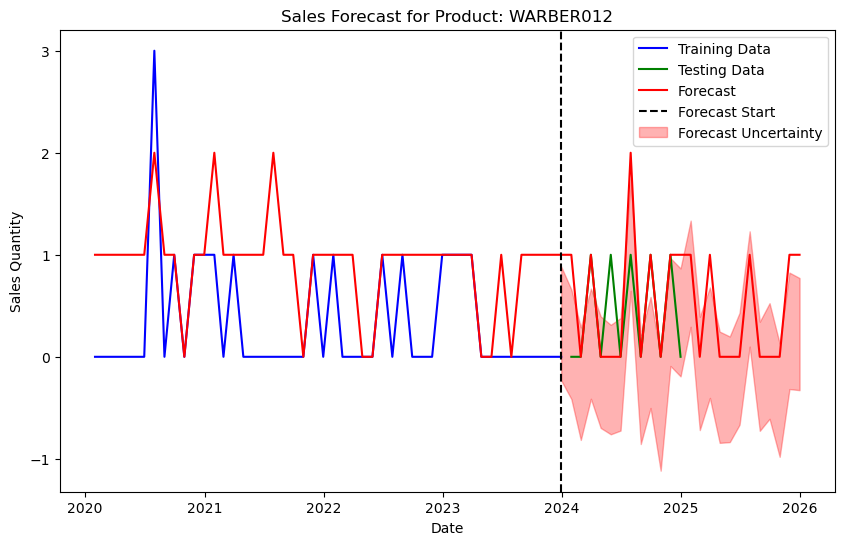

Forecasting for Item: WARBER013
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 1.0}, Best RMSE: 0.967224616893065
MAE: 0.8333333333333334, MSE: 1.0, RMSE: 1.0
Execution time: 12.33 seconds


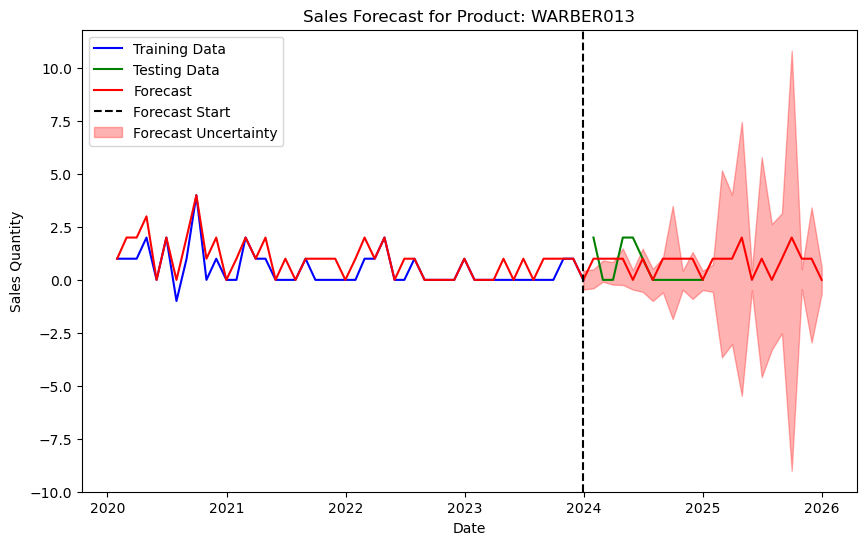

Forecasting for Item: WARBER015
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 5.0}, Best RMSE: 0.704205954813672
MAE: 0.75, MSE: 0.9166666666666666, RMSE: 0.9574271077563381
Execution time: 10.90 seconds


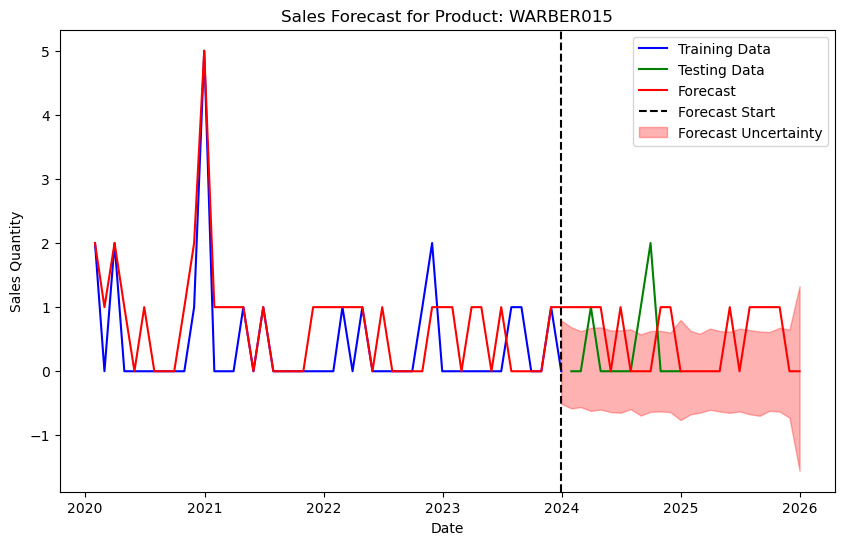

Forecasting for Item: WARBER016
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 10.0}, Best RMSE: 1.4811950612068956
MAE: 1.4166666666666667, MSE: 3.25, RMSE: 1.8027756377319946
Execution time: 11.64 seconds


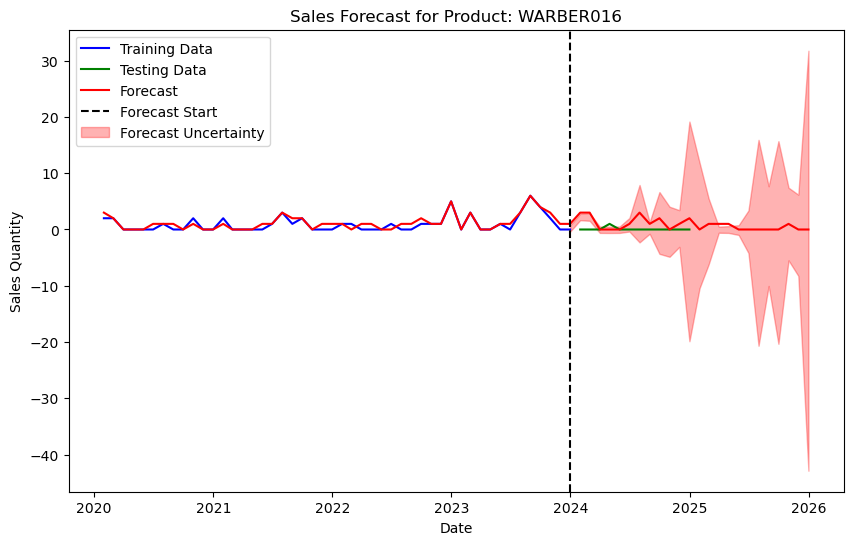

Forecasting for Item: WARBER022
Best Params: {'seasonality_mode': 'multiplicative', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 1.0}, Best RMSE: 0.5985076957701251
MAE: 0.5833333333333334, MSE: 0.75, RMSE: 0.8660254037844386
Execution time: 35.55 seconds


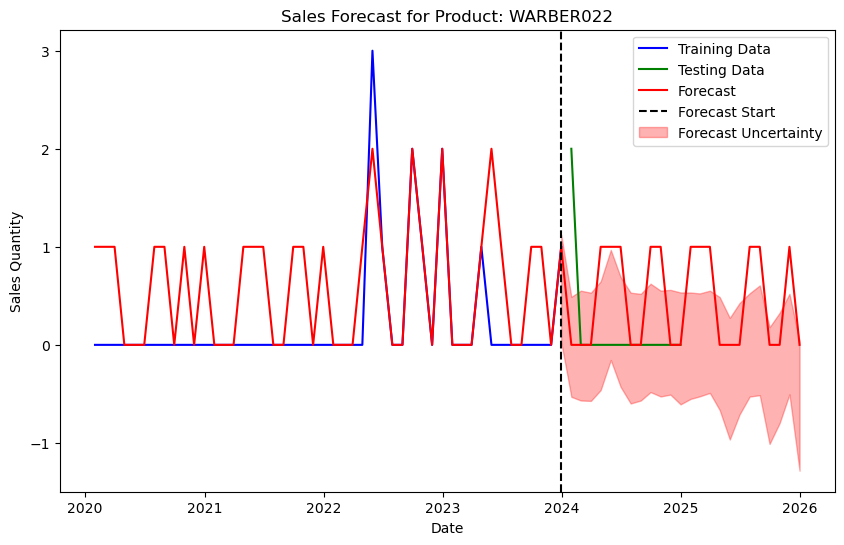

Forecasting for Item: WARBER023
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 2.5, 'seasonality_prior_scale': 1.0}, Best RMSE: 0.4442519372480339
MAE: 0.8333333333333334, MSE: 0.8333333333333334, RMSE: 0.9128709291752769
Execution time: 59.20 seconds


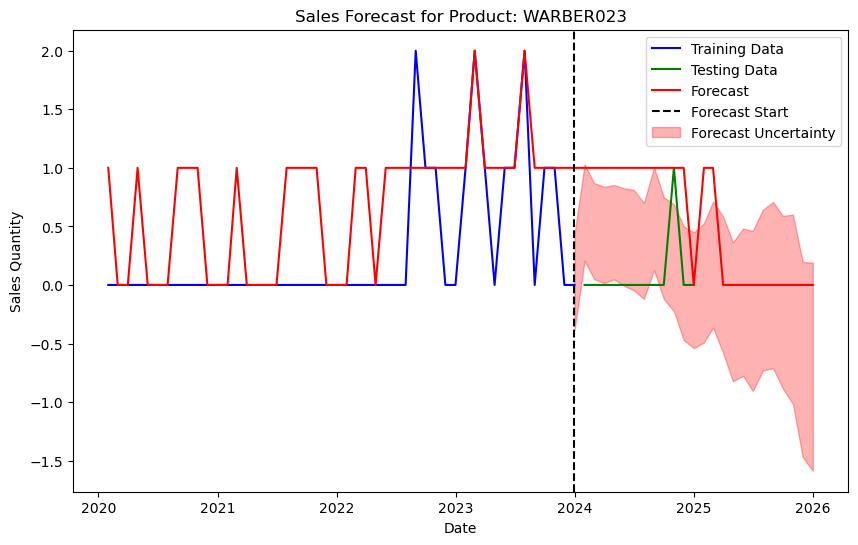

Forecasting for Item: WARBER024
Best Params: {'seasonality_mode': 'additive', 'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 1.0}, Best RMSE: 0.47438831074251203
MAE: 0.8333333333333334, MSE: 0.8333333333333334, RMSE: 0.9128709291752769
Execution time: 83.56 seconds


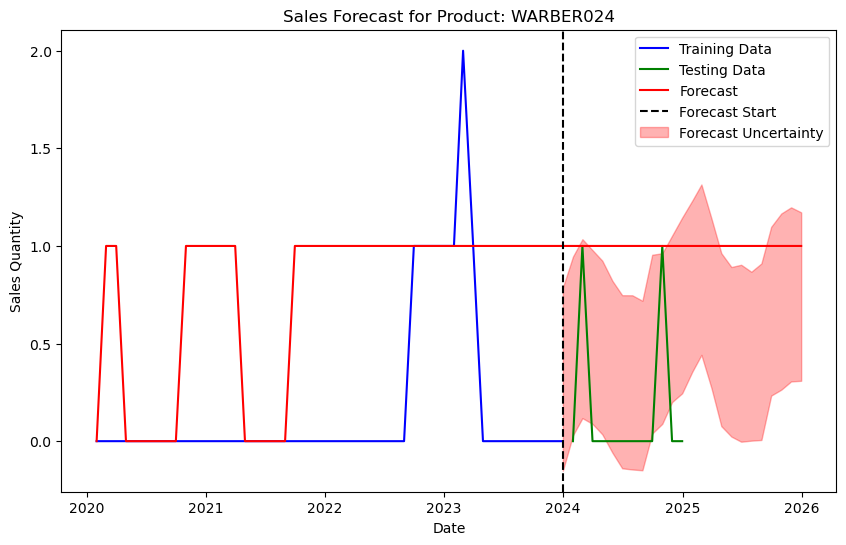

In [47]:
import logging
logging.getLogger('prophet').setLevel(logging.WARNING)
logging.getLogger("cmdstanpy").disabled=True

def forecast_sales_best(ProductNumber, data_filled, horizon_months=12):
    # Record the start time
    start_time = time.time()
    
    # Filter data for the specific store and item
    filtered_data = data_filled[(data_filled['ProductNumber'] == ProductNumber)]
    
    if filtered_data.empty:
        print(f"No data available for Item: {ProductNumber}")
        return None
    
    # Prepare data for Prophet
    df_prophet = filtered_data[['month', 'Sum of InvoicedQuantity']].rename(columns={'month': 'ds', 'Sum of InvoicedQuantity': 'y'})

    # Split the data into training and testing sets
    split_date = pd.Timestamp("2024-01-01") 
    train_data = df_prophet[df_prophet['ds'] < split_date]
    test_data = df_prophet[df_prophet['ds'] >= split_date]

    test_data = test_data.copy()
    test_data['ds'] = pd.to_datetime(test_data['ds']) 
    

    # Define hyperparameter grid
    param_grid = {
        'seasonality_mode': ['additive', 'multiplicative'],
        'changepoint_prior_scale': [0.05, 0.1, 2.5],
        'seasonality_prior_scale': [1.0, 5.0, 10.0]
    }
    
    # Generate all combinations of hyperparameters
    all_params = [dict(zip(param_grid.keys(), v)) for v in product(*param_grid.values())]
    
    best_params = None
    best_rmse = float('inf')
    results = []

    # Grid Search
    for params in all_params: 
        #print(f"Testing params: {params}")
        model = Prophet(
            seasonality_mode=params['seasonality_mode'],
            changepoint_prior_scale=params['changepoint_prior_scale'],
            seasonality_prior_scale=params['seasonality_prior_scale'],
            weekly_seasonality=False,
            daily_seasonality=False)
        model.fit(train_data)
        future = model.make_future_dataframe(periods=len(test_data), freq='ME')
        forecast = model.predict(future)
        forecast_test = forecast
        
        # Evaluate forecast accuracy on test data
        test_data_eval = test_data.copy()

        # Ensure both 'ds' columns are in datetime format
        forecast_test['ds'] = pd.to_datetime(forecast_test['ds']) 
        test_data_eval['ds'] = pd.to_datetime(test_data_eval['ds']) 

        # Merge forecast and test data
        merged_data = pd.merge(forecast_test[['ds','yhat']], test_data_eval[['ds','y']], on='ds', how='left').dropna()
        # print (merged_data)        
        # Calculate RMSE
        rmse = root_mean_squared_error(merged_data['y'], merged_data['yhat'])
        #print(f"RMSE: {rmse}")
        
        # Store the results
        results.append({**params, 'rmse': rmse})
        
        # Update best params if current RMSE is lower
        if rmse < best_rmse:
            best_rmse = rmse
            best_params = params

    # Output best params
    print(f"Best Params: {best_params}, Best RMSE: {best_rmse}")
    
    # Train and forecast using the best params
    best_model = Prophet(
        seasonality_mode=best_params['seasonality_mode'],
        changepoint_prior_scale=best_params['changepoint_prior_scale'],
        seasonality_prior_scale=best_params['seasonality_prior_scale'],
        weekly_seasonality=False,
        daily_seasonality=False
        )
    best_model.fit(train_data)
    
    future = best_model.make_future_dataframe(periods=len(test_data) + horizon_months, freq='ME')
    best_forecast = best_model.predict(future)

    # Round up the forecast values and Replace negative values with zero after rounding
    best_forecast['yhat'] = np.ceil(best_forecast['yhat']).clip(lower=0)
    
    # Extract forecasted values for the test period
    forecast_test = best_forecast[best_forecast['ds'].isin(test_data['ds'])]

        
    evaluation_df = pd.merge(
    test_data.rename(columns={'y': 'actual'}),
    forecast_test[['ds', 'yhat_lower','yhat_upper', 'yhat']],
    on='ds', how='left')

    # Evaluate forecast accuracy
    if not evaluation_df.empty:
        mae = mean_absolute_error(evaluation_df['actual'], evaluation_df['yhat'])
        mse = mean_squared_error(evaluation_df['actual'], evaluation_df['yhat'])
        rmse = root_mean_squared_error(evaluation_df['actual'], evaluation_df['yhat'])
        evaluation_df['MAE'] = mae
        evaluation_df['MSE'] = mse
        evaluation_df['RMSE'] = rmse
        print(f"MAE: {mae}, MSE: {mse}, RMSE: {rmse}")
    else:
        print(f"Test data for Product: {ProductNumber} training period. Skipping accuracy calculation.")
  
    # Record the end time
    end_time = time.time()
    
    # Calculate execution time
    execution_time = end_time - start_time
    
    # Append execution time as a column
    evaluation_df['execution_time_seconds'] = execution_time
    print(f"Execution time: {execution_time:.2f} seconds")
    
    # Plot the results
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.plot(train_data['ds'], train_data['y'], label="Training Data", color="blue")
    ax.plot(test_data['ds'], test_data['y'], label="Testing Data", color="green")
    ax.plot(best_forecast['ds'], best_forecast['yhat'], label="Forecast", color="red")
    
    # Add a vertical dotted line at the forecast start point
    forecast_start_date = train_data['ds'].iloc[-1]
    ax.axvline(forecast_start_date, color='black', linestyle='--', label="Forecast Start")
    
    # Shade the forecasted area in red
    ax.fill_between(
        best_forecast['ds'],
        best_forecast['yhat_lower'],
        best_forecast['yhat_upper'],
        where=(best_forecast['ds'] >= forecast_start_date),
        color='red',
        alpha=0.3,
        label="Forecast Uncertainty"
    )
    
    ax.set_title(f"Sales Forecast for Product: {ProductNumber}")
    ax.set_xlabel("Date")
    ax.set_ylabel("Sales Quantity")
    ax.legend()
    plt.show()

    
    return evaluation_df, best_forecast

# Get unique item
item_combinations = data_filled[['ProductNumber']].drop_duplicates()

# Initialize containers for results
evaluation_results_best = []
forecast_results_best = []

# Perform forecasting for each store-item combination
for _, row in item_combinations.iterrows():
    ProductNumber = row['ProductNumber']
    print(f"Forecasting for Item: {ProductNumber}")
    evaluation_df_best, forecast_best = forecast_sales_best(ProductNumber, data_filled, horizon_months=12)
    
    if evaluation_df_best is not None and forecast_best is not None:
        evaluation_df_best['ProductNumber'] = ProductNumber
        forecast_best['ProductNumber'] = ProductNumber
        
        evaluation_results_best.append(evaluation_df_best)
        forecast_results_best.append(forecast_best)

# Combine all results into separate DataFrames
evaluation_df_best_comb = pd.concat(evaluation_results_best, ignore_index=True)
forecast_df_best_comb = pd.concat(forecast_results_best, ignore_index=True)

In [48]:
# Save results to CSV
evaluation_df_best_comb.to_csv("evaluation_df_best_results.csv", index=False)
forecast_df_best_comb.to_csv("forecast_df_best_results.csv", index=False)